# TRAFFIC SIGN RECOGNITION CNN

Here we will implement in python using tensorflow a convolutional neural network created for traffic sign recognition.

We will recreate a CNN using the architecture and dataset described in this paper https://link.springer.com/article/10.1007/s11042-022-12531-w

We will use only GTSRB dataset which is a German Traffic Sign dataset used to train, validate and test out CNN.

Noew we import the dataset into the python code

In [30]:
import tensorflow as tf
import keras
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

Use Tensorflow GPU

In [31]:
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    for gpu in gpus:
        print("Found a GPU with the name:", gpu)
else:
    print("Failed to detect a GPU.")
gpus

[]

now we read train images and their labels from GTSRB dataset as done in this notebook
https://github.com/sonu275981/GTSRB---German-Traffic-Sign-Recognition/blob/main/GTSRB%20-%20German%20Traffic%20Sign%20Recognition%20Benchmark.ipynb

In this dataset there are 43 classes of traffic signs. In the "train" folder we have folder numerated from 0 to 42. In the folder d there are all images of signs associated to label d.

Dataset took from https://www.kaggle.com/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign?resource=download

First, create a function to import the dataset

In [32]:
from PIL import Image
import os
import numpy as np

def load_dataset(path):
    data = []
    labels = []
    classes = 43
    
    
    
    #Retrieving the images and their labels
    for i in range(classes):
        pt = os.path.join(path,str(i))
        images = os.listdir(pt)
    
        for a in images:
            try:
                image = Image.open(pt + '/'+ a)
                image = image.resize((32,32))
                image = np.array(image)
    
                #data.append(image)
                #labels.append(i)
                data.append([image,i]) #appending all value together
            except:
                print("Error loading image")
    return data

In [33]:
data=load_dataset("./Train")

All images are resized in order to be a 32x32px images

now we create the dataset of images

In [34]:
X=[]
y=[]

for features,target in data:
  X.append(features)
  y.append(target)

Divide the dataset into validation and train dataset, respectivel 70% train as said into the paper

In [35]:
from sklearn.model_selection import train_test_split
#Converting lists into numpy arrays
X = np.array(X)
y = np.array(y)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

print(X_train.shape,y_train.shape)

So we have 39209 images all of them are tensors 30x30x3 so with 3 channels (representing red, green and blue).

We use 27446 of them as training set.

Let's now scale features in order to have values not between 0 and 255 in tensors but between 0 and 1.

In [36]:
X_train=X_train/255.0
X_val=X_val/255.0

Let's not create our convolutional neural network as expressend in the paper

In [50]:
model = tf.keras.Sequential([
    layers.Conv2D(32, (5,5), activation="relu",input_shape=(32, 32, 3)),
    layers.Conv2D(32, (3,3), activation="relu",input_shape=(28, 28, 32)),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Dropout(0.2),
    layers.Conv2D(64, (3,3), padding="same", activation="relu",input_shape=(13, 13, 32)),
    layers.Conv2D(64, (3,3), activation="relu",input_shape=(13, 13, 64)),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Dropout(0.2),
    layers.Flatten(),  #converts tensor into 1d vector
    layers.Dense(units=43,activation=tf.keras.activations.softmax)
])
print(model.summary())

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 32)     │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 26, 26, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 11, 11, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 43)             │        68,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 135,947 (531.04 KB)

 Trainable params: 135,947 (531.04 KB)

 Non-trainable params: 0 (0.00 B)

Now let's train the model as done in the paper, by using a cross-entropy loss and Adam optimizer (with learning rate of 0.001) as algorithm to minimize the loss and a batch size of 128.

We use 5 epochs to train our NN and use the training dataset for train and for each epoch, track the performance on the validation dataset (using accuracy, precision and recall as metrics) in order to see how well the model performs on unseen data

In [37]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])

In [ ]:
history=model.fit(X_train,y_train,batch_size=128,epochs=10,validation_data=(X_val,y_val))

Trained our model we wil save it on a file

In [15]:
model.save_weights("Model.weights3.h5")

In [38]:
model.load_weights("Model2.weights.h5")

Once trained the neural network we print what the model output looks like

In [8]:
sample = X_val[0].reshape((1,32,32,3))
output=model.predict(sample)

print("NN output:",output)
print("Real label associated to the sample:",y_val[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
NN output: [[6.0943295e-16 1.8071890e-13 5.6228763e-13 3.4241820e-16 1.8797096e-13
  2.1854561e-13 1.0800930e-22 4.5204658e-15 1.4808746e-15 4.8681389e-15
  8.6785276e-15 1.0824316e-07 5.4492679e-16 5.8427691e-19 3.4073104e-22
  1.2099549e-16 2.4669313e-14 2.3065784e-19 4.5301704e-04 6.2762943e-08
  6.5160233e-09 6.1673505e-10 8.2793362e-16 8.5198192e-14 1.6469701e-05
  6.9208285e-11 9.9952078e-01 9.6153262e-06 4.8809321e-15 4.5497348e-16
  1.2223528e-13 8.9520286e-16 3.4603036e-17 1.1474292e-17 1.8028850e-21
  1.4277529e-18 3.7447624e-18 2.1713036e-14 1.6476970e-17 2.4043353e-18
  1.8170324e-13 3.7795699e-15 4.8144584e-20]]
Real label associated to the sample: 26


So the NN since implement a softmax output layer, output a vector of 43 elements in which the $j$-the element represent the probability that $x$ is classified as label $j$.

So now we implement a function that given this vector, returns the heighest probability and the label class with the highest probability.


In [39]:
def out_label(prob_vector):
  max_proba=max(prob_vector)
  predicted_label,=np.where(prob_vector==max_proba)
  return max_proba, predicted_label[0]

Now let's see if the previous prediction was correct

In [12]:
highest_proba, predicted_label=out_label(output[0])
print("NN output label:",predicted_label,"with a probability of:",highest_proba)
print("Real label associated to the sample:",y_val[0])

NN output label: 26 with a probability of: 0.9995208
Real label associated to the sample: 26


Good, the NN works. Let's now test it on the validation dataset and see the performance of the network in terms of:<br>
- Accuracy<br>
$\frac{TP+TN}{TP+FP+TN+FN}$
- Precision<br>
$\frac{TP}{TP+FP}$<br>
Precision for class $j$ represent the probability that a sample classified as $j$ is effectively labeled as $j$.
- Recall<br>
$\frac{TP}{TP+FN}$<br>
Recall for class $j$ represent the probability that the model correctly classify as $j$ a sample labeled with $j$.

In [26]:
def evaluate_model(model, X_test, y_test):
  predicted_labels=[]

  output=model.predict(X_test)

  for o in output:
    highest_proba, predicted_l=out_label(o)
    predicted_labels.append([predicted_l])

  predicted_labels=np.array(predicted_labels)
  y_test=np.array([[y] for y in y_test])

  #now we got the vector of predicted labels for each of the samples in the validation dataset
  #calculate the accuracy
  accuracy_metric=keras.metrics.Accuracy()
  accuracy_metric.update_state(y_test, predicted_labels)
  accuracy=accuracy_metric.result().numpy()

  #let's now calculate precision and recall which refers to single classes
  precisions=[]
  recalls=[]

  for label in range(43):
    y_true=np.where(y_test==[label],1,0)
    y_pred=np.where(predicted_labels==[label],1,0)

    #calculate precision
    precision_metric=keras.metrics.Precision()
    precision_metric.update_state(y_true, y_pred)
    precisions.append(precision_metric.result().numpy())

    #calculate recall
    recall_metric=keras.metrics.Recall()
    recall_metric.update_state(y_true, y_pred)
    recalls.append(recall_metric.result().numpy())

  return accuracy,precisions,recalls

acc,precisions,recalls=evaluate_model(model,X_val,y_val)

368/368 ━━━━━━━━━━━━━━━━━━━━ 0s 533us/step


In [27]:
print("Models metrics on validation set are:")
print("Accuracy:",acc)
print("Average precision:",np.average(precisions))
print("Average recall:",np.average(recalls))
print("\n")
print('| {:^10} | {:^10} | {:^10} |'.format(*["Class","Precision","Recall"]))
for p in range(43):
  r=recalls[p]
  pr=precisions[p]
  print('| {:^10} | {:^10.2f} | {:^10.2f} |'.format(*[p,pr,r]))

Models metrics on validation set are:
Accuracy: 0.9960044
Average precision: 0.99512804
Average recall: 0.99542314


|   Class    | Precision  |   Recall   |
|     0      |    0.98    |    1.00    |
|     1      |    1.00    |    0.99    |
|     2      |    0.99    |    1.00    |
|     3      |    1.00    |    1.00    |
|     4      |    1.00    |    1.00    |
|     5      |    0.99    |    0.99    |
|     6      |    1.00    |    0.99    |
|     7      |    1.00    |    1.00    |
|     8      |    1.00    |    0.99    |
|     9      |    1.00    |    0.99    |
|     10     |    0.99    |    1.00    |
|     11     |    1.00    |    1.00    |
|     12     |    1.00    |    1.00    |
|     13     |    1.00    |    1.00    |
|     14     |    1.00    |    1.00    |
|     15     |    1.00    |    1.00    |
|     16     |    1.00    |    1.00    |
|     17     |    1.00    |    1.00    |
|     18     |    1.00    |    1.00    |
|     19     |    1.00    |    0.99    |
|     20     |    0.99

Let's now plot the accuracy and the loss on train and validaton dataset uring each epoch in the training process.

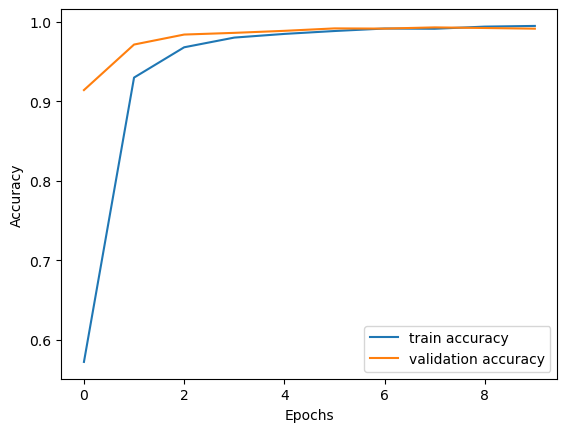

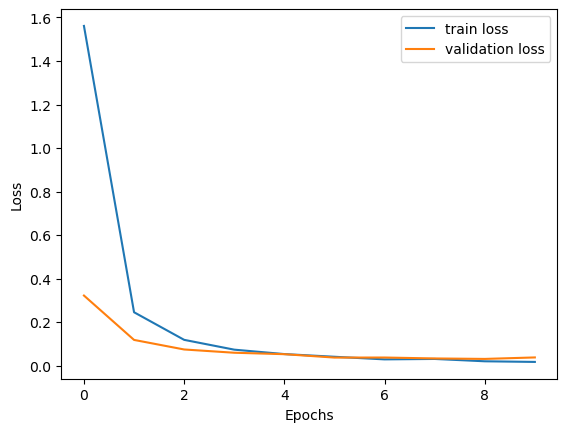

In [17]:
plt.plot(range(10), history.history["accuracy"], label="train accuracy")
plt.plot(range(10), history.history["val_accuracy"], label="validation accuracy")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()

plt.plot(range(10), history.history["loss"], label="train loss")
plt.plot(range(10), history.history["val_loss"], label="validation loss")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

# IMPLEMENT EVASION BLACKBOX ATTACK (ZEROTH-ORDER OPTIMIZATION)

The evasion attack that we are going to implement on the model is calld zeroth-order optimization attack, a black-box evasion targeted attack that plans to generate adversarial examples.

Our sperimentation focus on stop signs, which has class number 14 on the GTSRB dataset.

Our goal is to create adversarial examples for stop signs (class 14) in order to let the model classify them as 50 speed limit signs (class 2).

In order to do this we can take an example $x$ of stop sign from which start creating our first adversarial example $x'$ by using zeroth-order optimization.

This attack plans to find the adversarial example $x'$ such that solves this minimization problem:<br>
$\min_{x'} ||x-x'||_2^2+λ*f(x',t)$<br>
With $x$ the example on which we are basing, $λ$ a regularization parameter, $t$ the target class that in our case is class 2 (50 speed limit signs) and $f(x',t)$ which is a function that represent the probability of attack's failure.

The function $||x'-x||_2^2$ represent the distance between the example $x$ and the adversarial exmaple $x'$.

So by solving the minimization problem we find an adversarial example such that the difference between it and $x$ is minimum and the probability of unsuccess of the attack is also minimum.

The function $f$ is defined as follows:<br>
$f(x',t)=\max \{\max_{i\neq t} \log(a_i^{(x')}) -\log(a_t^{(x')}),-k\}$<br>
With $a_j^{(x')}$ the probability that example $x'$ is classified as $y=j$ and so $a_j^{(x')}=P(y=j|x')$.<br>
The term $k$ is another constant that ensures a constant gap between $\max_{i\neq t} \log(a_i^{(x')})$ and $\log(a_t^{(x')})$.

The evasion attack success if the model misclassify an adversarial example as 50 speed limit sign.
<br><br>
In order to solve this optimization problem we use gradient optimization algorthim which plans to compute derivatives of the objective function in order to update parameter $x$ until its value become closer enought to the minimum $x'$.

Since we do not know the explicit formula of $a_j^{(x)}$, since it's an internal information to the NN and being in a black-box attack we do not have access to it, we are going to approximate the value of the derivative of $f$ by using the simmetric diference quotient as follows:<br>
$\hat{g_i}:=\frac{∂f}{∂x_i}(x)≈\frac{f(x+he_i)-f(x-he_i)}{2h}$<br>
With $h$ a small constat value, and $e_i$ the basis vector that has all zeros and only 1 at $i$-th position.

Let's start implementing some functions that we need in order to perform this attack.

Find an example to generate the adversarial example.

As example we will take the image classified as a stop sign with the lowest probability among all images classified as stop signs

In [40]:
def find_lowest_class_probabile_images(X,y,model,label,n):
  '''
  Find first n images classified as label "label" with the lowest probabilty
  
  returns the vector of the first n images and relative probabilities, classified as "label" with the lowest probabilty
  (ex. [{"proba":0.97,"image":...},...])
  '''
  model_predictions_label=[]

  #calculate probabilities for all images
  probs=model.predict(X)

  #for all preditions
  for i in range(probs.shape[0]):
    #get ouput label
    highest_proba, predicted_label=out_label(probs[i])

    #if the output label is "label"
    if predicted_label==label:
      #store the image and predicted probability of its
      model_predictions_label.append({"proba":highest_proba,"image":X[i]})
  
  #order the array of images classified as stop signs from the lowest probability to the hightest
  ordered_predictions=sorted(model_predictions_label, key=lambda d: d['proba'])

  #return first n elements of this array
  return ordered_predictions[:n]

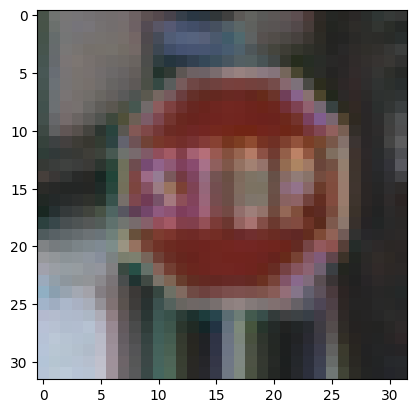

In [41]:
#get first 20 images classified as stop signs with the lowest probability among validation dataset
lowest_prob_images_stop_sign=find_lowest_class_probabile_images(X_val,y_val,model,14,20)

#print the image classified as stop sign with the lowest probability
print("Image probability:",lowest_prob_images_stop_sign[0]["proba"])
plt.imshow(lowest_prob_images_stop_sign[0]["image"])
plt.show()

That's the image of a stop sign that is classified as a stop sign with the lowest probability.

We will use this image as beginner sample in order to create our adversarial example using zeroth-order optimization attack.

# ZOO ATTACK

Install library for adverarial attacks

In [27]:
%%cmd
pip install adversarial-robustness-toolbox

Microsoft Windows [Versione 10.0.19045.4170]
(c) Microsoft Corporation. Tutti i diritti sono riservati.

(base) C:\Users\utente\Desktop\uni\tesi\Evasion attack on traffic sign recognition cnn>pip install adversarial-robustness-toolbox
  Obtaining dependency information for adversarial-robustness-toolbox from https://files.pythonhosted.org/packages/dd/65/53415b152d88e24342d21f1a5dd6c5b7b277524459ac1d5b338638921454/adversarial_robustness_toolbox-1.17.1-py3-none-any.whl.metadata
   ---------------------------------------- 1.7/1.7 MB 275.9 kB/s eta 0:00:00

(base) C:\Users\utente\Desktop\uni\tesi\Evasion attack on traffic sign recognition cnn>

Import zeroth-order optimization attack

In [42]:
import art.attacks.evasion.zoo as zoo

# ZOO UNTARGETED ATTACK

Create zeroth-order optimization object in order to perform the attack

In [43]:
from art.estimators.classification import TensorFlowV2Classifier
import logging

#set log file for zoo attack
zoo.logging.basicConfig(filename='ZOO-Attack.log', level=logging.INFO)

loss_object = tf.keras.losses.sparse_categorical_crossentropy
optimizer = tf.keras.optimizers.Adam(0.001)
clf = TensorFlowV2Classifier(
    model=model,
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=43,
    input_shape=(32, 32, 3),
    clip_values=(0, 1), #mx and min value allowe for features X. Since we initial rescaled the dataset, max=1 and min=0
)

In [44]:
zooAtk=zoo.ZooAttack(classifier=clf, targeted=False, learning_rate=1e-2, max_iter=1000, confidence=2.0,
                binary_search_steps=9, use_resize=False, initial_const=0.001, abort_early=True,
                use_importance=False, nb_parallel=10, batch_size=1, variable_h=0.2452)

#take images classified as stop sign with the lowest probability
lowest_prob_images_stop_sign_imgs=[i["image"] for i in lowest_prob_images_stop_sign]

Perform the attack on the sample classified as stop sign with lowest prob in order to get an adversarial example

In [124]:
x_test_adv = zooAtk.generate(np.array(lowest_prob_images_stop_sign_imgs))

ZOO: 100%|██████████| 20/20 [47:41<00:00, 143.06s/it]


Show the adversarial examples images generated with zoo attack

In [127]:
def show_images(imgs):
    # create figure 
    fig = plt.figure(figsize=(10, 7)) 

    # setting values to rows and column variables 
    rows = int(np.sqrt(imgs.shape[0]))+1
    columns = int(np.sqrt(imgs.shape[0]))+1
    
    for i in range(1,imgs.shape[0]+1):
        # Adds a subplot at the 1st position 
        fig.add_subplot(rows, columns, i) 

        # showing image 
        plt.imshow(imgs[i-1].reshape((32,32,3))) 
        plt.axis('off') 
        plt.title(i) 

Generated Adversarial Examples


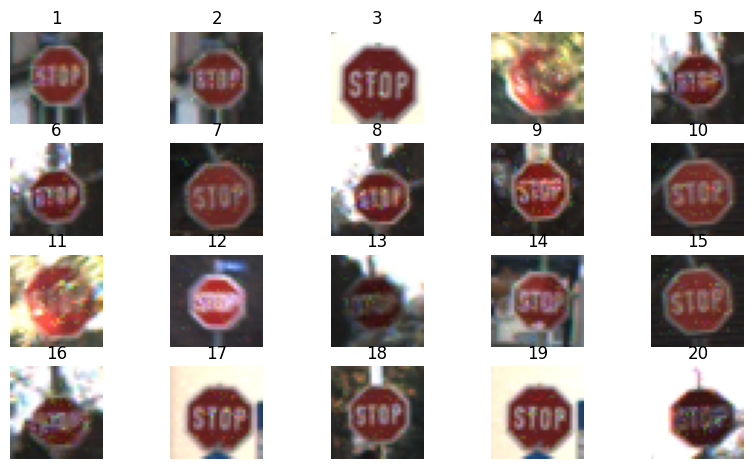

In [128]:
print("Generated Adversarial Examples")
show_images(x_test_adv)
plt.show()

Caculate the L2 norm of the the difference between original samples and adversarial examples

In [129]:
from numpy import linalg as LA

#array of L2 norms
l2_norms=[]

for i in range(x_test_adv.shape[0]):
    diff=x_test_adv[i].ravel()-lowest_prob_images_stop_sign_imgs[i].ravel()
    norm=LA.norm(diff, 2)
    l2_norms.append(norm)
    print("Example ",i+1,"L2 Norm of Difference",norm)

print("\n\nAverage L2 Norm of Difference: ",np.average(np.array(l2_norms)))

Example  1 L2 Norm of Difference 0.6859288903429156
Example  2 L2 Norm of Difference 0.7364624701834697
Example  3 L2 Norm of Difference 1.1411378834391055
Example  4 L2 Norm of Difference 1.5175857469889265
Example  5 L2 Norm of Difference 0.8379160872610495
Example  6 L2 Norm of Difference 0.9703067964587704
Example  7 L2 Norm of Difference 1.1302753428464527
Example  8 L2 Norm of Difference 1.4953377729875155
Example  9 L2 Norm of Difference 1.6859178892040378
Example  10 L2 Norm of Difference 1.127420144070386
Example  11 L2 Norm of Difference 2.082118987115579
Example  12 L2 Norm of Difference 1.1722599546504147
Example  13 L2 Norm of Difference 0.718560846518243
Example  14 L2 Norm of Difference 1.0067525870979777
Example  15 L2 Norm of Difference 1.4998975496951428
Example  16 L2 Norm of Difference 1.353494493430438
Example  17 L2 Norm of Difference 1.553030904166056
Example  18 L2 Norm of Difference 1.1357706583520295
Example  19 L2 Norm of Difference 1.4084269782125265
Example

In [130]:
#calculate model's predictions for adversarial examples
pred_vector_adv=clf.predict(x_test_adv)
    
#get predicted label
pred_labels_adv=np.array([np.argmax(p) for p in pred_vector_adv])
    
#get number of adv samples not predicted as stop signs
success_advs=len([p for p in pred_labels_adv if p!=14])
    
#calculate success rate
success_rate=success_advs/pred_labels_adv.shape[0]
    
#calculate average norm
avg_norm=np.average(np.array([LA.norm(x_test_adv[i].ravel()-lowest_prob_images_stop_sign_imgs[i].ravel(),2) for i in range(x_test_adv.shape[0])]))
    
#return difference between success rate and avg norm 
#output is maximum when avg->0 and success_rate->1

print("Success rate=",success_rate)
print("avg_norm=",avg_norm)

Success rate= 0.55
avg_norm= 1.2378974289582456


Let the model predict on created adversarial examples

In [65]:
def show_images_adv_pred(imgs):
    # create figure 
    fig = plt.figure(figsize=(10, 7)) 
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=1.1, 
                    top=1.7, 
                    wspace=0.4, 
                    hspace=0.4)

    # setting values to rows and column variables 
    rows = int(np.sqrt(imgs.shape[0]))+1
    columns = int(np.sqrt(imgs.shape[0]))+1
    
    for i in range(1,imgs.shape[0]+1):
        # Adds a subplot at the ith position 
        fig.add_subplot(rows, columns, i) 

        # showing image 
        plt.imshow(imgs[i-1]["image"].reshape((32,32,3))) 
        plt.axis('off') 
        plt.title(str(imgs[i-1]["real_label"])+"→"+str(imgs[i-1]["predicted_label"])+
                  "\n Label "+str(imgs[i-1]["predicted_label"])+" Prob: "+
                 str(round(imgs[i-1]["predicted_proba"],3))+"\n Stop Sign Prob: "+str(round(imgs[i-1]["stop_sign_proba"],3))+
                 "\n L2 Norm: "+str(round(imgs[i-1]["difference"],3)))

In [66]:
pred_vector_adv=clf.predict(x_test_adv)
pred_imgs_adv=[]


for i in range(pred_vector_adv.shape[0]):
    #calculate predicted label
    label_pred_adv = np.argmax(pred_vector_adv[i])
    
    #calulate predicted label proba
    prob_pred_adv = np.max(pred_vector_adv[i])
    
    #calculate stop sign proba
    stop_sign_proba = pred_vector_adv[i][14]
    
    #calculate norm l2 of the difference between adversarial example and original example
    diff=LA.norm(x_test_adv[i].ravel()-lowest_prob_images_stop_sign_imgs[i].ravel(),2)
    
    pred_imgs_adv.append({"image":x_test_adv[i],"predicted_label":label_pred_adv,"real_label":14,
                          "predicted_proba":prob_pred_adv,"stop_sign_proba":stop_sign_proba,"difference":diff})

Model's Predictions on adversarial examples
True Label->Predicted Label


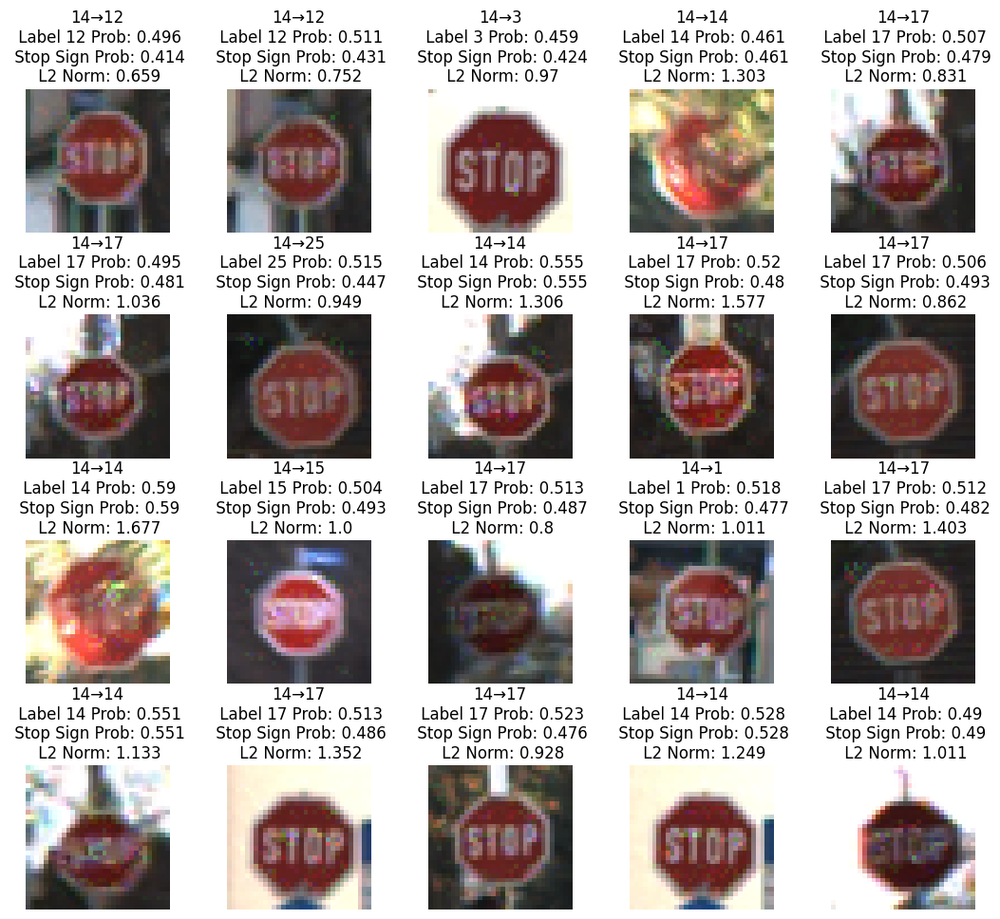

In [67]:
print("Model's Predictions on adversarial examples")
print("True Label->Predicted Label")
show_images_adv_pred(np.array(pred_imgs_adv))

Save adversarial exmaples as file images

In [25]:
n_image=0
for x_adv in x_test_adv:
    rescaled = (255.0 / x_adv.max() * (x_adv - x_adv.min())).astype(np.uint8)
    im = Image.fromarray(rescaled)
    im.save(".\\Risultati Attacchi Zoo\\Untargeted Bayesian Opt\\1000 iterazioni\\adversarial images\\"+str(n_image)+"_adv.png")
    n_image=n_image+1

# ZOO TARGETED ATTACK

In [48]:
zooAtk=zoo.ZooAttack(classifier=clf, targeted=False, learning_rate=1e-2, max_iter=1000, confidence=1.8,
                binary_search_steps=9, use_resize=False, initial_const=0.01, abort_early=True,
                use_importance=False, nb_parallel=10, batch_size=1, variable_h=0.2452)

In [49]:
#take images classified as stop sign with the lowest probability
lowest_prob_images_stop_sign_imgs=[i["image"] for i in lowest_prob_images_stop_sign]

#create target class values one-encoded. Create a matrix with number of row equals to the samples on which do the attack and 
#number of columns equals to the 43 classes. For each row we will have all 0 and 1 only at the column t with t the target class
#in our case the tragte class is 2
target_values_for_attack=np.zeros((len(lowest_prob_images_stop_sign_imgs),43))

#set 1 only in the second column in order to indicate that target class is 2
target_values_for_attack[:,2]=[1]*len(lowest_prob_images_stop_sign)

In [ ]:
x_test_adv = zooAtk.generate(np.array(lowest_prob_images_stop_sign_imgs),np.array([target_values_for_attack]))

# FIND BEST PARAMETERS FOR THE ZOO ATTACK WITH BAYESIAN OPTIMIZATION

In order to find best values for c, h and confidence parameter, such that the number of misclassified adversarial samples is highest, we can use an optimization method that finds the best values for previously parameters that maximize an objective function.

As objective function we create a function which has c,h and confidence as input paramaters and generates adversarial examples via zoo attack, use the model to classify advsersarial examples, getting the probability that the example is classified as a sto sign. Finally the function return 1 - the average probability of the vector of probabilities of all adversarial examples. This way the returned value will be low if most of adversarial examples are classified as stop signs and high otherwise.

As oprimization method we use the bayesian optimization method https://bayesian-optimization.github.io/BayesianOptimization/index.html which plans to find best values for paramaters in the lowest number of iterations possible

In [19]:
%%cmd
pip install bayesian-optimization

Microsoft Windows [Versione 10.0.19045.4170]
(c) Microsoft Corporation. Tutti i diritti sono riservati.

(base) C:\Users\utente\Desktop\uni\tesi\Evasion attack on traffic sign recognition cnn>pip install bayesian-optimization

(base) C:\Users\utente\Desktop\uni\tesi\Evasion attack on traffic sign recognition cnn>

Define the objective function

In [26]:
from numpy import linalg as LA 

def zoo_performances(c,h,confidence):

    #print("initial const: ",c,", confidence: ", confidence,", h: ", h)
    
    #define the zoo attack object using input paramaters
    zooAtk=zoo.ZooAttack(classifier=clf, confidence=confidence, targeted=False, learning_rate=1e-2, max_iter=500,
                binary_search_steps=9, initial_const=c, abort_early=True, use_resize=False, 
                use_importance=False, nb_parallel=10, batch_size=1, variable_h=h) 

    #generate adversarial examples
    x_test_adv = zooAtk.generate(np.array(lowest_prob_images_stop_sign_imgs))
    
    #calculate model's predictions for adversarial examples
    pred_vector_adv=clf.predict(x_test_adv)
    
    #get predicted label
    pred_labels_adv=np.array([np.argmax(p) for p in pred_vector_adv])
    
    #get number of adv samples not predicted as stop signs
    success_advs=len([p for p in pred_labels_adv if p!=14])
    
    #calculate success rate
    success_rate=success_advs/pred_labels_adv.shape[0]
    
    #calculate average norm
    avg_norm=np.average(np.array([LA.norm(x_test_adv[i].ravel()-lowest_prob_images_stop_sign_imgs[i].ravel(),2) for i in range(x_test_adv.shape[0])]))
    
    #return difference between success rate and avg norm 
    #output is maximum when avg->0 and success_rate->1

    print("Success rate=",success_rate)
    print("avg_norm=",avg_norm)
    if avg_norm==0:
        return -100
    else:
        return success_rate-avg_norm

In [33]:
zoo_performances(0.01,0.05,0.0)

ZOO:   0%|          | 0/20 [00:00<?, ?it/s]/home/colucci/Tesi/venv/lib/python3.11/site-packages/art/attacks/evasion/zoo.py:552: RuntimeWarning: invalid value encountered in scalar divide
  grads = np.array([(losses[i] - losses[i + 1]) / (2 * self.variable_h) for i in range(0, len(losses), 2)])
ZOO: 100%|██████████| 20/20 [04:14<00:00, 12.72s/it]


1.0

Implement bayesian optimization

In [40]:
from bayes_opt import BayesianOptimization, UtilityFunction

# define thebounded space for parameters c,h,confidence
#pbounds = {'c': (0,1), 'h': (0,1), 'confidence':(-5,5)}
#decided to try only positive confidence since with negative values, generated adversarial examples has a zoo_performancs of -100
#pbounds = {'c': (0.001,0.99), 'h': (0.001,0.99), 'confidence':(0,5)}
#decide to lock c=(0.001,0.1) since best results (sucecss_rate>60%) has reached with this value for c
#pbounds = {'c': (0.001,0.1), 'h': (0.001,0.99), 'confidence':(0,5)}
#decide to try only c=0.001
pbounds = {'c': (0.001,0.001), 'h': (0.001,0.99), 'confidence':(0,5)}

#define the optimizer
optimizer = BayesianOptimization(
    f=zoo_performances,
    pbounds=pbounds,
    verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
)

Register some past values found by running bayes_opt before

In [41]:
past_bayes_opt_results=[
    {'params':{'c':0.29,'h':0.25,'confidence':1.97},'target':-1.921},
    {'params':{'c':0.15,'h':0.22,'confidence':3.63},'target':-1.883},
    {'params':{'c':1,'h':1,'confidence':5},'target':-2.02},
    {'params':{'c':1,'h':1,'confidence':2.85},'target':-1.906},
    {'params':{'c':0.32,'h':0.33,'confidence':-1.03},'target':-100},
    {'params':{'c':0.55,'h':0.07,'confidence':4.2},'target':-1.945},
    {'params':{'c':1,'h':1,'confidence':-5},'target':-100},
    {'params':{'c':0.93,'h':0.02,'confidence':2.63},'target':-2.089},
    {'params':{'c':0,'h':1,'confidence':5},'target':-100},
    {'params':{'c':0.96,'h':0.91,'confidence':3.82},'target':-1.837},
    {'params':{'c':0.97,'h':1,'confidence':1.22},'target':-1.898},
    {'params':{'c':0.413,'h':0.95,'confidence':-376},'target':-100},
    {'params':{'c':0.62,'h':0.2,'confidence':1.67},'target':-1.975},
    {'params':{'c':0.5,'h':0.98,'confidence':2.43},'target':-2.091},
    {'params':{'c':0.87,'h':0.06,'confidence':-4.2},'target':-100},
    {'params':{'c':0.99,'h':0.05,'confidence':4.93},'target':-1.987},
    {'params':{'c':0,'h':1,'confidence':1.08},'target':-100},
    {'params':{'c':0.97,'h':0.76,'confidence':1.45},'target':-1.876},  #success_rate 60%
    {'params':{'c':0.89,'h':0.54,'confidence':1.53},'target':-1.868},
    {'params':{'c':0.45,'h':0.97,'confidence':-2.73},'target':-100},
    {'params':{'c':0.25,'h':0.51,'confidence':3.57},'target':-1.726},  #success rate 60%
    {'params':{'c':0.46,'h':0.64,'confidence':0.38},'target':-1.856},
    {'params':{'c':0.99,'h':0.001,'confidence':0.48},'target':-2.138},
    {'params':{'c':0.27,'h':0.74,'confidence':3.35},'target':-1.807},
    {'params':{'c':0.33,'h':0.84,'confidence':0.36},'target':-1.842},  #success rate 60%
    {'params':{'c':0.64,'h':0.21,'confidence':-3.48},'target':-100},
    {'params':{'c':0.93,'h':0.03,'confidence':-3.58},'target':-100},
    {'params':{'c':0.4,'h':0.88,'confidence':3.5},'target':-1.897},
    {'params':{'c':0.95,'h':0.95,'confidence':0.14},'target':-1.928},   #success rate 55%
    {'params':{'c':0.99,'h':0.001,'confidence':3.65},'target':-2.023},  #success rate 55%
    {'params':{'c':0.001,'h':0.001,'confidence':2.698},'target':-1.654},   #succes rate 55%
    {'params':{'c':0.99,'h':0.54,'confidence':2.12},'target':-1.858},  #sucess rate 55%
    {'params':{'c':0.99,'h':0.001,'confidence':1.18},'target':-2.193},
    {'params':{'c':0.99,'h':0.5,'confidence':4.44},'target':-1.896},  #success rate 55%
    {'params':{'c':0.99,'h':0.65,'confidence':0.71},'target':-1.996},
    {'params':{'c':0.001,'h':0.99,'confidence':-0.19},'target':-1.473},  #succes rate 40%
    {'params':{'c':0.08,'h':0.002,'confidence':0.32},'target':-1.887},  #sucess rate 55%
    {'params':{'c':0.54,'h':0.40,'confidence':2.81},'target':-1.991},  #success rate 50%
    {'params':{'c':0.68,'h':0.9,'confidence':-4.61},'target':-100},
    {'params':{'c':0.83,'h':0.13,'confidence':-3.31},'target':-100},
    {'params':{'c':0.46,'h':0.82,'confidence':3.02},'target':-1.888},  #success rate 50%
    {'params':{'c':0.04,'h':0.42,'confidence':3.941},'target':-1.629}, #success rate 55%
    {'params':{'c':0.55,'h':0.92,'confidence':-3.22},'target':-100},
    {'params':{'c':0.51,'h':0.001,'confidence':2.23},'target':-2.051},  #success rate 60%
    {'params':{'c':0.001,'h':0.745,'confidence':2.678},'target':-1.216},  #success rate 65%
    {'params':{'c':0.44,'h':0.99,'confidence':-0.04},'target':-1.94},  #success rate 50%
    {'params':{'c':0.43,'h':0.001,'confidence':0.84},'target':-2.112},  #success rate 50%
    {'params':{'c':0.001,'h':0.001,'confidence':1.842},'target':-1.683},   #success rate 50%
    {'params':{'c':0.001,'h':0.001,'confidence':4.306},'target':-1.614},  #success rate 65%
    {'params':{'c':0.001,'h':0.57,'confidence':0.049},'target':-1.319},  #success rate 50%
    {'params':{'c':0.99,'h':0.99,'confidence':2.03},'target':-1.982},  #success rate 50%
    {'params':{'c':0.99,'h':0.001,'confidence':4.34},'target':-1.981},  #success rate 55%
    {'params':{'c':0.98,'h':0.5,'confidence':3.35},'target':-1.991},  #success rate 50%
    {'params':{'c':0.32,'h':0.56,'confidence':4.5},'target':-1.906},  #success rate 45%
    {'params':{'c':0.13,'h':0.79,'confidence':2.41},'target':-1.813},  #success rate 50%
    {'params':{'c':0.71,'h':0.77,'confidence':2.47},'target':-2.004},  #success rate 50%
    {'params':{'c':0.64,'h':0.87,'confidence':-3.67},'target':-100},
    {'params':{'c':0.77,'h':0.73,'confidence':0.93},'target':-1.878},  #success rate 55%
    {'params':{'c':0.36,'h':0.001,'confidence':5.0},'target':-1.906},  #success rate 55%
    {'params':{'c':0.99,'h':0.99,'confidence':4.45},'target':-2.011},  #success rate 45%
    {'params':{'c':0.57,'h':0.19,'confidence':4.68},'target':-1.993},  #success rate 45%
    {'params':{'c':0.83,'h':0.99,'confidence':0.52},'target':-1.884},  #success rate 55%
    {'params':{'c':0.52,'h':0.65,'confidence':4.11},'target':-1.97},  #success rate 50%
    {'params':{'c':0.99,'h':0.55,'confidence':5.0},'target':-1.922},  #success rate 55%
    {'params':{'c':0.99,'h':0.001,'confidence':3.12},'target':-2.046},  #success rate 55%
    {'params':{'c':0.53,'h':0.001,'confidence':0.19},'target':-2.129},  #success rate 45%
    {'params':{'c':0.98,'h':0.02,'confidence':1.73},'target':-2.135},  #success rate 40%
    {'params':{'c':0.27,'h':0.31,'confidence':-1.48},'target':-100},
    {'params':{'c':0.31,'h':0.98,'confidence':1.74},'target':-1.87},  #success rate 55%
    {'params':{'c':0.91,'h':0.92,'confidence':1.96},'target':-1.93},  #success rate 50%
    {'params':{'c':0.08,'h':0.38,'confidence':-3.76},'target':-100},
    {'params':{'c':0.96,'h':0.17,'confidence':-0.35},'target':-2.06},  #success rate 45%
    {'params':{'c':0.99,'h':0.34,'confidence':0.02},'target':-1.943},  #success rate 50%
    {'params':{'c':0.99,'h':0.99,'confidence':-0.56},'target':-2.023},  #success rate 50%
    {'params':{'c':0.41,'h':0.001,'confidence':3.71},'target':-2.111},  #success rate 40%
    {'params':{'c':0.99,'h':0.001,'confidence':-0.08},'target':-2.11},  #success rate 55%
    {'params':{'c':0.001,'h':0.99,'confidence':3.236},'target':-1.284},  #success rate 60%
    {'params':{'c':0.001,'h':0.30,'confidence':3.14},'target':-1.329},  #success rate 55%
    {'params':{'c':0.45,'h':0.94,'confidence':2.0},'target':-1.867},  #success rate 55%
    {'params':{'c':0.99,'h':0.56,'confidence':-0.33},'target':-2.004},  #success rate 45%
    {'params':{'c':0.001,'h':0.001,'confidence':4.8},'target':-1.51},  #success rate 60%
    {'params':{'c':0.97,'h':0.989,'confidence':3.32},'target':-2.008},  #success rate 45%
    {'params':{'c':0.006,'h':0.93,'confidence':-3.6},'target':-100},
    {'params':{'c':0.45,'h':0.2,'confidence':-2.46},'target':-100},
    {'params':{'c':0.27,'h':0.299,'confidence':-3.66},'target':-100},
    {'params':{'c':0.77,'h':0.5,'confidence':-2.82},'target':-100},
    {'params':{'c':0.69,'h':0.93,'confidence':-3.515},'target':-100},
    {'params':{'c':0.42,'h':0.001,'confidence':3.109},'target':-2.024},  #success rate 55%
    {'params':{'c':0.98,'h':0.988,'confidence':-1.213},'target':-100},
    {'params':{'c':0.001,'h':0.99,'confidence':3.832},'target':-1.236},  #success rate 60%
    {'params':{'c':0.98,'h':0.956,'confidence':-0.28},'target':-2.017},  #success rate 40%
    {'params':{'c':0.002127,'h':0.3754,'confidence':2.327},'target':-1.18},  #success rate 70%
    {'params':{'c':0.02,'h':0.97,'confidence':2.71},'target':-1.502},  #success rate 50%
    {'params':{'c':0.98,'h':0.53,'confidence':2.78},'target':-1.977},  #success rate 45%
    {'params':{'c':0.687,'h':0.99,'confidence':1.59},'target':-2.037},  #success rate 35%
    {'params':{'c':0.35,'h':0.003,'confidence':4.625},'target':-2.028},  #success rate 50%
    {'params':{'c':0.217,'h':0.1,'confidence':2.638},'target':-1.94},  #success rate 40%
    {'params':{'c':0.53,'h':0.49,'confidence':2.081},'target':-1.843},  #success rate 55%
    {'params':{'c':0.8,'h':0.78,'confidence':3.281},'target':-1.972},  #success rate 50%
    {'params':{'c':0.866,'h':0.77,'confidence':1.932},'target':-1.893},  #success rate 50%
    {'params':{'c':0.883,'h':0.25,'confidence':3.748},'target':-1.933},  #success rate 50%
    {'params':{'c':0.001,'h':0.99,'confidence':2.112},'target':-1.216},  #success rate 60%
    {'params':{'c':0.001,'h':0.001,'confidence':0.0},'target':-1.304},  #success rate 60%
    {'params':{'c':0.36,'h':0.001,'confidence':1.374},'target':-1.928},  #success rate 45%
    {'params':{'c':0.001,'h':0.001,'confidence':3.396},'target':-1.516},  #success rate 50%
    {'params':{'c':0.788,'h':0.26,'confidence':0.9292},'target':-2.014},  #success rate 50%
    {'params':{'c':0.001,'h':0.99,'confidence':0.066},'target':-1.437},  #success rate 45%
    {'params':{'c':0.99,'h':0.001,'confidence':2.187},'target':-1.876},  #success rate 55%
    {'params':{'c':0.21,'h':0.32,'confidence':4.317},'target':-2.021},  #success rate 40%
    {'params':{'c':0.01,'h':0.008,'confidence':2.264},'target':-1.664},  #success rate 45%
    {'params':{'c':0.001,'h':0.72,'confidence':3.596},'target':-1.366},  #success rate 50%
    {'params':{'c':0.08,'h':0.22,'confidence':3.75},'target':-1.591},  #success rate 60%
    {'params':{'c':0.078,'h':0.427,'confidence':0.409},'target':-1.814},  #success rate 40%
    {'params':{'c':0.02,'h':0.18,'confidence':0.615},'target':-1.592},  #success rate 50%
    {'params':{'c':0.08,'h':0.266,'confidence':2.144},'target':-1.762},  #success rate 45%
    {'params':{'c':0.05,'h':0.865,'confidence':2.28},'target':-1.679},  #success rate 50%
    {'params':{'c':0.001,'h':0.001,'confidence':1.104},'target':-1.399},  #success rate 55%
    {'params':{'c':0.1,'h':0.64,'confidence':1.889},'target':-1.769},  #success rate 50%
    {'params':{'c':0.1,'h':0.26,'confidence':0.134},'target':-1.75},  #success rate 50%
    {'params':{'c':0.001,'h':0.001,'confidence':3.896},'target':-1.363},  #success rate 55%
    {'params':{'c':0.1,'h':0.82,'confidence':0.03},'target':-1.71},  #success rate 60%
    {'params':{'c':0.001,'h':0.001,'confidence':1.475},'target':-1.372},  #success rate 60%
    {'params':{'c':0.1,'h':0.77,'confidence':4.074},'target':-1.718},  #success rate 50%
    {'params':{'c':0.02,'h':0.005,'confidence':0.75},'target':-1.586},  #success rate 55%
    {'params':{'c':0.001,'h':0.34,'confidence':2.746},'target':-1.388},  #success rate 60%
    {'params':{'c':0.001,'h':0.68,'confidence':3.058},'target':-1.207},  #success rate 60%
    {'params':{'c':0.001,'h':0.25,'confidence':4.397},'target':-1.448},  #success rate 45%
    {'params':{'c':0.001,'h':0.88,'confidence':3.144},'target':-1.321},  #success rate 60%
    {'params':{'c':0.001,'h':0.2452,'confidence':1.399},'target':-1.17},  #success rate 70%
    {'params':{'c':0.001,'h':0.624,'confidence':0.159},'target':-1.219},  #success rate 60%
    {'params':{'c':0.001,'h':0.39,'confidence':1.624},'target':-1.349},  #success rate 50%
    {'params':{'c':0.001,'h':0.22,'confidence':1.742},'target':-1.305},  #success rate 60%
    {'params':{'c':0.001,'h':0.001,'confidence':3.042},'target':-1.387},  #success rate 55%
    {'params':{'c':0.001,'h':0.09,'confidence':1.393},'target':-1.36},  #success rate 55%
    {'params':{'c':0.001,'h':0.835,'confidence':4.048},'target':-1.287},  #success rate 55%
    {'params':{'c':0.001,'h':0.418,'confidence':2.37},'target':-1.372},  #success rate 55%
    {'params':{'c':0.001,'h':0.259,'confidence':4.419},'target':-1.268},  #success rate 65%
    {'params':{'c':0.001,'h':0.7674,'confidence':1.753},'target':-1.247},  #success rate 65%
    {'params':{'c':0.001,'h':0.245,'confidence':0.281},'target':-1.459},  #success rate 45%
    {'params':{'c':0.001,'h':0.55,'confidence':4.26},'target':-1.339},  #success rate 60%
    {'params':{'c':0.001,'h':0.4,'confidence':3.483},'target':-1.43},  #success rate 45%
    {'params':{'c':0.001,'h':0.004,'confidence':4.564},'target':-1.386},  #success rate 60%
    {'params':{'c':0.001,'h':0.834,'confidence':1.954},'target':-1.292},  #success rate 60%
    {'params':{'c':0.001,'h':0.712,'confidence':3.882},'target':-1.295},  #success rate 55%
    {'params':{'c':0.001,'h':0.99,'confidence':2.447},'target':-1.22},  #success rate 65%
    {'params':{'c':0.001,'h':0.001,'confidence':5.0},'target':-1.362},  #success rate 60%
    {'params':{'c':0.001,'h':0.989,'confidence':3.556},'target':-1.39},  #success rate 50%
    {'params':{'c':0.001,'h':0.18,'confidence':2.477},'target':-1.394},  #success rate 55%
    {'params':{'c':0.001,'h':0.881,'confidence':0.706},'target':-1.209},  #success rate 60%
    {'params':{'c':0.001,'h':0.76,'confidence':0.345},'target':-1.309},  #success rate 55%
    {'params':{'c':0.001,'h':0.324,'confidence':2.487},'target':-1.17},  #success rate 65%
    {'params':{'c':0.001,'h':0.779,'confidence':2.322},'target':-1.322},  #success rate 60%
    {'params':{'c':0.001,'h':0.44,'confidence':1.301},'target':-1.255},  #success rate 60%
    {'params':{'c':0.001,'h':0.6664,'confidence':0.659},'target':-1.36},  #success rate 60%
    {'params':{'c':0.001,'h':0.92,'confidence':0.5345},'target':-1.191},  #success rate 60%
    {'params':{'c':0.001,'h':0.088,'confidence':2.345},'target':-1.446},  #success rate 45%
    {'params':{'c':0.001,'h':0.2,'confidence':2.071},'target':-1.307},  #success rate 60%
    {'params':{'c':0.001,'h':0.71,'confidence':0.8464},'target':-1.238},  #success rate 65%
    {'params':{'c':0.001,'h':0.21,'confidence':3.622},'target':-1.325},  #success rate 55%
    {'params':{'c':0.001,'h':0.22,'confidence':3.691},'target':-1.339},  #success rate 60%
    {'params':{'c':0.001,'h':0.375,'confidence':1.013},'target':-1.278},  #success rate 65%
    {'params':{'c':0.001,'h':0.799,'confidence':0.6734},'target':-1.309},  #success rate 55%
    {'params':{'c':0.001,'h':0.554,'confidence':0.8276},'target':-1.238},  #success rate 60%
    {'params':{'c':0.001,'h':0.322,'confidence':1.218},'target':-1.445},  #success rate 50%
    {'params':{'c':0.001,'h':0.687,'confidence':0.779},'target':-1.362},  #success rate 50%
    {'params':{'c':0.001,'h':0.7,'confidence':1.79},'target':-1.289},  #success rate 65%
    {'params':{'c':0.001,'h':0.563,'confidence':0.499},'target':-1.475},  #success rate 45%
    {'params':{'c':0.001,'h':0.7306,'confidence':2.01},'target':-1.194},  #success rate 60%
    {'params':{'c':0.001,'h':0.212,'confidence':4.807},'target':-1.377},  #success rate 50%
    {'params':{'c':0.001,'h':0.77,'confidence':4.072},'target':-1.28},  #success rate 55%
    {'params':{'c':0.001,'h':0.46,'confidence':4.036},'target':-1.298},  #success rate 55%
    {'params':{'c':0.001,'h':0.68,'confidence':4.169},'target':-1.246},  #success rate 60%
    {'params':{'c':0.001,'h':0.557,'confidence':0.93},'target':-1.446},  #success rate 45%
    {'params':{'c':0.001,'h':0.17,'confidence':4.647},'target':-1.307},  #success rate 60%
    {'params':{'c':0.001,'h':0.39,'confidence':1.44},'target':-1.447},  #success rate 50%
    {'params':{'c':0.001,'h':0.886,'confidence':0.62},'target':-1.371},  #success rate 55%
    {'params':{'c':0.001,'h':0.8743,'confidence':0.07},'target':-1.33},  #success rate 60%
    {'params':{'c':0.001,'h':0.66,'confidence':2.044},'target':-1.251},  #success rate 60%
    {'params':{'c':0.001,'h':0.547,'confidence':3.286},'target':-1.299},  #success rate 65%
    {'params':{'c':0.001,'h':0.6,'confidence':2.611},'target':-1.441},  #success rate 50%
    {'params':{'c':0.001,'h':0.43,'confidence':2.575},'target':-1.213},  #success rate 60%
    {'params':{'c':0.001,'h':0.4,'confidence':5.0},'target':-1.446},  #success rate 45%
    {'params':{'c':0.001,'h':0.99,'confidence':4.442},'target':-1.264},  #success rate 55%
    {'params':{'c':0.001,'h':0.633,'confidence':4.662},'target':-1.389},  #success rate 45%
    {'params':{'c':0.001,'h':0.33,'confidence':0.9622},'target':-1.353},  #success rate 60%
    {'params':{'c':0.001,'h':0.27,'confidence':4.785},'target':-1.309},  #success rate 60%
    {'params':{'c':0.001,'h':0.766,'confidence':1.63},'target':-1.344},  #success rate 55%
    {'params':{'c':0.001,'h':0.6,'confidence':1.057},'target':-1.304},  #success rate 60%
    {'params':{'c':0.001,'h':0.11,'confidence':1.098},'target':-1.25},  #success rate 65%
    {'params':{'c':0.001,'h':0.433,'confidence':2.573},'target':-1.26},  #success rate 60%
    {'params':{'c':0.001,'h':0.524,'confidence':1.959},'target':-1.433},  #success rate 45%
    {'params':{'c':0.001,'h':0.864,'confidence':4.341},'target':-1.345},  #success rate 55%
    {'params':{'c':0.001,'h':0.52,'confidence':4.565},'target':-1.386},  #success rate 50%
    {'params':{'c':0.001,'h':0.617,'confidence':1.62},'target':-1.298},  #success rate 60%
]

for p in past_bayes_opt_results:
    optimizer.register(params=p['params'], target=p['target'])

In [42]:
#perform the optimiztion
#After getting lots of points, we use UCB with low value for kappa parameter (0.1 instead of 2.576 which was the default value for kappa) 
#near the actutal found maximum of the function in order to prefer exploitation and focusing on points 


acquisition_function = UtilityFunction(kind="ucb", kappa=0.1)
optimizer.maximize(
    init_points=5,  #step of random exploration
    n_iter=10, #n_iter that the optimization algorithm has to perform
    acquisition_function=acquisition_function
)

|   iter    |  target   |     c     | confid... |     h     |
-------------------------------------------------------------


ZOO: 100%|██████████| 20/20 [24:09<00:00, 72.48s/it]


Success rate= 0.6
avg_norm= 1.7936438434197268
| 1         | -1.194    | 0.001     | 2.01      | 0.7306    |


ZOO: 100%|██████████| 20/20 [24:17<00:00, 72.88s/it]


Success rate= 0.5
avg_norm= 1.876750809291607
| 2         | -1.377    | 0.001     | 4.807     | 0.2119    |


ZOO: 100%|██████████| 20/20 [24:18<00:00, 72.91s/it]


Success rate= 0.55
avg_norm= 1.8297021402314488
| 3         | -1.28     | 0.001     | 4.072     | 0.7713    |


ZOO: 100%|██████████| 20/20 [24:18<00:00, 72.93s/it]


Success rate= 0.55
avg_norm= 1.8475116664215094
| 4         | -1.298    | 0.001     | 4.036     | 0.467     |


ZOO: 100%|██████████| 20/20 [24:49<00:00, 74.47s/it]


Success rate= 0.6
avg_norm= 1.8457419744606889
| 5         | -1.246    | 0.001     | 4.169     | 0.6856    |


ZOO: 100%|██████████| 20/20 [24:24<00:00, 73.24s/it]


Success rate= 0.45
avg_norm= 1.896252519233705
| 6         | -1.446    | 0.001     | 0.9341    | 0.5567    |


ZOO: 100%|██████████| 20/20 [24:56<00:00, 74.83s/it]


Success rate= 0.6
avg_norm= 1.9072484059769454
| 7         | -1.307    | 0.001     | 4.647     | 0.1705    |


ZOO: 100%|██████████| 20/20 [24:15<00:00, 72.78s/it]


Success rate= 0.5
avg_norm= 1.9471149055929644
| 8         | -1.447    | 0.001     | 1.44      | 0.3913    |


ZOO: 100%|██████████| 20/20 [24:54<00:00, 74.72s/it]


Success rate= 0.55
avg_norm= 1.9205487797657785
| 9         | -1.371    | 0.001     | 0.6259    | 0.8859    |


ZOO: 100%|██████████| 20/20 [24:24<00:00, 73.25s/it]


Success rate= 0.6
avg_norm= 1.8690594119565187
| 10        | -1.269    | 0.001     | 0.3605    | 0.99      |


ZOO: 100%|██████████| 20/20 [24:16<00:00, 72.83s/it]


Success rate= 0.55
avg_norm= 1.8595289431732442
| 11        | -1.31     | 0.001     | 0.1229    | 0.001     |


ZOO:  70%|███████   | 14/20 [18:05<07:45, 77.55s/it]


KeyboardInterrupt: 

# PARAMETERS OPTIMIZATION WITH GRID SEARCH

In [46]:
confidences=[1,5,10,30,50,100,200]
cost_cs=[0.0001,0.001,0.01,0.1,1]
hs=[0.1,0.01,0.05,0.001]

combinations=np.array(np.meshgrid(cost_cs, hs,confidences)).T.reshape(-1,3)

for c in combinations:
    zoo_p=zoo_performances(c[0],c[1],c[2])
    print("c:",c[0],"h:",c[1],"confidence:",c[2],"Performance:",zoo_p)

ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.1 confidence: 1.0 Performance: 0.013848960399627686


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.01 confidence: 1.0 Performance: 0.013825535774230957


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.05 confidence: 1.0 Performance: 0.013838768005371094


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.001 confidence: 1.0 Performance: 0.013863563537597656


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.1 confidence: 1.0 Performance: 0.013824820518493652


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.01 confidence: 1.0 Performance: 0.013857007026672363


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.05 confidence: 1.0 Performance: 0.01381385326385498


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.001 confidence: 1.0 Performance: 0.013830959796905518


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.1 confidence: 1.0 Performance: 0.013859272003173828


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.01 confidence: 1.0 Performance: 0.013806819915771484


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.05 confidence: 1.0 Performance: 0.013828873634338379


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.001 confidence: 1.0 Performance: 0.013835549354553223


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.1 confidence: 1.0 Performance: 0.013857007026672363


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.01 confidence: 1.0 Performance: 0.013830065727233887


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.05 confidence: 1.0 Performance: 0.013806521892547607


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.001 confidence: 1.0 Performance: 0.013814926147460938


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.1 confidence: 1.0 Performance: 0.013831138610839844


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.01 confidence: 1.0 Performance: 0.01380300521850586


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.05 confidence: 1.0 Performance: 0.013852894306182861


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.001 confidence: 1.0 Performance: 0.013819575309753418


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.1 confidence: 5.0 Performance: 0.013826966285705566


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.01 confidence: 5.0 Performance: 0.013863563537597656


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.05 confidence: 5.0 Performance: 0.01387244462966919


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.001 confidence: 5.0 Performance: 0.013857245445251465


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.1 confidence: 5.0 Performance: 0.01380854845046997


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.01 confidence: 5.0 Performance: 0.013788998126983643


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.05 confidence: 5.0 Performance: 0.013866126537322998


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.001 confidence: 5.0 Performance: 0.013847708702087402


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.1 confidence: 5.0 Performance: 0.013771414756774902


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.01 confidence: 5.0 Performance: 0.01377803087234497


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.05 confidence: 5.0 Performance: 0.013815999031066895


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.001 confidence: 5.0 Performance: 0.013774096965789795


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.1 confidence: 5.0 Performance: 0.013830006122589111


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.01 confidence: 5.0 Performance: 0.013755321502685547


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.05 confidence: 5.0 Performance: 0.013836979866027832


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.001 confidence: 5.0 Performance: 0.013803184032440186


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.1 confidence: 5.0 Performance: 0.013854503631591797


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.01 confidence: 5.0 Performance: 0.013805985450744629


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.05 confidence: 5.0 Performance: 0.013857364654541016


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.001 confidence: 5.0 Performance: 0.013798832893371582


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.1 confidence: 10.0 Performance: 0.0138779878616333


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.01 confidence: 10.0 Performance: 0.013864398002624512


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.05 confidence: 10.0 Performance: 0.01386040449142456


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.001 confidence: 10.0 Performance: 0.013842403888702393


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.1 confidence: 10.0 Performance: 0.013843536376953125


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.01 confidence: 10.0 Performance: 0.013818144798278809


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.05 confidence: 10.0 Performance: 0.013765513896942139


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.001 h: 0.001 confidence: 10.0 Performance: 0.013852953910827637


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.1 confidence: 10.0 Performance: 0.013852119445800781


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.01 confidence: 10.0 Performance: 0.013754844665527344


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.05 confidence: 10.0 Performance: 0.013832688331604004


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.01 h: 0.001 confidence: 10.0 Performance: 0.013848185539245605


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.1 confidence: 10.0 Performance: 0.01380932331085205


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.01 confidence: 10.0 Performance: 0.013815879821777344


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.05 confidence: 10.0 Performance: 0.013809680938720703


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.1 h: 0.001 confidence: 10.0 Performance: 0.013777375221252441


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.1 confidence: 10.0 Performance: 0.01382303237915039


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.01 confidence: 10.0 Performance: 0.013860702514648438


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.05 confidence: 10.0 Performance: 0.013823628425598145


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 1.0 h: 0.001 confidence: 10.0 Performance: 0.0138167142868042


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

c: 0.0001 h: 0.1 confidence: 30.0 Performance: 0.013851284980773926


ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

KeyboardInterrupt: 

# PARAMETERS OTPIMIZATION WITH SCIPY MINIMIZE

In [16]:
def reverse_zoo_performances(x):
    c,h,confidence=x
    
    #define the zoo attack object using input paramaters
    zooAtk=zoo.ZooAttack(classifier=clf, confidence=confidence, targeted=False, learning_rate=1e-1, max_iter=100,
                binary_search_steps=1, initial_const=c, abort_early=True, use_resize=False, 
                use_importance=False, nb_parallel=10, batch_size=1, variable_h=h) 

    #generate adversarial examples
    x_test_adv = zooAtk.generate(np.array(lowest_prob_images_stop_sign_imgs),np.array([2]*len(lowest_prob_images_stop_sign)))
    
    #calculate model's predictions for adversarial examples
    pred_vector_adv=clf.predict(x_test_adv)
    
    #get only predictions for stop sign label (class 14)
    pred_vector_adv=[p[14] for p in pred_vector_adv]
    
    #return avg(pred_vector)
    return np.mean(pred_vector_adv)

In [62]:
from scipy.optimize import minimize

#initial values for c,h,confidence
x0 = np.array([0.01,0.05,0])

#minimize paramaters
result = minimize(zoo_performances, x0, options={"maxiter":20,"disp":True})

initial const:  0.01 , confidence:  0.0 , h:  0.05


ZOO: 100%|██████████| 20/20 [21:50<00:00, 65.54s/it]


Success rate= 0.5
avg_norm= 2.1127251704003887
initial const:  0.010000014901161194 , confidence:  0.0 , h:  0.05


ZOO: 100%|██████████| 20/20 [22:03<00:00, 66.18s/it]


Success rate= 0.4
avg_norm= 2.0407580613406373
initial const:  0.01 , confidence:  0.0 , h:  0.0500000149011612


ZOO: 100%|██████████| 20/20 [21:33<00:00, 64.67s/it]


Success rate= 0.55
avg_norm= 2.111023373766302
initial const:  0.01 , confidence:  1.4901161193847656e-08 , h:  0.05


ZOO: 100%|██████████| 20/20 [21:47<00:00, 65.40s/it]


Success rate= 0.5
avg_norm= 2.069999020055101
initial const:  -0.3794840396378185 , confidence:  0.5936295928281384 , h:  0.7683356383934358


ZOO: 100%|██████████| 20/20 [56:37<00:00, 169.86s/it]


Success rate= 0.0
avg_norm= 0.0
initial const:  -0.3794840247366573 , confidence:  0.5936295928281384 , h:  0.7683356383934358


ZOO: 100%|██████████| 20/20 [56:45<00:00, 170.29s/it]


Success rate= 0.0
avg_norm= 0.0
initial const:  -0.3794840396378185 , confidence:  0.5936295928281384 , h:  0.768335653294597


ZOO: 100%|██████████| 20/20 [56:32<00:00, 169.65s/it]


Success rate= 0.0
avg_norm= 0.0
initial const:  -0.3794840396378185 , confidence:  0.5936296077292996 , h:  0.7683356383934358


ZOO:   5%|▌         | 1/20 [03:47<1:12:01, 227.44s/it]


KeyboardInterrupt: 

In [36]:
result.x

# GRID SEARCH FOR ZOO PARAMETERS OPTIMIZATION IN PARALLEL

In [32]:
from numpy import linalg as LA 

def zoo_performances(x,clf):
    c,confidence,h=x
    
    
    #define the zoo attack object using input paramaters
    zooAtk=zoo.ZooAttack(classifier=clf, confidence=confidence, targeted=False, learning_rate=1e-2, max_iter=1000,
                binary_search_steps=9, initial_const=c, abort_early=True, use_resize=False, 
                use_importance=False, nb_parallel=10, batch_size=1, variable_h=h) 

    #generate adversarial examples
    x_test_adv = zooAtk.generate(np.array(lowest_prob_images_stop_sign_imgs))
    
    #calculate model's predictions for adversarial examples
    pred_vector_adv=clf.predict(x_test_adv)
    
    #get predicted label
    pred_labels_adv=np.array([np.argmax(p) for p in pred_vector_adv])
    
    #get number of adv samples not predicted as stop signs
    success_advs=len([p for p in pred_labels_adv if p!=14])
    
    #calculate success rate
    success_rate=success_advs/pred_labels_adv.shape[0]
    
    #calculate average norm
    avg_norm=np.average(np.array([LA.norm(x_test_adv[i].ravel()-lowest_prob_images_stop_sign_imgs[i].ravel(),2) for i in range(x_test_adv.shape[0])]))
    
    print("initial const: ",c,", confidence: ", confidence,", h: ", h)
    
    #print success rate and average norm
    print(success_rate,avg_norm)

In [33]:
zoo_performances([0.01,0.0,0.05],clf)

ZOO:   0%|          | 0/20 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
import threading

initial_const=[0.1,0.01,0.001]
confidences=[-10,-1,0,1,10]
h_values=[0.1,0.5,0.005,0.001]

def perform():
    combinations=np.array(np.meshgrid(initial_const,confidences,h_values)).T.reshape(-1,3)
    threads=[]
    for c in combinations:
        tsk=threading.Thread(target=zoo_performances, args=(c,))
        threads.append(tsk)
    
    for index,tsk in enumerate(threads):
        tsk.start()
        
    for tsk in threads:
        tsk.join()

perform()

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

ZOO:   0%|          | 0/1 [00:00<?, ?it/s]

initial const:  0.001 , confidence:  -10.0 , h:  0.5
0.0 0.0
initial const:  0.001 , confidence:  -1.0 , h:  0.5
0.0 0.0
initial const:  0.01 , confidence:  -1.0 , h:  0.1
0.0 0.0
initial const:  0.01 , confidence:  -10.0 , h:  0.5
0.0 0.0
initial const:  0.1 , confidence:  -10.0 , h:  0.1
0.0 0.0
initial const:  0.1 , confidence:  -1.0 , h:  0.5
0.0 0.0
initial const:  0.1 , confidence:  -10.0 , h:  0.5
0.0 0.0
initial const:  0.01 , confidence:  -1.0 , h:  0.5
0.0 0.0
initial const:  0.01 , confidence:  -10.0 , h:  0.1
0.0 0.0
initial const:  0.001 , confidence:  -1.0 , h:  0.1
0.0 0.0
initial const:  0.001 , confidence:  -10.0 , h:  0.1
0.0 0.0
initial const:  0.1 , confidence:  -1.0 , h:  0.1
0.0 0.0


# BACKDOOR BADNETS ATTACK WITHOUT CHANGE TRAINING PARAMETERS

In [19]:
import art.attacks.poisoning.backdoor_attack as BADNETS
from art.attacks.poisoning.perturbations import add_pattern_bd, add_single_bd, insert_image
from art.utils import to_categorical

In [45]:
def poison_dataset(x_clean, y_clean, PP_POISON, target_class, poison_func):
    '''
    Function to poison a dataset

    x_clean: vector of features of samples of the clean dataset
    y_clean: vector of labels of samples of the clean dataset
    PP_POISON: portion of the dataset to poison
    poison_func: inser_image function to insert the trigger in the image
    '''
    x_poison = np.copy(x_clean)
    y_poison = np.copy(y_clean)
    is_poison = np.zeros(np.shape(y_poison)[0])

    CLASSES=43

    for i in range(CLASSES):
        x_images_class_i=np.array(x_clean[y_clean==i])

        num_poison = int(x_images_class_i.shape[0]*PP_POISON)
        
        if num_poison:
            #take first "num_poison" indexes representing indexes of samples that are going
            #to be poisoned
            indices_to_be_poisoned=range(num_poison)
            
            imgs_to_be_poisoned = x_images_class_i[indices_to_be_poisoned]
            backdoor_attack = BADNETS.PoisoningAttackBackdoor(poison_func)
            poison_images, poison_labels = backdoor_attack.poison(
                imgs_to_be_poisoned, y=np.ones(num_poison) * target_class
            )
            x_poison = np.append(x_poison, poison_images, axis=0)
            y_poison = np.append(y_poison, poison_labels, axis=0)
            is_poison = np.append(is_poison, np.ones(num_poison))

    is_poison = is_poison != 0

    return is_poison, x_poison, y_poison

In [46]:
def backdoor_poisoning_success_rate(clf, x_poisoned, y_poisoned):
    '''
    Function to calculate success rate of the attack

    clf: classifier
    x_poisoned: features vector of poisoned validation samples
    y_poisoned: vector of target label we want to classify poisoned samples as
    '''

    success_rate=clf.evaluate(x_poisoned,y_poisoned,verbose=0)

    return success_rate[1]

In [47]:
def perform_badnets(target_class,trigger_path,trigger_dimension):
    '''
    Function that performs the badnets attack using the trigger passed in input. It tries different position and differet PP_POISON
    and peforms the attack using combinations of PP_POISON and position of the trigger

    target_class: the class we want to classifiy the poisoned samples
    trigger_path: path in which the trigger is located
    trigger_dimension: the dimension of the squared trigger in px
    '''
    #possible values for PP_POISON
    #dataset_poisoning_percentages=[0.1,0.09,0.08,0.07,0.06,0.05,0.04,0.03,0.02,0.01]
    dataset_poisoning_percentages=[0.06,0.05,0.04,0.03,0.02,0.01]
    
    #define positions range in which the trigger can be positioned. This vector represent the positions in center square of image
    #positions=[[11, 21], [12, 20], [13, 19], [14, 18], [15, 17], [16, 16], [17, 15], [18, 14], [19, 13], [20, 12], [21, 11]]
    #positions=[[11, 21], [12, 20], [13, 19], [14, 18], [15, 17], [16, 16], [17, 15], [18, 14], [19, 13], [20, 12], [21, 11]]
    positions=[
        [11, 11], [12, 12], [13, 13], [14, 14], [15, 15], [16, 16], [17, 17], [18, 18], [19, 19], [20, 20], [21, 21],
        [11, 21], [12, 20], [13, 19], [14, 18], [15, 17], [17, 15], [18, 14], [19, 13], [20, 12], [21, 11],
        [11, 12], [11, 13], [11, 14], [11, 15], [11, 16], [11, 17], [11, 18], [11, 19], [11, 20],
        [21, 12], [21, 13], [21, 14], [21, 15], [21, 16], [21, 17], [21, 18], [21, 19], [21, 20],
        [12, 11], [13, 11], [14, 11], [15, 11], [16, 11], [17, 11], [18, 11], [19, 11], [20, 11],
        [12, 21], [13, 21], [14, 21], [15, 21], [16, 21], [17, 21], [18, 21], [19, 21], [20, 21]]

    #attack performances
    attack_performances=[]
    pp_poisons=[]
    success_rates=[]
    acc_vals=[]
    acc_trains=[]
    xs=[]
    ys=[]

    #the idea is to set the trigger in positions (10,10), (11,11),...,(20,20) and for each of them try different values of PP_POISON and
    #perform the attack with that position and PP_POISON

    #cycle for all possible positions
    for pos in positions:
        #adjust position pixel value based on trigger dimension
        x_pos=pos[0]-trigger_dimension+1
        y_pos=pos[1]-trigger_dimension+1
        
        #initially create the poisoned validation dataset to use in order to test if the model misclassify
        #unseen sampels with the trigger on them as the target class
        
        #poison all validation dataset by adding backdoor trigger. This poisoned validation set will be used later to test the success of the attack
        print("Poisoning the entire validation dataset...")
        PP_POISON_VAL=1
        (is_poison_val,x_poisoned_val,y_poisoned_val)=poison_dataset(X_val,y_val,PP_POISON_VAL,target_class,lambda x: insert_image(x, 
                                   backdoor_path=trigger_path,
                                   size=(trigger_dimension,trigger_dimension),
                                   mode='RGB',
                                   random=False,
                                   x_shift=x_pos,
                                   y_shift=y_pos
                                  ))
        
        #takes only poisoned data from the poisoned validation dataset, since "poison_dataset" return
        #the validation dataset concatenated to the poisoned version of it, and so we have to take only the secon part of the returned dataset in order to
        #take only poisoned validation samples
        x_poisoned_val_only=x_poisoned_val[X_val.shape[0]:]
        y_poisoned_val_only=y_poisoned_val[y_val.shape[0]:]
        
        #print a validation poisoned sample
        print("Example of posioned sample")
        plt.figure(figsize=(4,4))
        plt.imshow(x_poisoned_val_only[1].reshape((32,32,3)))
        plt.show()

        #cycle for all possible values of PP_POISON
        for PP_POISON in dataset_poisoning_percentages:
            print("\n\nAttacking with position x:",x_pos," y:",y_pos,"and PP_POISON:",PP_POISON,"\n\n")
            print("Poisoning training dataset...")
            #poison dataset with backdoor trigger image
            (is_poison_train,x_poisoned_train,y_poisoned_train)=poison_dataset(X_train,y_train,PP_POISON,target_class,lambda x: insert_image(x, 
                                   backdoor_path=trigger_path,
                                   size=(trigger_dimension,trigger_dimension),
                                   mode='RGB',
                                   random=False,
                                   x_shift=x_pos,
                                   y_shift=y_pos
                                  ))
        
            #train the model with poisoned dataset
            print("Starting model train with poisoned training dataset...")
            model2=tf.keras.models.clone_model(model)
            model2.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss=tf.keras.losses.sparse_categorical_crossentropy,metrics=['accuracy'])
            history=model2.fit(x_poisoned_train,y_poisoned_train,batch_size=128,epochs=10,validation_data=(X_val,y_val),verbose=0)

            #calculate accuracy on poisoned train and clear validation dataset
            acc_train_poisoned = model2.evaluate(x_poisoned_train, y_poisoned_train,verbose=0)[1]
            acc_val = model2.evaluate(X_val, y_val, verbose=0)[1]
        
            #predict labels for only validation poisoned samples in order to see if the model misclassify samples with backdoor trigger as the target class
            success_rate = backdoor_poisoning_success_rate(model2, x_poisoned_val_only,y_poisoned_val_only)

            #calculate attack performance
            performance=4*(success_rate*(1/PP_POISON)*acc_train_poisoned*acc_val)/(success_rate+(1/PP_POISON)+acc_train_poisoned+acc_val)
            attack_performances.append(performance)
            xs.append(x_pos)
            ys.append(y_pos)
            acc_vals.append(acc_val)
            acc_trains.append(acc_train_poisoned)
            success_rates.append(success_rate)
            pp_poisons.append(PP_POISON)
        
            print("Success rate of:",success_rate, "\nWith",x_poisoned_train.shape[0]-X_train.shape[0],"poisoned samples used in train dataset of",X_train.shape[0],"samples")
            print("Tested on",x_poisoned_val_only.shape[0],"validation poisoned samples")
            print("poisoned validation samples created by adding the trigger on them")
            print("Accuracy on poisoned training dataset:",acc_train_poisoned)
            print("Accuracy on clean validation dataset:",acc_val)
            print("Performace:",performance)
            
    #return indexes of top 3 attacks with heighest attack_performance
    print("\n\nFor target",trigger_path,"\nMost performed attacks are:\n")
    most_performed_attacks_args=np.flip(np.argsort(attack_performances))[:3]
    for n in most_performed_attacks_args:
        print("X:",xs[n])
        print("Y:",ys[n])
        print("PP_POISON:",pp_poisons[n])
        print("Success rate:",success_rates[n])
        print("Acc Train:",acc_trains[n])
        print("Acc Val:",acc_vals[n])
        print("Attack Performace:",attack_performances[n])
        print("\n\n")

In [48]:
#target class we want the classifier classify signs with trigger
target_class=2

#trigger dir
trigger_dir="./backdoor triggers"

#all possible triggers. the key indicated the dimension of the trigger in px
trigger_paths={
               1:["backdoor_trigger_1.png"],
               2:["backdoor_trigger_2.png","backdoor_trigger_2_inverse.png"],
               3:["backdoor_trigger_3_diagonal.png","backdoor_trigger_5.png","backdoor_trigger_t.png",
                  "backdoor_trigger_cross.png","backdoor_trigger_i.png"],
              }

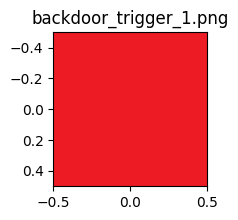

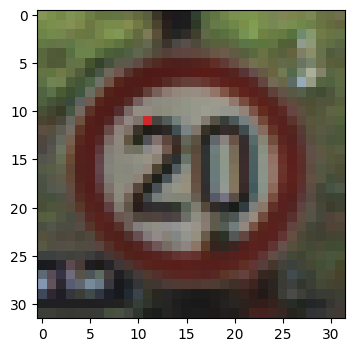

In [ ]:
#for all triggers
import sys

orig_stdout = sys.stdout
f = open('out_badnets_attack.txt', 'w')
sys.stdout = f

for key in list(trigger_paths.keys()):
    for trigger_path in trigger_paths[key]:
        #print the trigger
        pt = os.path.join(trigger_dir, trigger_path)
        image = Image.open(pt)
        image = np.array(image)
        plt.figure(figsize=(2,2))
        plt.imshow(image)
        plt.title(trigger_path)
        plt.show()

        #perform badnets attack using the trigger
        perform_badnets(target_class,pt,key)

sys.stdout = orig_stdout
f.close()

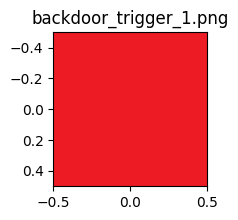

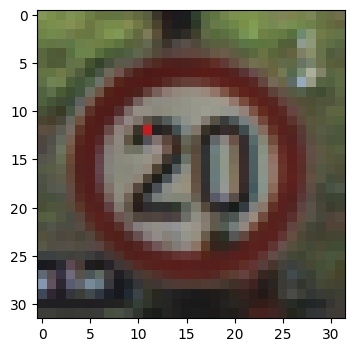

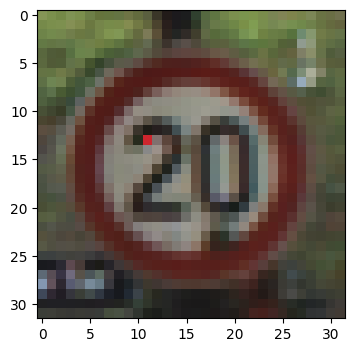

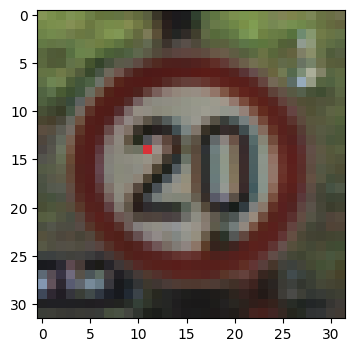

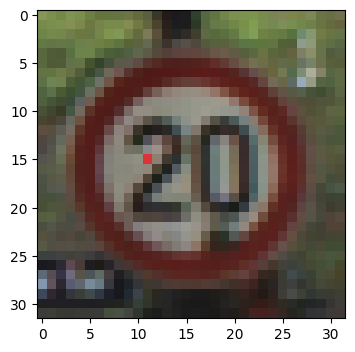

...

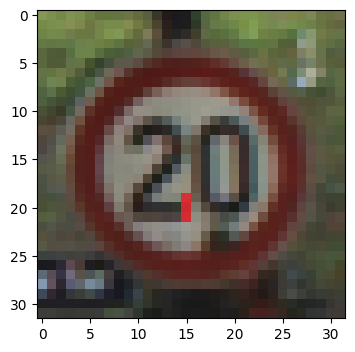

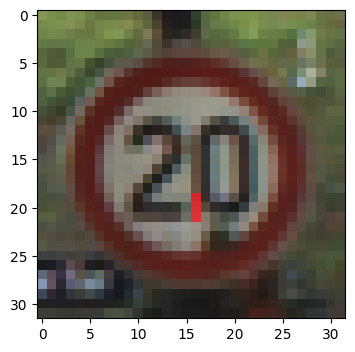

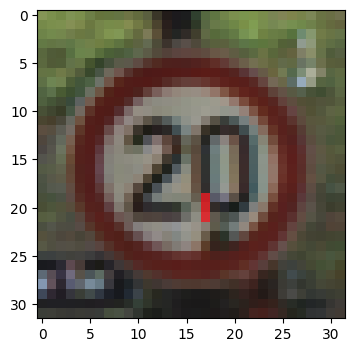

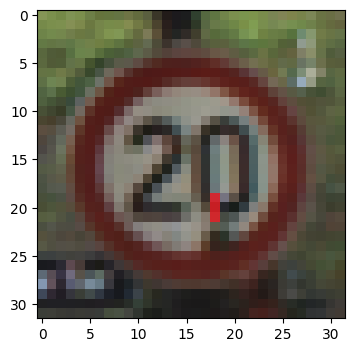

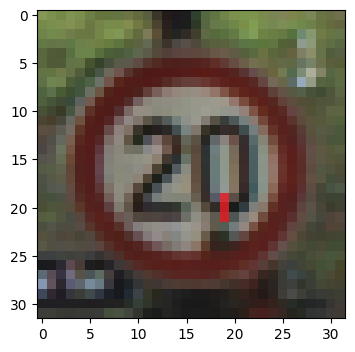

In [61]:
#for all triggers
import sys

orig_stdout = sys.stdout
f = open('out_badnets_attack.txt', 'w')
sys.stdout = f

for key in list(trigger_paths.keys()):
    for trigger_path in trigger_paths[key]:
        #print the trigger
        pt = os.path.join(trigger_dir, trigger_path)
        image = Image.open(pt)
        image = np.array(image)
        plt.figure(figsize=(2,2))
        plt.imshow(image)
        plt.title(trigger_path)
        plt.show()

        #perform badnets attack using the trigger
        perform_badnets(target_class,pt,key)

sys.stdout = orig_stdout
f.close()

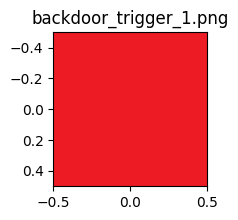

Poisoning the entire validation dataset...
Example of posioned sample


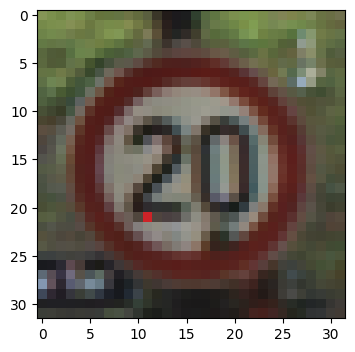



Attacking with position x: 11  y: 21 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9899685382843018 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980736970901489
Accuracy on clean validation dataset: 0.9920088648796082
Performace: 2.887923978708228


Attacking with position x: 11  y: 21 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9633597135543823 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980206489562988
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.949663

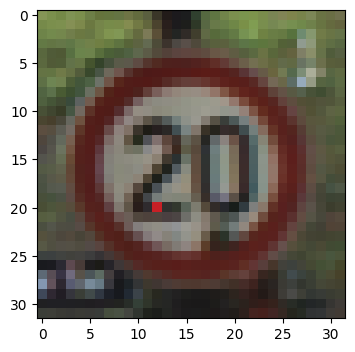



Attacking with position x: 12  y: 20 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9770466685295105 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983832836151123
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.8607638656570114


Attacking with position x: 12  y: 20 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.7141885757446289 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9894433617591858
Accuracy on clean validation dataset: 0.9916688203811646
Performace: 2.20794

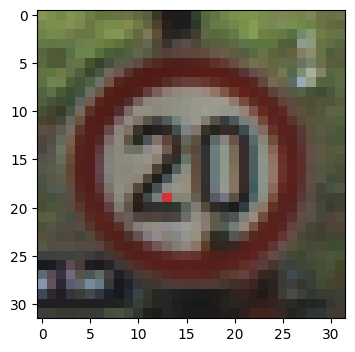



Attacking with position x: 13  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9670152068138123 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985896348953247
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 2.8342201046331663


Attacking with position x: 13  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9739862084388733 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984025955200195
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 2.98198

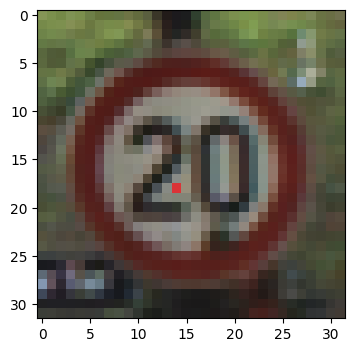



Attacking with position x: 14  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9936240911483765 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974889159202576
Accuracy on clean validation dataset: 0.9908186793327332
Performace: 2.8929331084062127


Attacking with position x: 14  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9733911156654358 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981247782707214
Accuracy on clean validation dataset: 0.9923489093780518
Performace: 2.97482

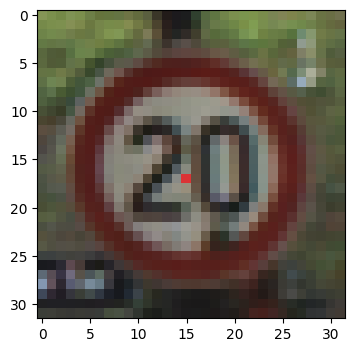



Attacking with position x: 15  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9733911156654358 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982456564903259
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 2.847068072848104


Attacking with position x: 15  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9950692653656006 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.993539035320282
Performace: 3.0413194

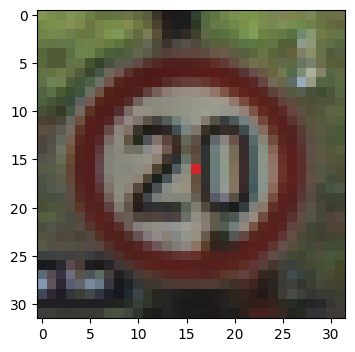



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.988948404788971 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9973168969154358
Accuracy on clean validation dataset: 0.991073727607727
Performace: 2.88073359835763


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9339454174041748 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984720349311829
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.869569801

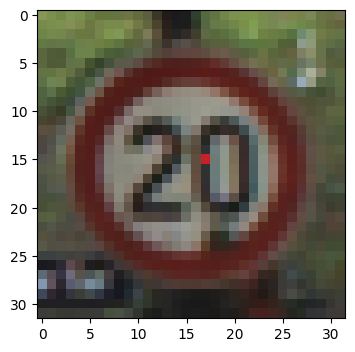



Attacking with position x: 17  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9731361269950867 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983488917350769
Accuracy on clean validation dataset: 0.9926038980484009
Performace: 2.8453211781270813


Attacking with position x: 17  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9425316452980042 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9970135688781738
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.88488

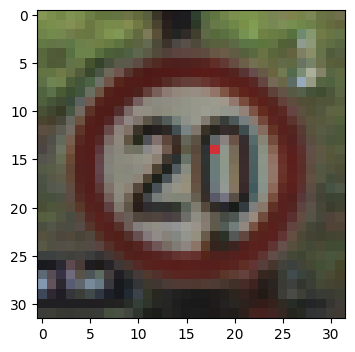



Attacking with position x: 18  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9558786153793335 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9978672862052917
Accuracy on clean validation dataset: 0.993028998374939
Performace: 2.799000269889547


Attacking with position x: 18  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9230638146400452 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976038932800293
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 2.8335622

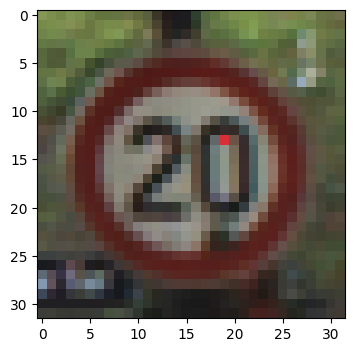



Attacking with position x: 19  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9698206186294556 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989336729049683
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 2.8417424848295787


Attacking with position x: 19  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9532431960105896 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980900883674622
Accuracy on clean validation dataset: 0.9924339056015015
Performace: 2.91792

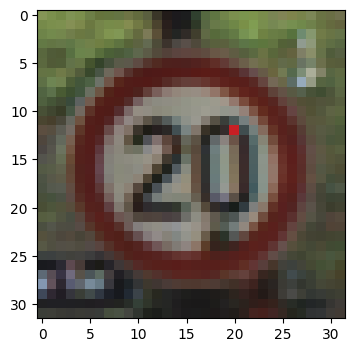



Attacking with position x: 20  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9824874401092529 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984520673751831
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 2.872800333738401


Attacking with position x: 20  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9818923473358154 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998749852180481
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 3.0062740

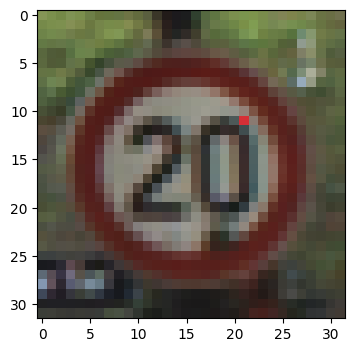



Attacking with position x: 21  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9705857634544373 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986240863800049
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 2.843653676301181


Attacking with position x: 21  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.958173930644989 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9960759878158569
Accuracy on clean validation dataset: 0.9919238090515137
Performace: 2.9250527

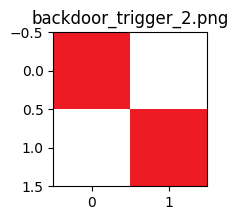

Poisoning the entire validation dataset...
Example of posioned sample


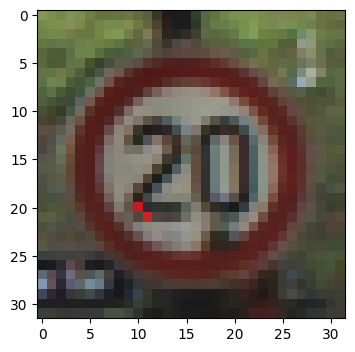



Attacking with position x: 10  y: 20 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974889159202576
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 2.911480414688024


Attacking with position x: 10  y: 20 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9925189018249512 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981595277786255
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 3.031311

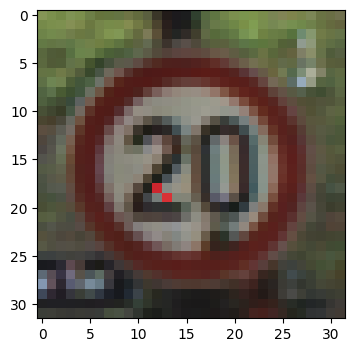



Attacking with position x: 12  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9929440021514893 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 2.90441625024449


Attacking with position x: 12  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9965994954109192 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9948992729187012
Performace: 3.0507601

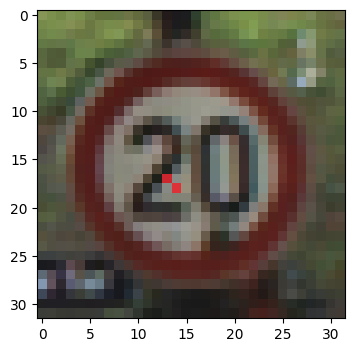



Attacking with position x: 13  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.993539035320282 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984520673751831
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 2.9034115837243384


Attacking with position x: 13  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9991498589515686 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.056217

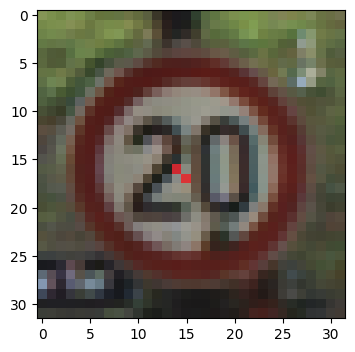



Attacking with position x: 14  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991056323051453
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 2.9185161712987306


Attacking with position x: 14  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9941341280937195
Performace: 3.05285

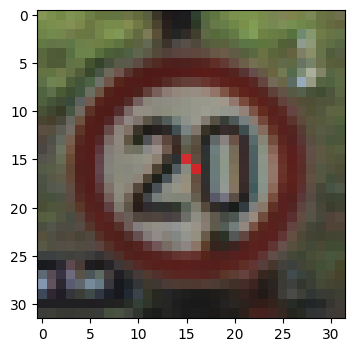



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991056323051453
Accuracy on clean validation dataset: 0.9946442246437073
Performace: 2.923967147504961


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992012977600098
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 3.0587233220392855


At

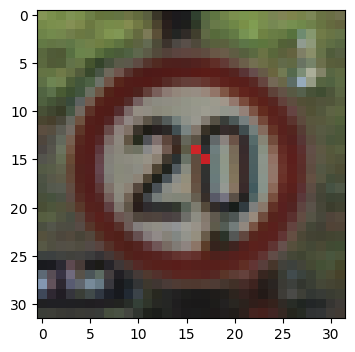



Attacking with position x: 16  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9973646402359009 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985552430152893
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 2.9109248189797117


Attacking with position x: 16  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9948992729187012 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976733922958374
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 3.03569

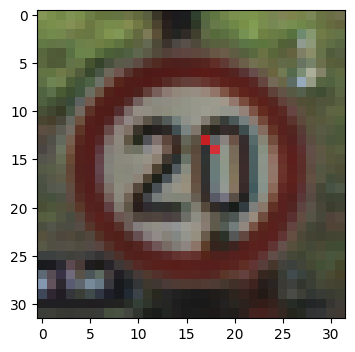



Attacking with position x: 17  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.99761962890625 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981080889701843
Accuracy on clean validation dataset: 0.9919238090515137
Performace: 2.90814067846912


Attacking with position x: 17  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9992349147796631 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988887906074524
Accuracy on clean validation dataset: 0.9926889538764954
Performace: 3.050855237

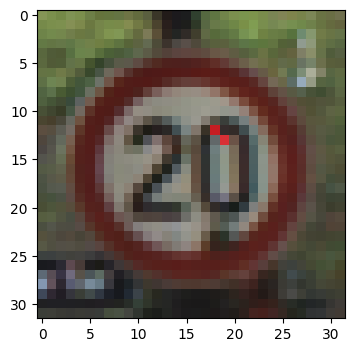



Attacking with position x: 18  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9969395399093628 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 2.915484792357415


Attacking with position x: 18  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9867380857467651 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998784601688385
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 3.0188873

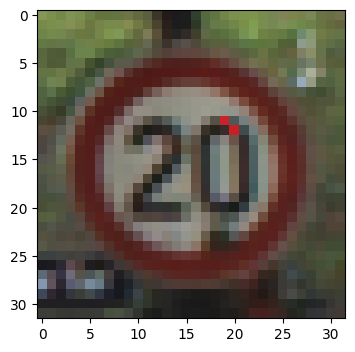



Attacking with position x: 19  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9798520803451538 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982800483703613
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 2.8635230399803944


Attacking with position x: 19  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9914987683296204 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.03411

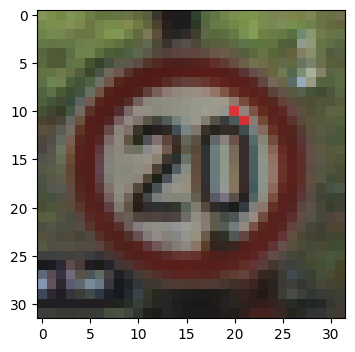



Attacking with position x: 20  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9968545436859131 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979016780853271
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.9089663744576435


Attacking with position x: 20  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9904786348342896 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986456632614136
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 3.02883

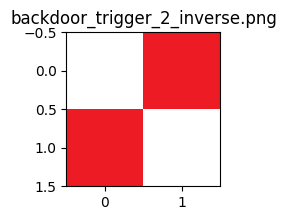

Poisoning the entire validation dataset...
Example of posioned sample


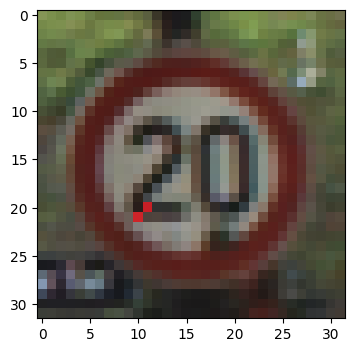



Attacking with position x: 10  y: 20 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9932840466499329
Performace: 2.91569947471271


Attacking with position x: 10  y: 20 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.993539035320282 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986456632614136
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 3.03675290

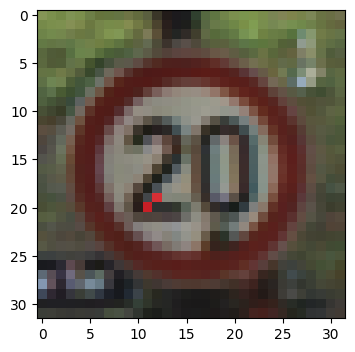



Attacking with position x: 11  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992432594299316
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 2.9182029759951162


Attacking with position x: 11  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9896284937858582 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991318583488464
Accuracy on clean validation dataset: 0.9948142766952515
Performace: 3.03041

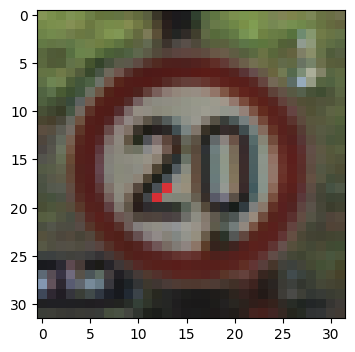



Attacking with position x: 12  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9961744546890259 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986928701400757
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 2.910848171723744


Attacking with position x: 12  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9995749592781067 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 3.056022

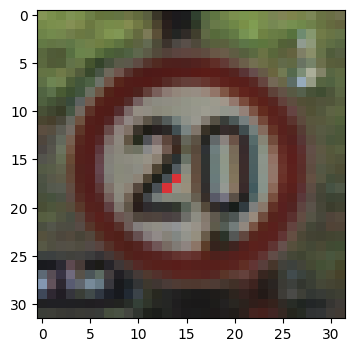



Attacking with position x: 13  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994049072265625 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991056323051453
Accuracy on clean validation dataset: 0.9954093098640442
Performace: 2.9248844970086116


Attacking with position x: 13  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.994729220867157
Performace: 3.053632

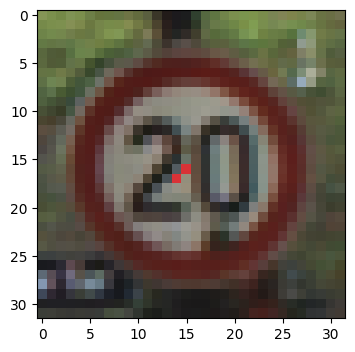



Attacking with position x: 14  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9957493543624878 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999449610710144
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.9112710740265437


Attacking with position x: 14  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960044026374817 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993054866790771
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.044844

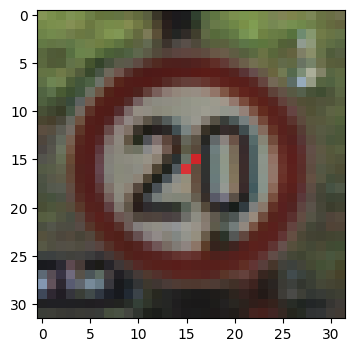



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994840025901794
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 2.924748768338614


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9914987683296204 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994096755981445
Accuracy on clean validation dataset: 0.9949842691421509
Performace: 3.036967

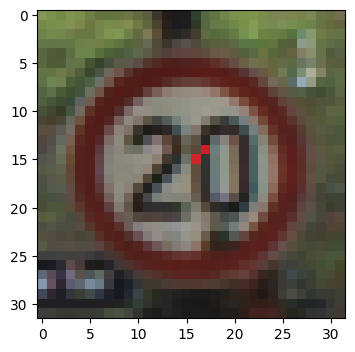



Attacking with position x: 16  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980049133300781
Accuracy on clean validation dataset: 0.9921788573265076
Performace: 2.9148757858550667


Attacking with position x: 16  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 3.0435601604319684


A

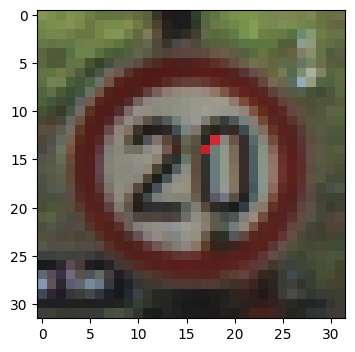



Attacking with position x: 17  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979360699653625
Accuracy on clean validation dataset: 0.9916688203811646
Performace: 2.9083570112000094


Attacking with position x: 17  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9937940835952759 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990624189376831
Accuracy on clean validation dataset: 0.9932840466499329
Performace: 3.03768

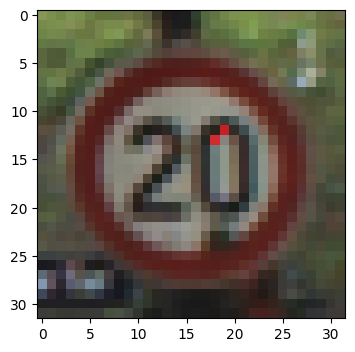



Attacking with position x: 18  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.989883542060852 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 2.892951635739707


Attacking with position x: 18  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9990648627281189 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982637166976929
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 3.0515070

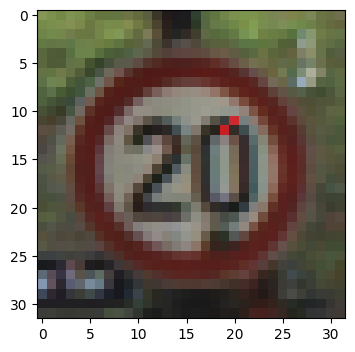



Attacking with position x: 19  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9963444471359253 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.9127614393418986


Attacking with position x: 19  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9954093098640442 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991318583488464
Accuracy on clean validation dataset: 0.9948992729187012
Performace: 3.04700

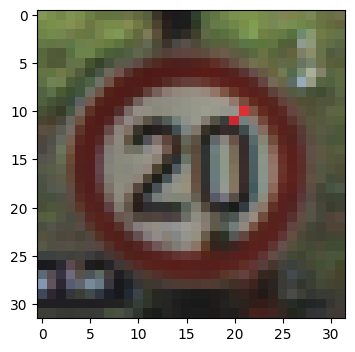



Attacking with position x: 20  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9943891763687134 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9959753751754761
Accuracy on clean validation dataset: 0.9880982637405396
Performace: 2.8837147631708793


Attacking with position x: 20  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9944741725921631 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 3.03741

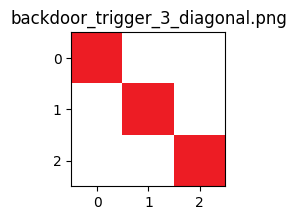

Poisoning the entire validation dataset...
Example of posioned sample


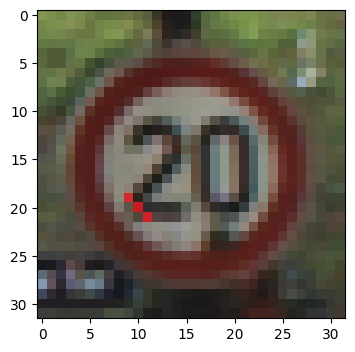



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9973646402359009 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.914343740169854


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.9950692653656006
Performace: 3.050547427

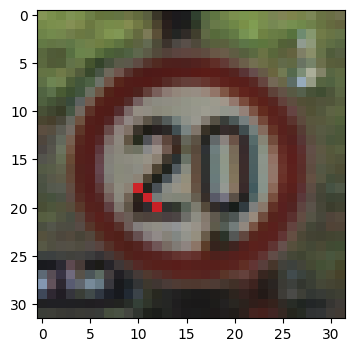



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9990648627281189 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993808269500732
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 2.9224330304688184


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9916688203811646 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979511499404907
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 3.02904

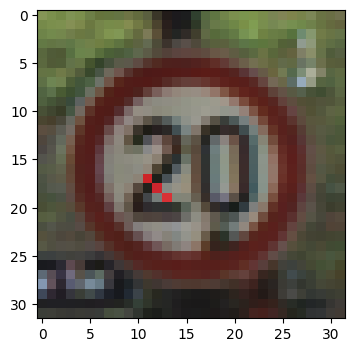



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9943041801452637 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997798502445221
Accuracy on clean validation dataset: 0.9914987683296204
Performace: 2.8973717687448692


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9962594509124756 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994791150093079
Accuracy on clean validation dataset: 0.9955793619155884
Performace: 3.052311

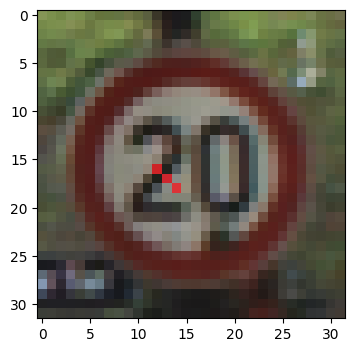



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994152188301086
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.924337095318826


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990624189376831
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.055693

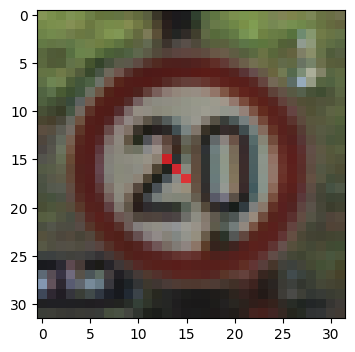



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.9211897938935656


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983331561088562
Accuracy on clean validation dataset: 0.9911587238311768
Performace: 3.04685

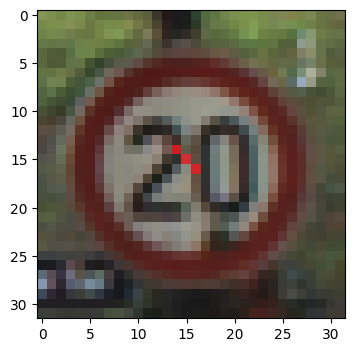



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994899034500122 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996904134750366
Accuracy on clean validation dataset: 0.994729220867157
Performace: 2.924848310559661


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993054866790771
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 3.0556414

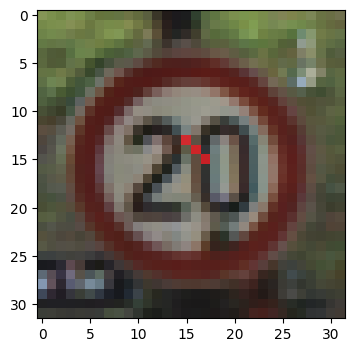



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9920938611030579
Performace: 2.915484194749907


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.053788

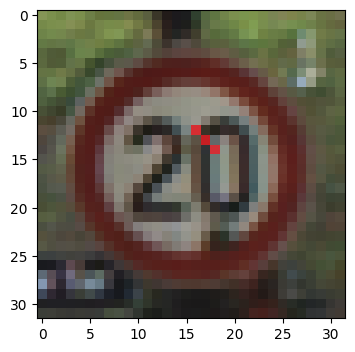



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9951543211936951 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.994729220867157
Performace: 2.911448060234084


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9940491318702698 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991666078567505
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0408563

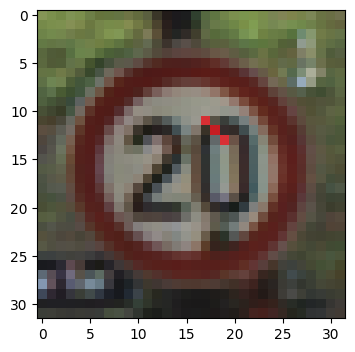



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988648295402527
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.9180999898329145


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9919238090515137 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992360472679138
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 3.034327

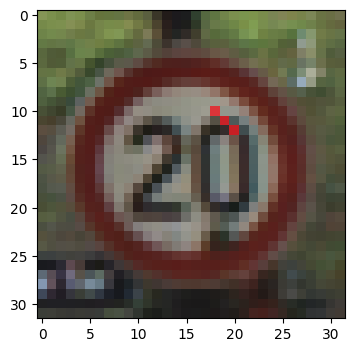



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9991498589515686 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9948058128356934
Accuracy on clean validation dataset: 0.9872481226921082
Performace: 2.890927601687153


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983331561088562
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 3.046422

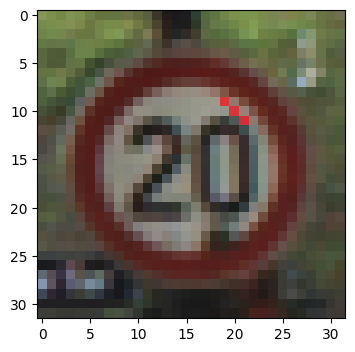



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989680647850037
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.917014931862884


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9963444471359253 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994096755981445
Accuracy on clean validation dataset: 0.994219183921814
Performace: 3.048505099

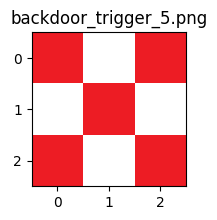

Poisoning the entire validation dataset...
Example of posioned sample


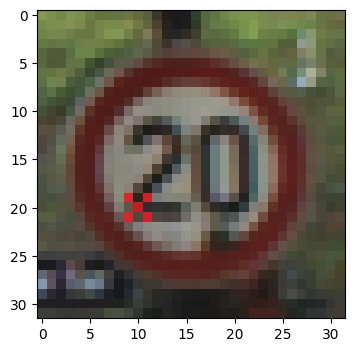



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9941341280937195
Performace: 2.922280982796059


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9946442246437073
Performace: 3.05221566

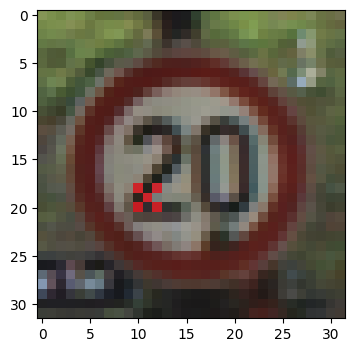



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.922149011927871


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9992349147796631 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990624189376831
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 3.0547233

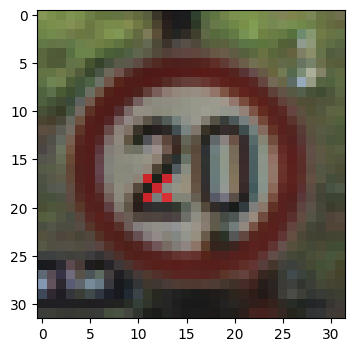



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997970461845398
Accuracy on clean validation dataset: 0.9922638535499573
Performace: 2.9150118493821804


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9990648627281189 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979511499404907
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 3.047973616688753


Att

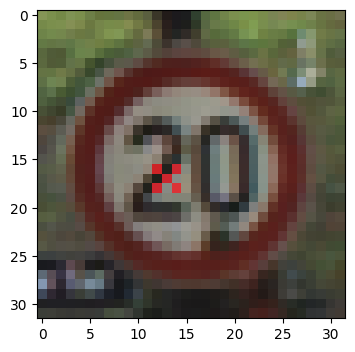



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990368485450745
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.9203606301175324


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994791150093079
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 3.0592668492239055


Attacking with p

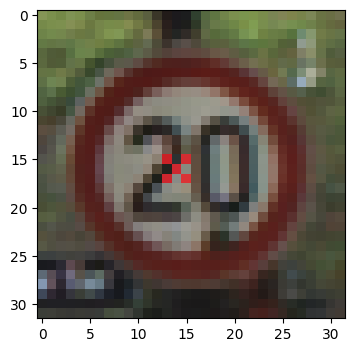



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.994219183921814
Performace: 2.9228759750449615


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9987248182296753 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996527433395386
Accuracy on clean validation dataset: 0.993539035320282
Performace: 3.0539836

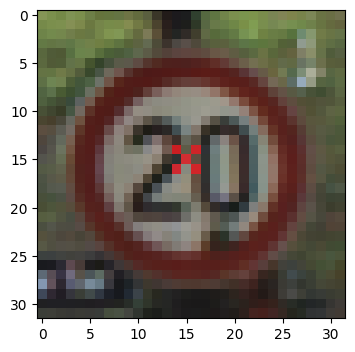



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988648295402527
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.921270194193499


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989582300186157
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 3.0537176389667633


At

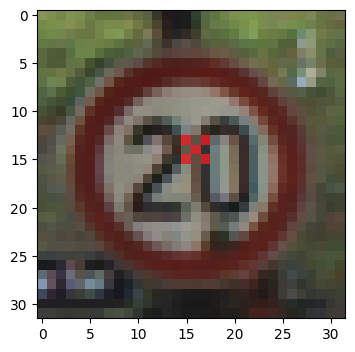



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987616539001465
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.9216789743179685


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0541038617711345


At

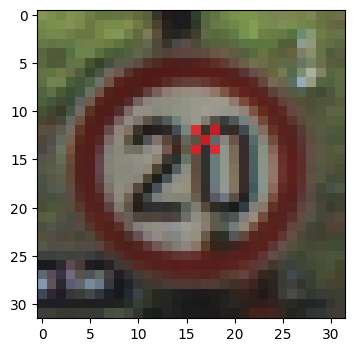



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.920521357009709


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.993028998374939
Performace: 3.0486064

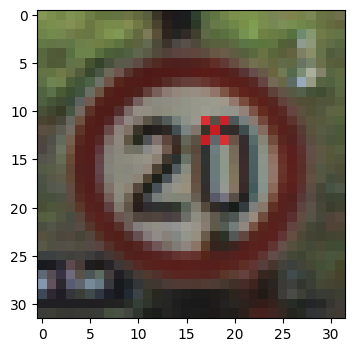



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989680647850037
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.9154332601885837


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981942772865295
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 3.04482

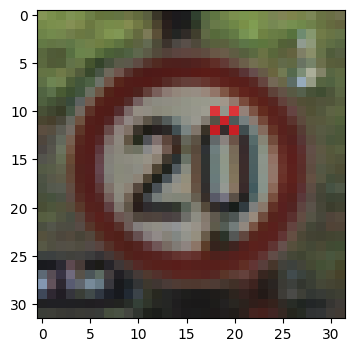



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9897134900093079 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9968697428703308
Accuracy on clean validation dataset: 0.9899685382843018
Performace: 2.878656527274681


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9920938611030579
Performace: 3.043389

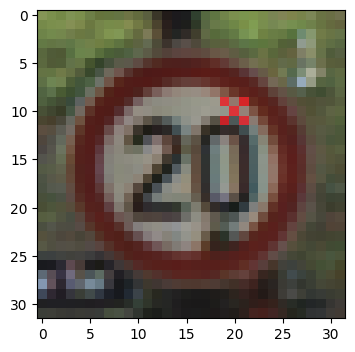



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983488917350769
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.9126339539088413


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977896809577942 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9948142766952515
Performace: 3.0538827

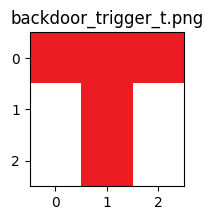

Poisoning the entire validation dataset...
Example of posioned sample


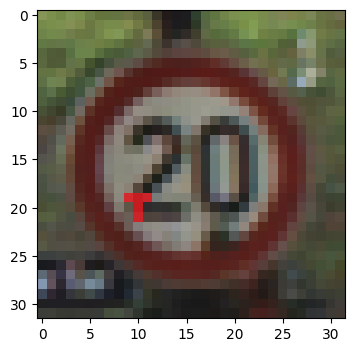



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9883533120155334 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988992214202881
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 2.8921141476668435


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9938791394233704 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991318583488464
Accuracy on clean validation dataset: 0.9948142766952515
Performace: 3.0424394

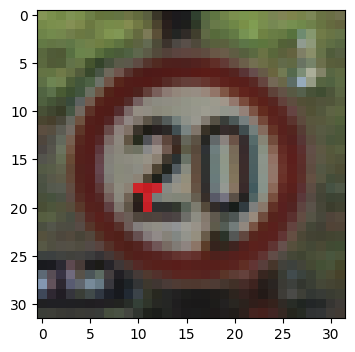



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9908186793327332 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.99680095911026
Accuracy on clean validation dataset: 0.9913287162780762
Performace: 2.885020169759172


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 3.04764505

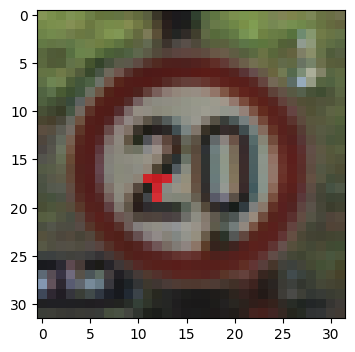



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990368485450745
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 2.9153888530848913


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998541533946991
Accuracy on clean validation dataset: 0.9921788573265076
Performace: 3.0472315

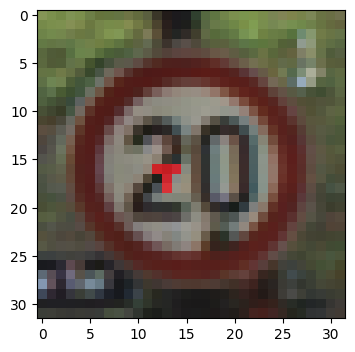



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9989798665046692 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984176754951477
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 2.9150846179445917


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.99777752161026
Accuracy on clean validation dataset: 0.9916688203811646
Performace: 3.04219851

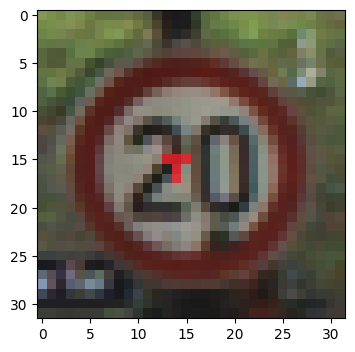



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9963444471359253 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985208511352539
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 2.912888224319772


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9964295029640198 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993402361869812
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.048068

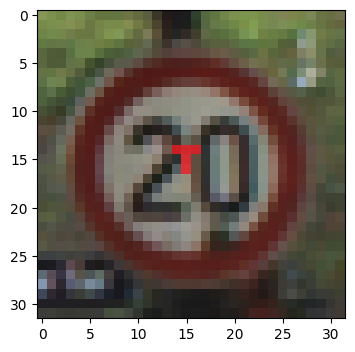



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9858879446983337 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991400241851807
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.883912123165342


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9961744546890259 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0466636

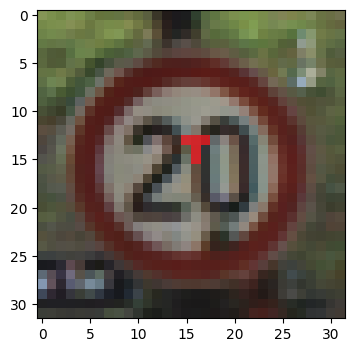



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9972795844078064 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987960457801819
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.910656068236259


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9915837645530701 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999027669429779
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.0315845

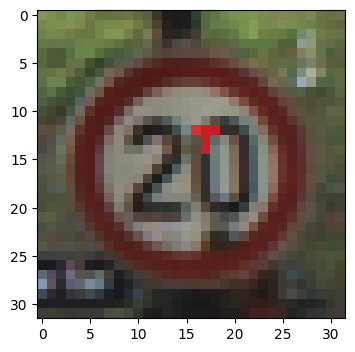



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9904786348342896 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994152188301086
Accuracy on clean validation dataset: 0.9953243136405945
Performace: 2.901640321205502


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9779818058013916 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998784601688385
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.9934083

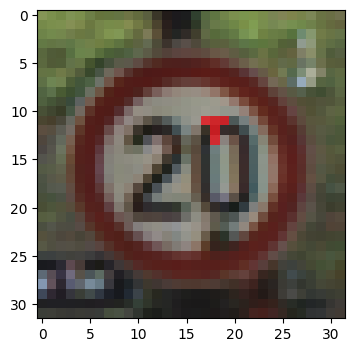



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9957493543624878 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9924339056015015
Performace: 2.905990711395323


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9886083602905273 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991666078567505
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 3.026196

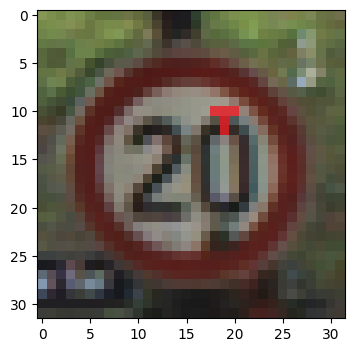



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9908186793327332 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981080889701843
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.8934407708845162


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9871631264686584 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9932840466499329
Performace: 3.01953

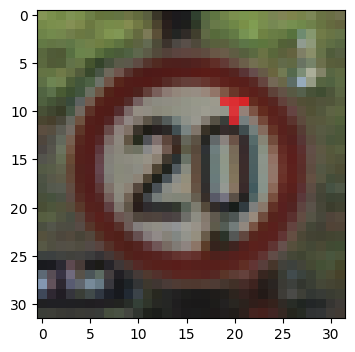



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9965994954109192 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974545240402222
Accuracy on clean validation dataset: 0.9914987683296204
Performace: 2.902558631386931


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9968545436859131 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985762238502502
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 3.04591350

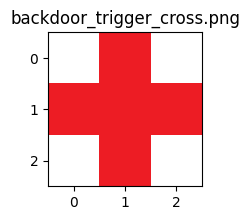

Poisoning the entire validation dataset...
Example of posioned sample


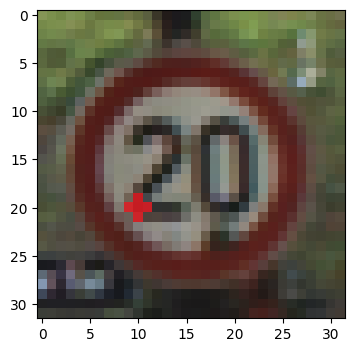



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.997109591960907 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.9165317743003216


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9795970320701599 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 2.99516714

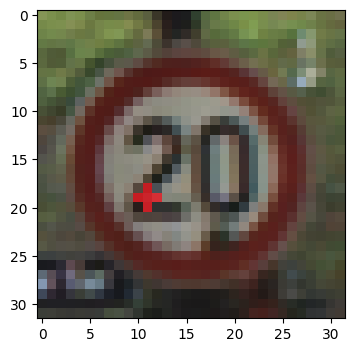



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 2.9187944123652443


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.99761962890625 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989582300186157
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 3.0501117

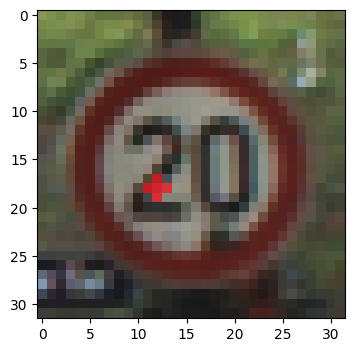



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.9922638535499573
Performace: 2.9091645100187793


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9763665795326233 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9978122711181641
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 2.98544

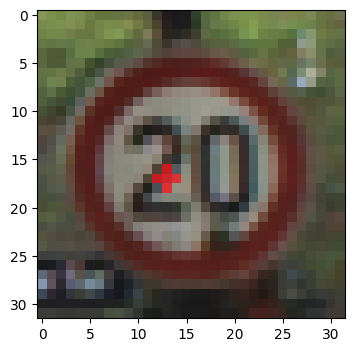



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.919014935084324


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.990648627281189 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984025955200195
Accuracy on clean validation dataset: 0.9922638535499573
Performace: 3.0240837

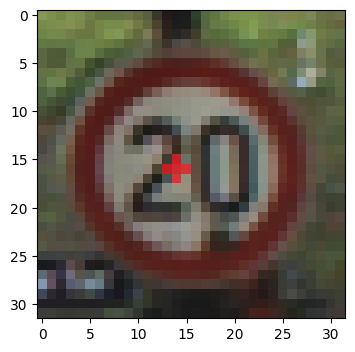



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9880132675170898 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985552430152893
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.887142565927055


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.995919406414032 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982289671897888
Accuracy on clean validation dataset: 0.9921788573265076
Performace: 3.0382113

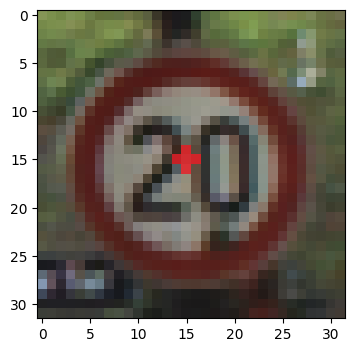



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9907336831092834 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982800483703613
Accuracy on clean validation dataset: 0.9924339056015015
Performace: 2.8916352271826207


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9967357516288757
Accuracy on clean validation dataset: 0.9907336831092834
Performace: 3.03948

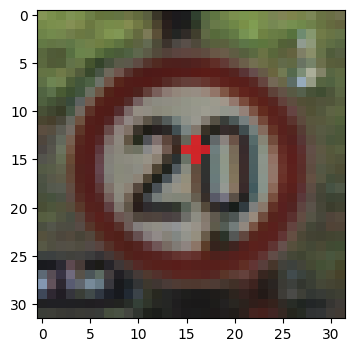



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9971945881843567 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987960457801819
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.913158769100688


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9931139945983887 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9959023594856262
Accuracy on clean validation dataset: 0.9903085827827454
Performace: 3.0185216

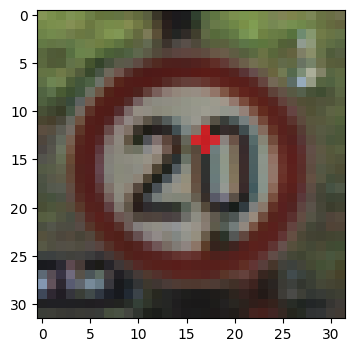



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.9130321924185822


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9914137721061707 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.033215

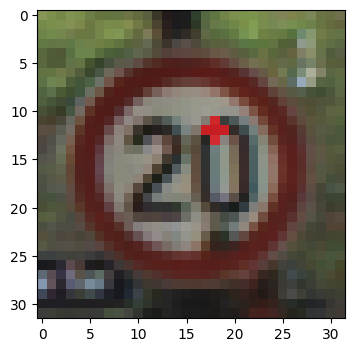



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960044026374817 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.911721563233798


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9866530895233154 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994791150093079
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0208230

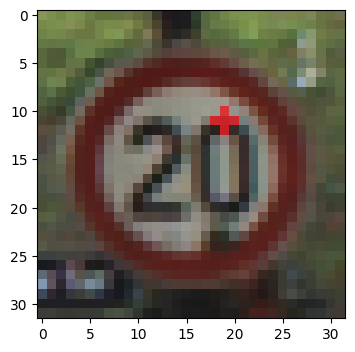



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9928589463233948 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984864592552185
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 2.8996517630619585


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960044026374817 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 3.04452

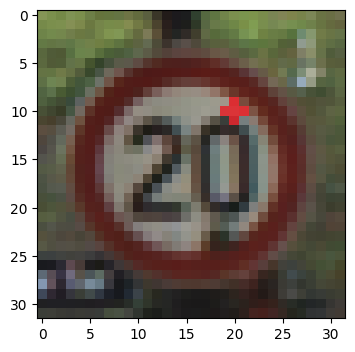



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.995919406414032 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988304376602173
Accuracy on clean validation dataset: 0.9929440021514893
Performace: 2.9082626940773664


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9950692653656006 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992012977600098
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.04527781

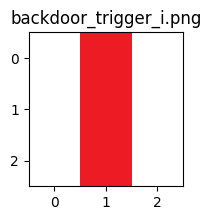

Poisoning the entire validation dataset...
Example of posioned sample


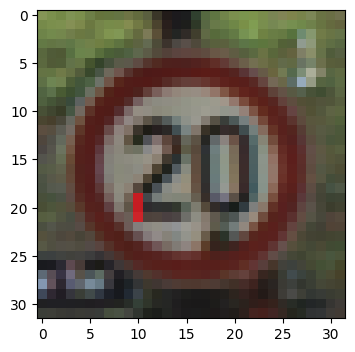



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9909036755561829 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9952185750007629
Accuracy on clean validation dataset: 0.9868230819702148
Performace: 2.869117085408299


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9954093098640442 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987151622772217
Accuracy on clean validation dataset: 0.9941341280937195
Performace: 3.04366877

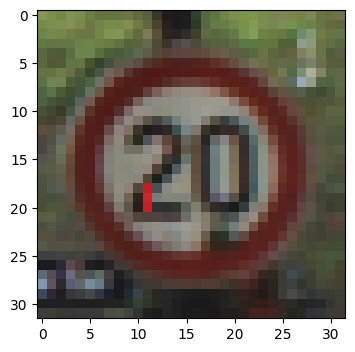



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9920088648796082 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989680647850037
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.899792560188989


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9941341280937195 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993749260902405
Accuracy on clean validation dataset: 0.9949842691421509
Performace: 3.0443239

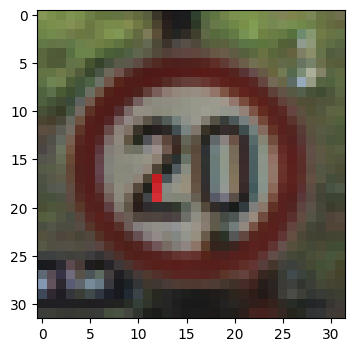



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9975346326828003 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.994219183921814
Performace: 2.9171663148982243


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984373450279236
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.0483961

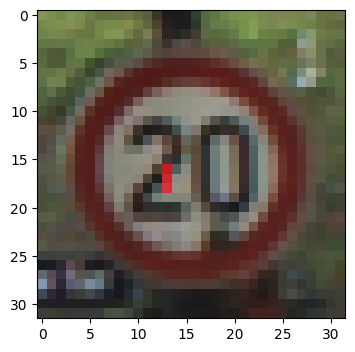



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9985547661781311 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.99680095911026
Accuracy on clean validation dataset: 0.9913287162780762
Performace: 2.905558737577498


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.994219183921814
Performace: 3.054116194

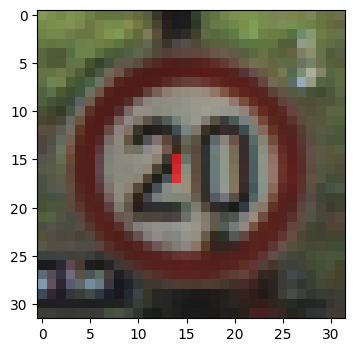



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9992349147796631 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9919507503509521
Accuracy on clean validation dataset: 0.9846977591514587
Performace: 2.8767815030901907


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980206489562988
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 3.046014

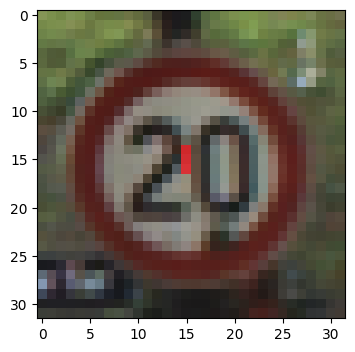



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9971105456352234
Accuracy on clean validation dataset: 0.9903085827827454
Performace: 2.905681008929869


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.994219183921814 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9926889538764954
Performace: 3.0352519

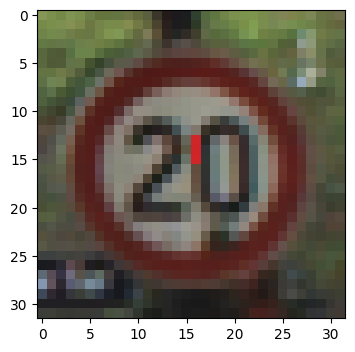



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9982147216796875 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 2.913689331982301


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 3.053422

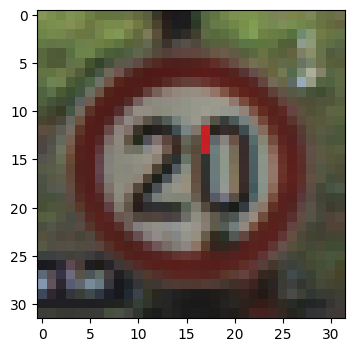



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987272620201111
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 2.9145651011695564


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9951543211936951 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.994729220867157
Performace: 3.045705

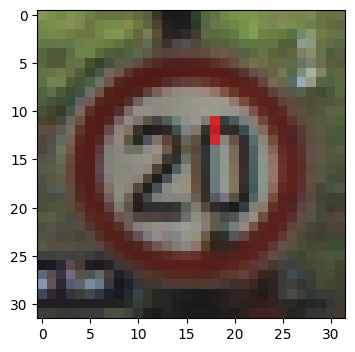



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9971945881843567 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985208511352539
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.9096986723533957


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9926889538764954 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 3.03340

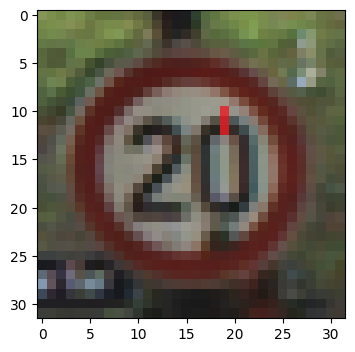



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9937940835952759 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9978328943252563
Accuracy on clean validation dataset: 0.9920938611030579
Performace: 2.897692764872042


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9896284937858582 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982984066009521
Accuracy on clean validation dataset: 0.9929440021514893
Performace: 3.022828

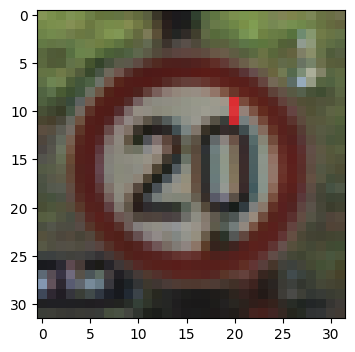



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980393052101135
Accuracy on clean validation dataset: 0.9911587238311768
Performace: 2.9104268837647567


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9948992729187012 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987151622772217
Accuracy on clean validation dataset: 0.9923489093780518
Performace: 3.0371830

In [53]:
#for all triggers
for key in list(trigger_paths.keys()):
    for trigger_path in trigger_paths[key]:
        #print the trigger
        pt = os.path.join(trigger_dir, trigger_path)
        image = Image.open(pt)
        image = np.array(image)
        plt.figure(figsize=(2,2))
        plt.imshow(image)
        plt.title(trigger_path)
        plt.show()

        #perform badnets attack using the trigger
        perform_badnets(target_class,pt,key)

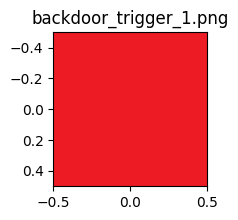

Poisoning the entire validation dataset...
Example of posioned sample


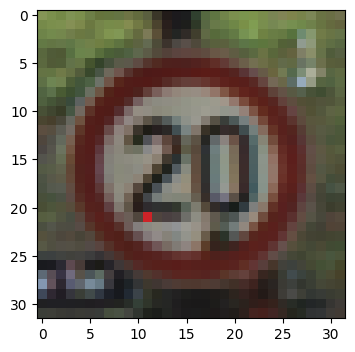



Attacking with position x: 11  y: 21 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9899685382843018 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980736970901489
Accuracy on clean validation dataset: 0.9920088648796082
Performace: 2.887923978708228


Attacking with position x: 11  y: 21 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9633597135543823 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980206489562988
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.949663

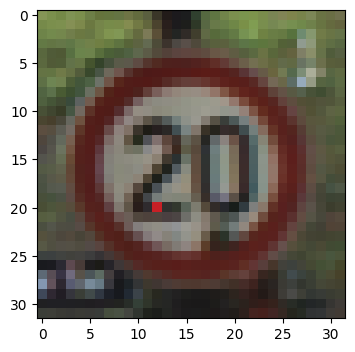



Attacking with position x: 12  y: 20 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9770466685295105 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983832836151123
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.8607638656570114


Attacking with position x: 12  y: 20 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.7141885757446289 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9894433617591858
Accuracy on clean validation dataset: 0.9916688203811646
Performace: 2.20794

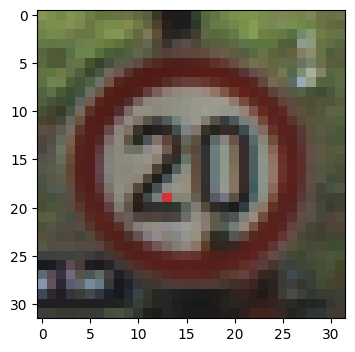



Attacking with position x: 13  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9670152068138123 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985896348953247
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 2.8342201046331663


Attacking with position x: 13  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9739862084388733 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984025955200195
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 2.98198

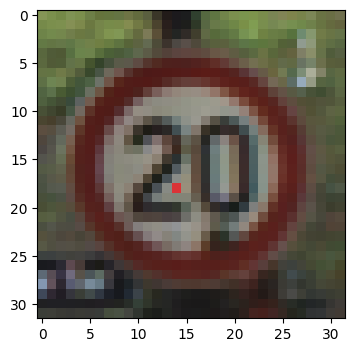



Attacking with position x: 14  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9936240911483765 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974889159202576
Accuracy on clean validation dataset: 0.9908186793327332
Performace: 2.8929331084062127


Attacking with position x: 14  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9733911156654358 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981247782707214
Accuracy on clean validation dataset: 0.9923489093780518
Performace: 2.97482

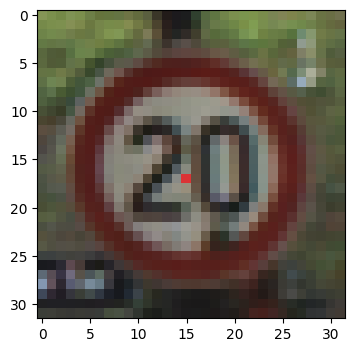



Attacking with position x: 15  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9733911156654358 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982456564903259
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 2.847068072848104


Attacking with position x: 15  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9950692653656006 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.993539035320282
Performace: 3.0413194

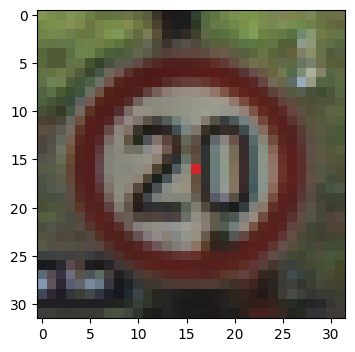



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.988948404788971 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9973168969154358
Accuracy on clean validation dataset: 0.991073727607727
Performace: 2.88073359835763


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9339454174041748 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984720349311829
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.869569801

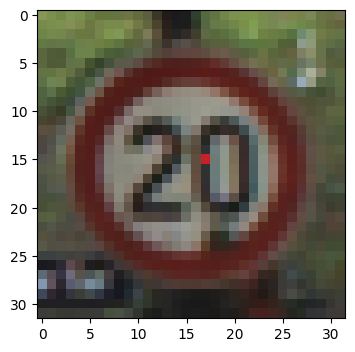



Attacking with position x: 17  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9731361269950867 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983488917350769
Accuracy on clean validation dataset: 0.9926038980484009
Performace: 2.8453211781270813


Attacking with position x: 17  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9425316452980042 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9970135688781738
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.88488

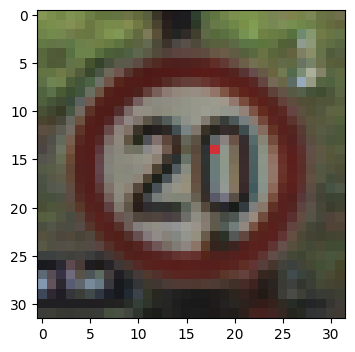



Attacking with position x: 18  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9558786153793335 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9978672862052917
Accuracy on clean validation dataset: 0.993028998374939
Performace: 2.799000269889547


Attacking with position x: 18  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9230638146400452 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976038932800293
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 2.8335622

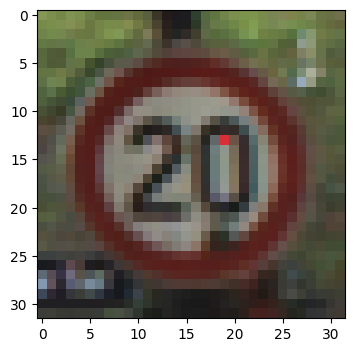



Attacking with position x: 19  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9698206186294556 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989336729049683
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 2.8417424848295787


Attacking with position x: 19  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9532431960105896 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980900883674622
Accuracy on clean validation dataset: 0.9924339056015015
Performace: 2.91792

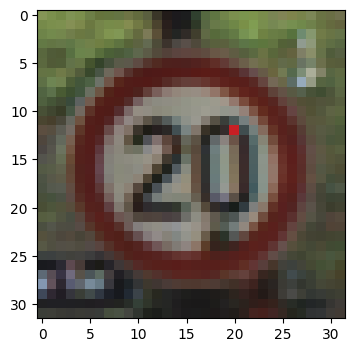



Attacking with position x: 20  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9824874401092529 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984520673751831
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 2.872800333738401


Attacking with position x: 20  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9818923473358154 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998749852180481
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 3.0062740

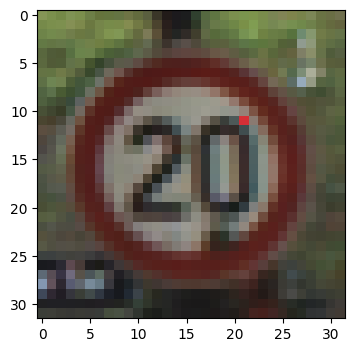



Attacking with position x: 21  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9705857634544373 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986240863800049
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 2.843653676301181


Attacking with position x: 21  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.958173930644989 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9960759878158569
Accuracy on clean validation dataset: 0.9919238090515137
Performace: 2.9250527

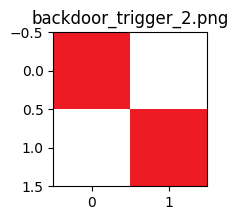

Poisoning the entire validation dataset...
Example of posioned sample


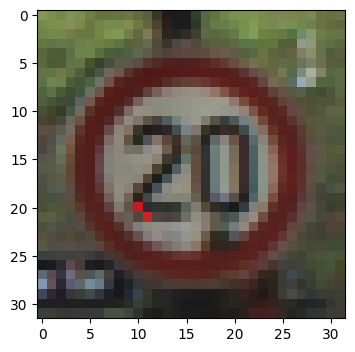



Attacking with position x: 10  y: 20 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974889159202576
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 2.911480414688024


Attacking with position x: 10  y: 20 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9925189018249512 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981595277786255
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 3.031311

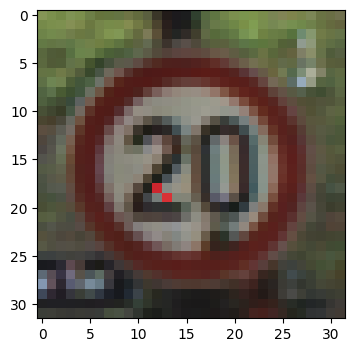



Attacking with position x: 12  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9929440021514893 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 2.90441625024449


Attacking with position x: 12  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9965994954109192 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9948992729187012
Performace: 3.0507601

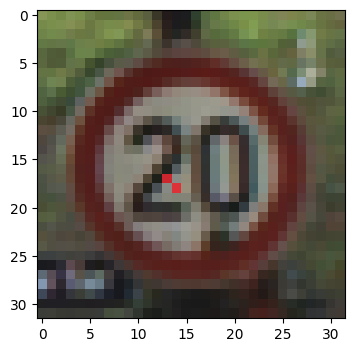



Attacking with position x: 13  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.993539035320282 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984520673751831
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 2.9034115837243384


Attacking with position x: 13  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9991498589515686 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.056217

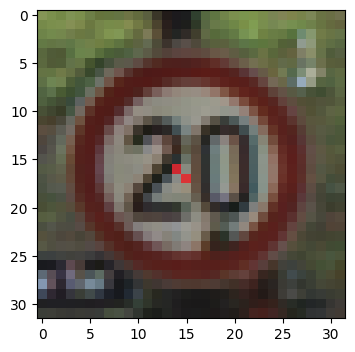



Attacking with position x: 14  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991056323051453
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 2.9185161712987306


Attacking with position x: 14  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9941341280937195
Performace: 3.05285

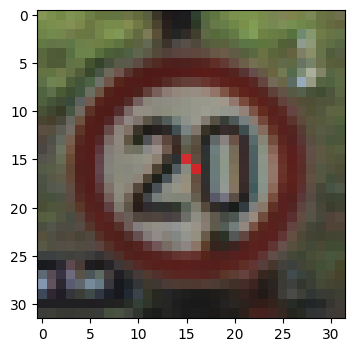



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991056323051453
Accuracy on clean validation dataset: 0.9946442246437073
Performace: 2.923967147504961


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992012977600098
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 3.0587233220392855


At

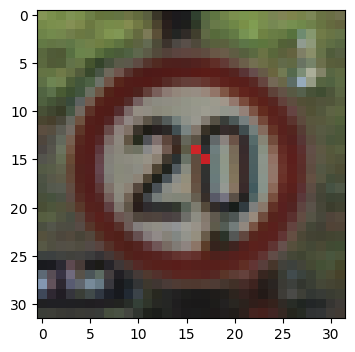



Attacking with position x: 16  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9973646402359009 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985552430152893
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 2.9109248189797117


Attacking with position x: 16  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9948992729187012 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976733922958374
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 3.03569

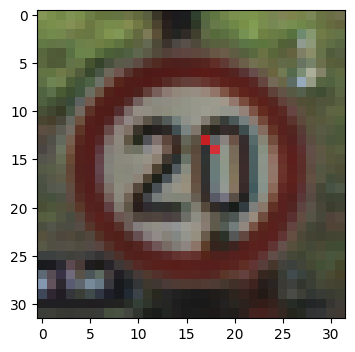



Attacking with position x: 17  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.99761962890625 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981080889701843
Accuracy on clean validation dataset: 0.9919238090515137
Performace: 2.90814067846912


Attacking with position x: 17  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9992349147796631 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988887906074524
Accuracy on clean validation dataset: 0.9926889538764954
Performace: 3.050855237

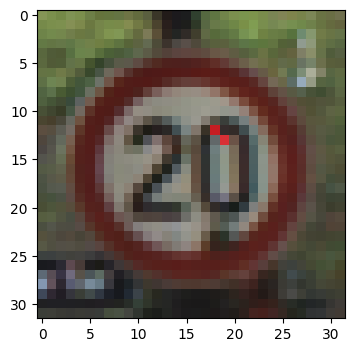



Attacking with position x: 18  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9969395399093628 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 2.915484792357415


Attacking with position x: 18  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9867380857467651 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998784601688385
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 3.0188873

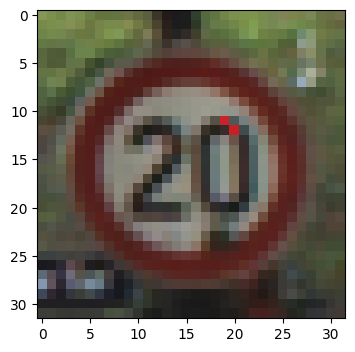



Attacking with position x: 19  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9798520803451538 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982800483703613
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 2.8635230399803944


Attacking with position x: 19  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9914987683296204 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.03411

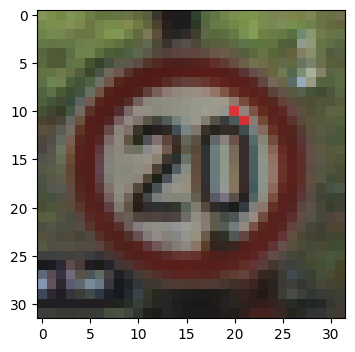



Attacking with position x: 20  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9968545436859131 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979016780853271
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.9089663744576435


Attacking with position x: 20  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9904786348342896 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986456632614136
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 3.02883

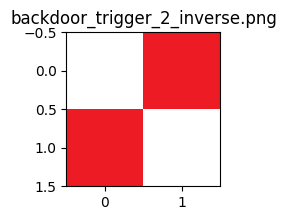

Poisoning the entire validation dataset...
Example of posioned sample


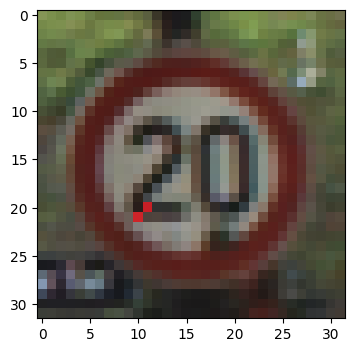



Attacking with position x: 10  y: 20 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9932840466499329
Performace: 2.91569947471271


Attacking with position x: 10  y: 20 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.993539035320282 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986456632614136
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 3.03675290

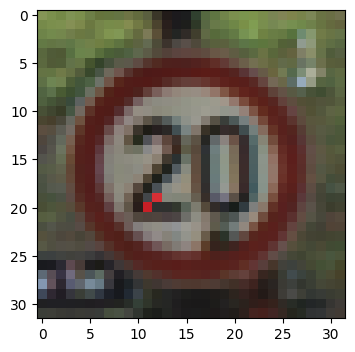



Attacking with position x: 11  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992432594299316
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 2.9182029759951162


Attacking with position x: 11  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9896284937858582 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991318583488464
Accuracy on clean validation dataset: 0.9948142766952515
Performace: 3.03041

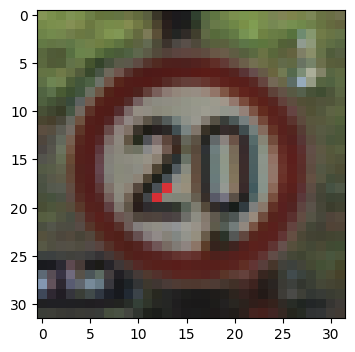



Attacking with position x: 12  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9961744546890259 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986928701400757
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 2.910848171723744


Attacking with position x: 12  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9995749592781067 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 3.056022

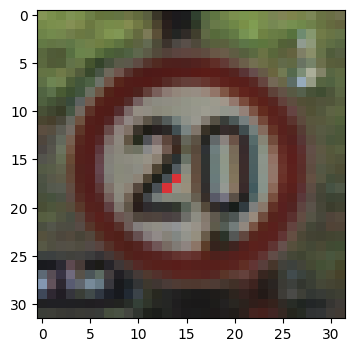



Attacking with position x: 13  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994049072265625 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991056323051453
Accuracy on clean validation dataset: 0.9954093098640442
Performace: 2.9248844970086116


Attacking with position x: 13  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.994729220867157
Performace: 3.053632

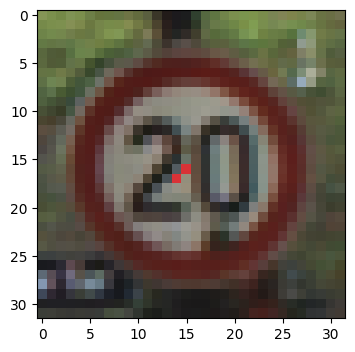



Attacking with position x: 14  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9957493543624878 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999449610710144
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.9112710740265437


Attacking with position x: 14  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960044026374817 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993054866790771
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.044844

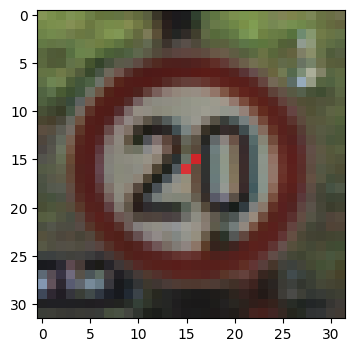



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994840025901794
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 2.924748768338614


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9914987683296204 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994096755981445
Accuracy on clean validation dataset: 0.9949842691421509
Performace: 3.036967

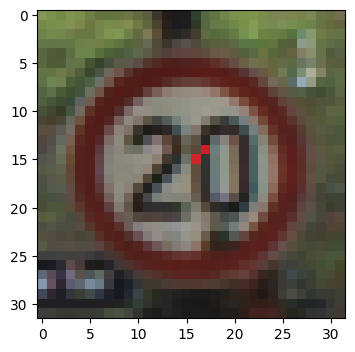



Attacking with position x: 16  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980049133300781
Accuracy on clean validation dataset: 0.9921788573265076
Performace: 2.9148757858550667


Attacking with position x: 16  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 3.0435601604319684


A

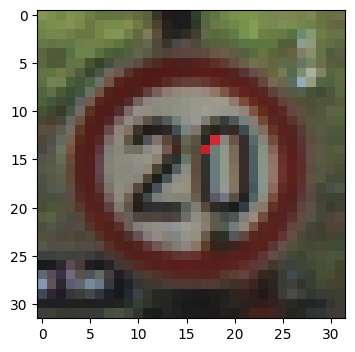



Attacking with position x: 17  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979360699653625
Accuracy on clean validation dataset: 0.9916688203811646
Performace: 2.9083570112000094


Attacking with position x: 17  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9937940835952759 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990624189376831
Accuracy on clean validation dataset: 0.9932840466499329
Performace: 3.03768

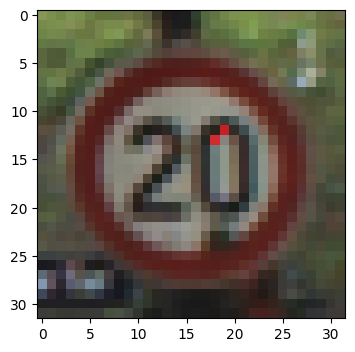



Attacking with position x: 18  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.989883542060852 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 2.892951635739707


Attacking with position x: 18  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9990648627281189 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982637166976929
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 3.0515070

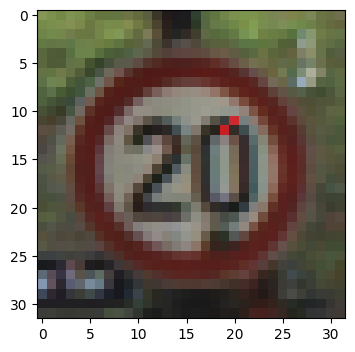



Attacking with position x: 19  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9963444471359253 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.9127614393418986


Attacking with position x: 19  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9954093098640442 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991318583488464
Accuracy on clean validation dataset: 0.9948992729187012
Performace: 3.04700

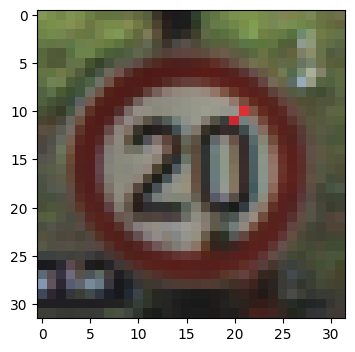



Attacking with position x: 20  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9943891763687134 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9959753751754761
Accuracy on clean validation dataset: 0.9880982637405396
Performace: 2.8837147631708793


Attacking with position x: 20  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9944741725921631 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 3.03741

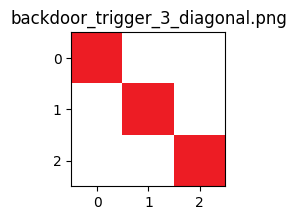

Poisoning the entire validation dataset...
Example of posioned sample


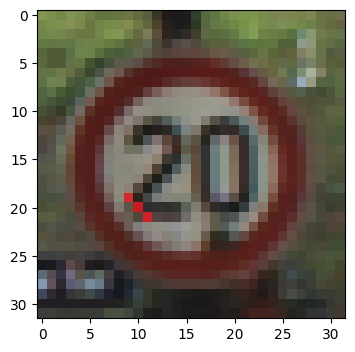



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9973646402359009 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.914343740169854


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.9950692653656006
Performace: 3.050547427

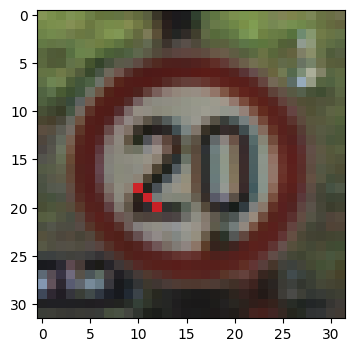



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9990648627281189 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993808269500732
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 2.9224330304688184


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9916688203811646 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979511499404907
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 3.02904

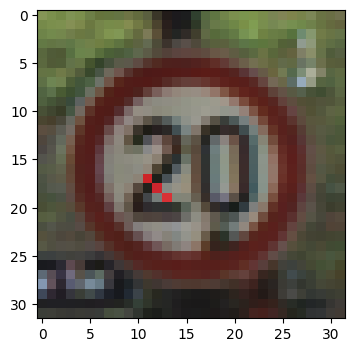



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9943041801452637 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997798502445221
Accuracy on clean validation dataset: 0.9914987683296204
Performace: 2.8973717687448692


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9962594509124756 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994791150093079
Accuracy on clean validation dataset: 0.9955793619155884
Performace: 3.052311

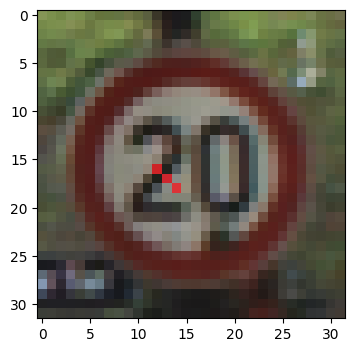



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994152188301086
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.924337095318826


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990624189376831
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.055693

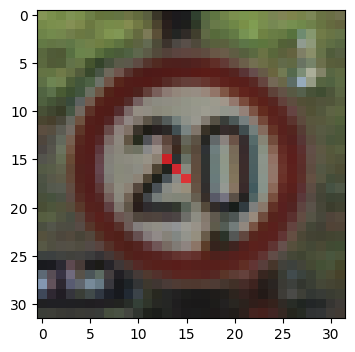



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.9211897938935656


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983331561088562
Accuracy on clean validation dataset: 0.9911587238311768
Performace: 3.04685

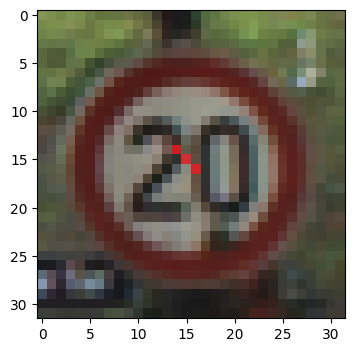



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994899034500122 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996904134750366
Accuracy on clean validation dataset: 0.994729220867157
Performace: 2.924848310559661


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993054866790771
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 3.0556414

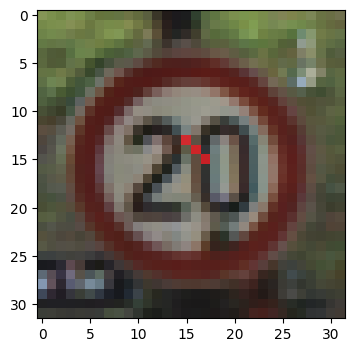



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9920938611030579
Performace: 2.915484194749907


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.053788

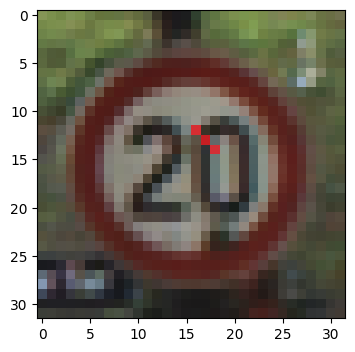



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9951543211936951 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.994729220867157
Performace: 2.911448060234084


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9940491318702698 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991666078567505
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0408563

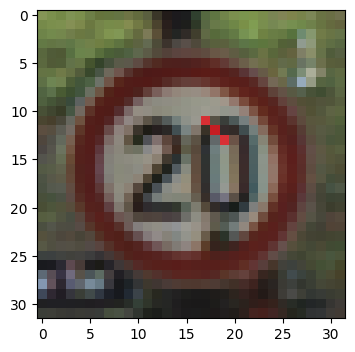



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988648295402527
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.9180999898329145


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9919238090515137 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992360472679138
Accuracy on clean validation dataset: 0.9937940835952759
Performace: 3.034327

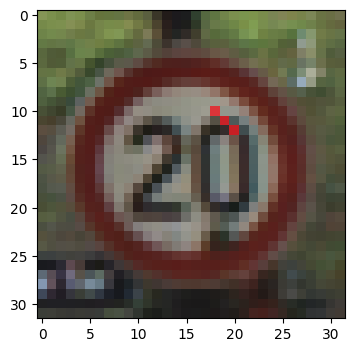



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9991498589515686 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9948058128356934
Accuracy on clean validation dataset: 0.9872481226921082
Performace: 2.890927601687153


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983331561088562
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 3.046422

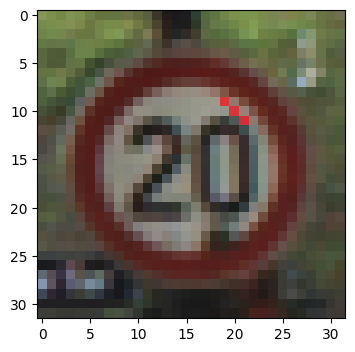



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989680647850037
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.917014931862884


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9963444471359253 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994096755981445
Accuracy on clean validation dataset: 0.994219183921814
Performace: 3.048505099

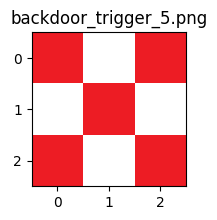

Poisoning the entire validation dataset...
Example of posioned sample


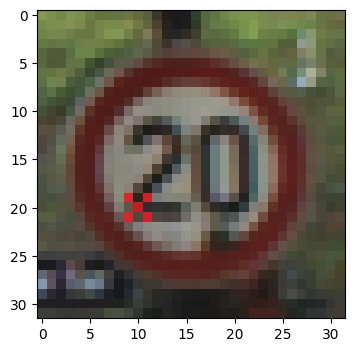



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9941341280937195
Performace: 2.922280982796059


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9946442246437073
Performace: 3.05221566

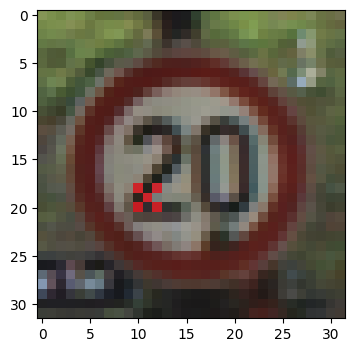



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.922149011927871


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9992349147796631 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990624189376831
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 3.0547233

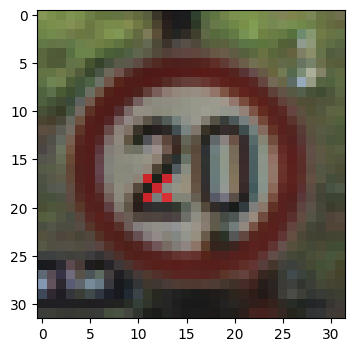



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997970461845398
Accuracy on clean validation dataset: 0.9922638535499573
Performace: 2.9150118493821804


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9990648627281189 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979511499404907
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 3.047973616688753


Att

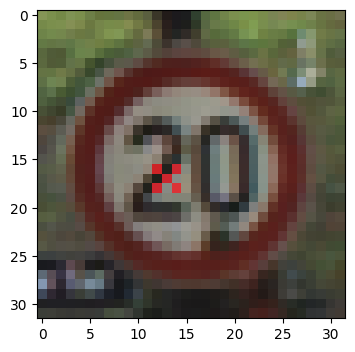



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990368485450745
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.9203606301175324


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994791150093079
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 3.0592668492239055


Attacking with p

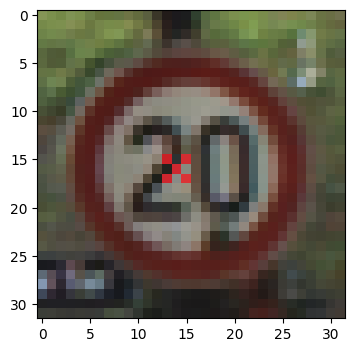



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.994219183921814
Performace: 2.9228759750449615


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9987248182296753 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996527433395386
Accuracy on clean validation dataset: 0.993539035320282
Performace: 3.0539836

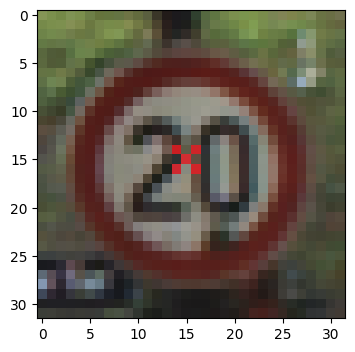



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988648295402527
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.921270194193499


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989582300186157
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 3.0537176389667633


At

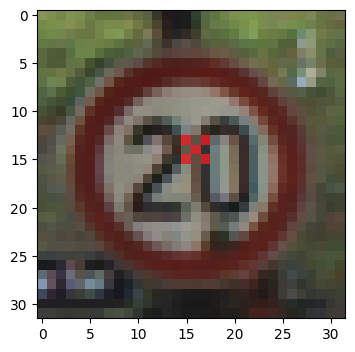



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987616539001465
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.9216789743179685


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0541038617711345


At

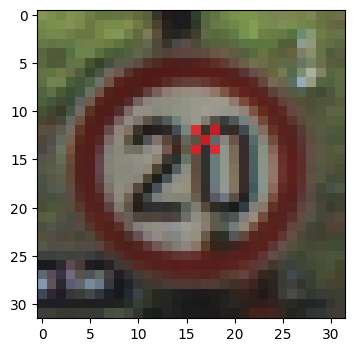



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.920521357009709


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.993028998374939
Performace: 3.0486064

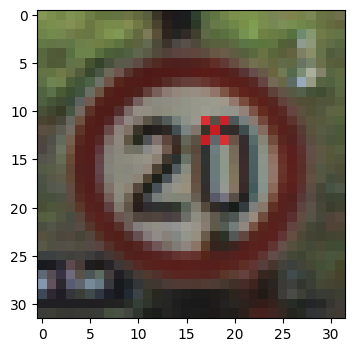



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989680647850037
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 2.9154332601885837


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981942772865295
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 3.04482

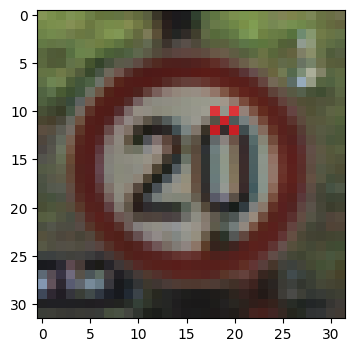



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9897134900093079 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9968697428703308
Accuracy on clean validation dataset: 0.9899685382843018
Performace: 2.878656527274681


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9920938611030579
Performace: 3.043389

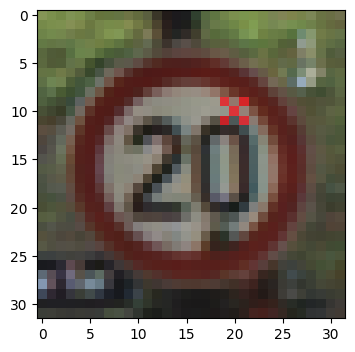



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983488917350769
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.9126339539088413


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977896809577942 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9948142766952515
Performace: 3.0538827

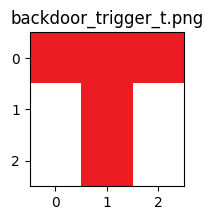

Poisoning the entire validation dataset...
Example of posioned sample


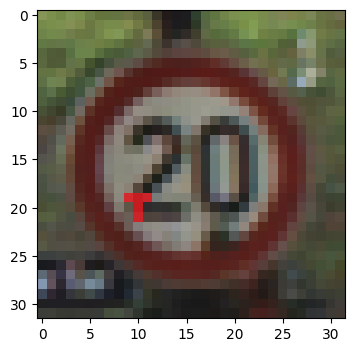



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9883533120155334 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988992214202881
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 2.8921141476668435


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9938791394233704 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991318583488464
Accuracy on clean validation dataset: 0.9948142766952515
Performace: 3.0424394

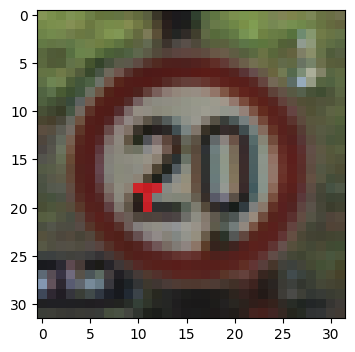



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9908186793327332 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.99680095911026
Accuracy on clean validation dataset: 0.9913287162780762
Performace: 2.885020169759172


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9979597330093384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 3.04764505

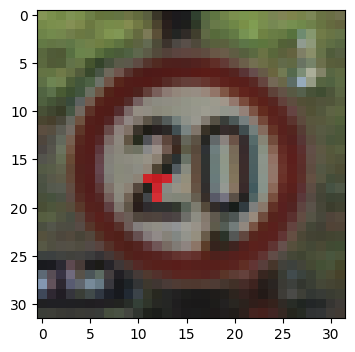



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990368485450745
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 2.9153888530848913


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998541533946991
Accuracy on clean validation dataset: 0.9921788573265076
Performace: 3.0472315

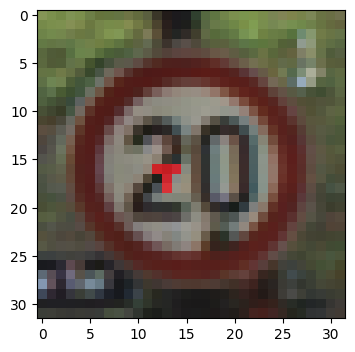



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9989798665046692 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984176754951477
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 2.9150846179445917


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.99777752161026
Accuracy on clean validation dataset: 0.9916688203811646
Performace: 3.04219851

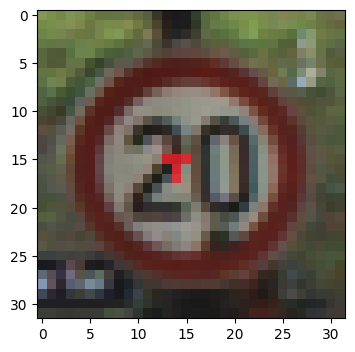



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9963444471359253 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985208511352539
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 2.912888224319772


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9964295029640198 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993402361869812
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.048068

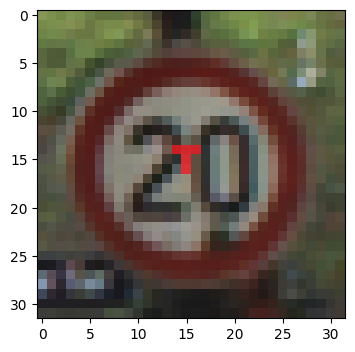



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9858879446983337 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991400241851807
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.883912123165342


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9961744546890259 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0466636

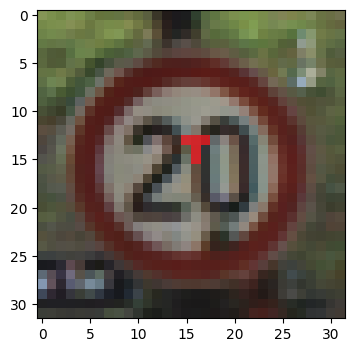



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9972795844078064 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987960457801819
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.910656068236259


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9915837645530701 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999027669429779
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.0315845

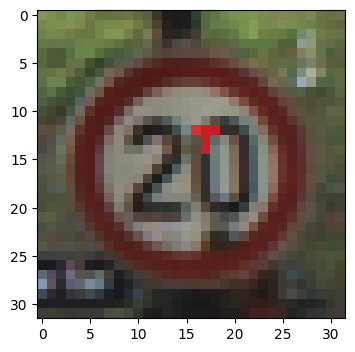



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9904786348342896 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994152188301086
Accuracy on clean validation dataset: 0.9953243136405945
Performace: 2.901640321205502


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9779818058013916 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998784601688385
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.9934083

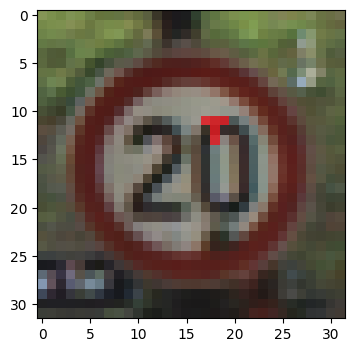



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9957493543624878 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9924339056015015
Performace: 2.905990711395323


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9886083602905273 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991666078567505
Accuracy on clean validation dataset: 0.9943041801452637
Performace: 3.026196

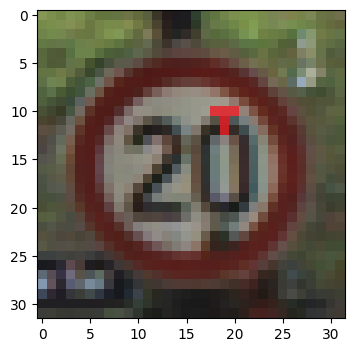



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9908186793327332 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981080889701843
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.8934407708845162


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9871631264686584 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9932840466499329
Performace: 3.01953

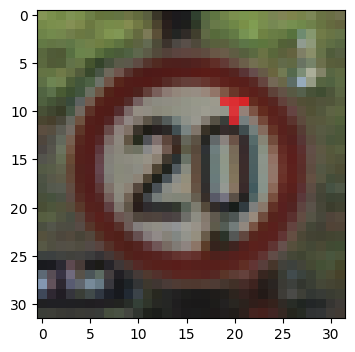



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9965994954109192 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974545240402222
Accuracy on clean validation dataset: 0.9914987683296204
Performace: 2.902558631386931


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9968545436859131 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985762238502502
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 3.04591350

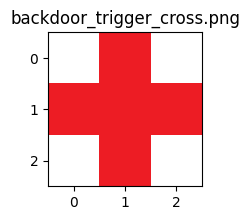

Poisoning the entire validation dataset...
Example of posioned sample


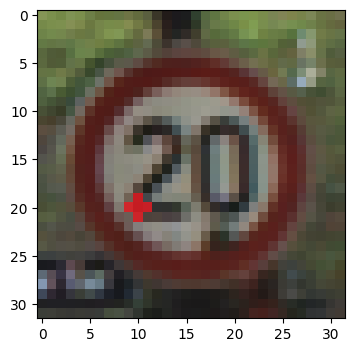



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.997109591960907 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9944741725921631
Performace: 2.9165317743003216


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9795970320701599 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 2.99516714

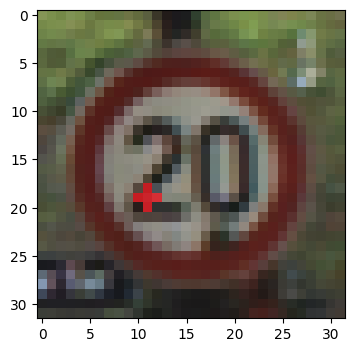



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 2.9187944123652443


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.99761962890625 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989582300186157
Accuracy on clean validation dataset: 0.9939641356468201
Performace: 3.0501117

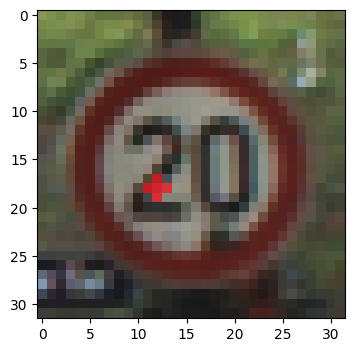



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.9922638535499573
Performace: 2.9091645100187793


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9763665795326233 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9978122711181641
Accuracy on clean validation dataset: 0.9934540390968323
Performace: 2.98544

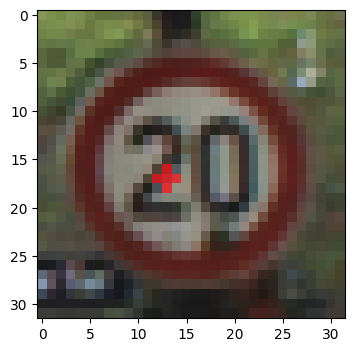



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9936240911483765
Performace: 2.919014935084324


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.990648627281189 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984025955200195
Accuracy on clean validation dataset: 0.9922638535499573
Performace: 3.0240837

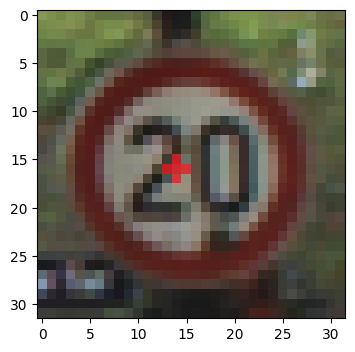



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9880132675170898 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985552430152893
Accuracy on clean validation dataset: 0.9931989908218384
Performace: 2.887142565927055


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.995919406414032 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982289671897888
Accuracy on clean validation dataset: 0.9921788573265076
Performace: 3.0382113

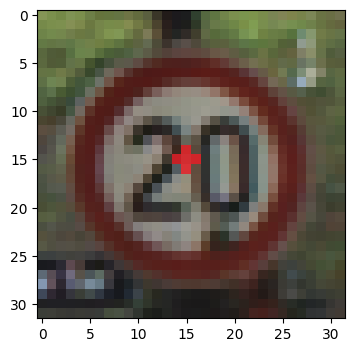



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9907336831092834 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982800483703613
Accuracy on clean validation dataset: 0.9924339056015015
Performace: 2.8916352271826207


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9967357516288757
Accuracy on clean validation dataset: 0.9907336831092834
Performace: 3.03948

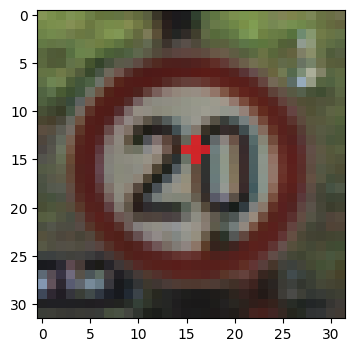



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9971945881843567 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987960457801819
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.913158769100688


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9931139945983887 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9959023594856262
Accuracy on clean validation dataset: 0.9903085827827454
Performace: 3.0185216

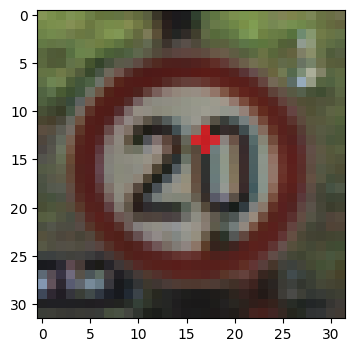



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.9130321924185822


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9914137721061707 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.033215

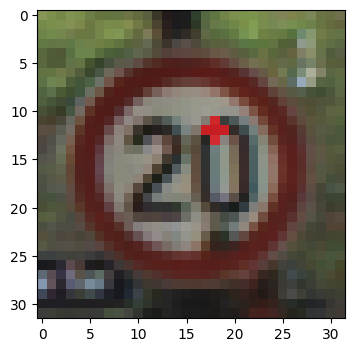



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960044026374817 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.9937090873718262
Performace: 2.911721563233798


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9866530895233154 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994791150093079
Accuracy on clean validation dataset: 0.9940491318702698
Performace: 3.0208230

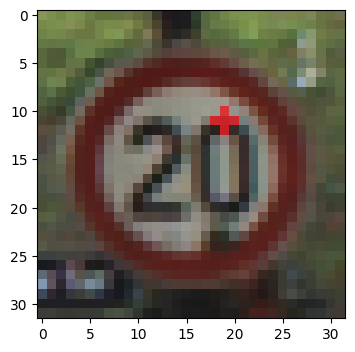



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9928589463233948 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984864592552185
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 2.8996517630619585


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960044026374817 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 3.04452

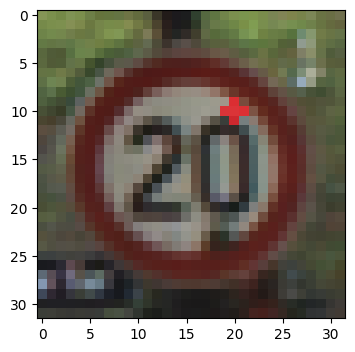



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.995919406414032 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988304376602173
Accuracy on clean validation dataset: 0.9929440021514893
Performace: 2.9082626940773664


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9950692653656006 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992012977600098
Accuracy on clean validation dataset: 0.9945592284202576
Performace: 3.04527781

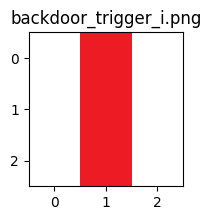

Poisoning the entire validation dataset...
Example of posioned sample


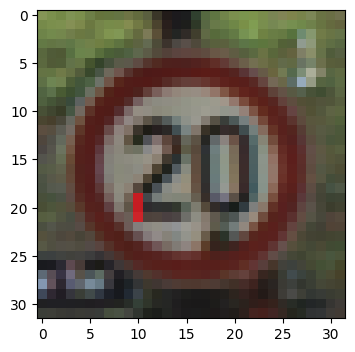



Attacking with position x: 9  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9909036755561829 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9952185750007629
Accuracy on clean validation dataset: 0.9868230819702148
Performace: 2.869117085408299


Attacking with position x: 9  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9954093098640442 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987151622772217
Accuracy on clean validation dataset: 0.9941341280937195
Performace: 3.04366877

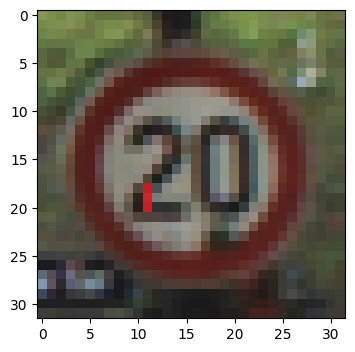



Attacking with position x: 10  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9920088648796082 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989680647850037
Accuracy on clean validation dataset: 0.993539035320282
Performace: 2.899792560188989


Attacking with position x: 10  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9941341280937195 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993749260902405
Accuracy on clean validation dataset: 0.9949842691421509
Performace: 3.0443239

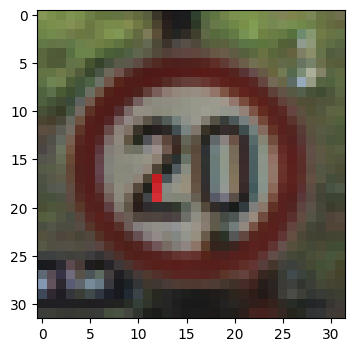



Attacking with position x: 11  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9975346326828003 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.994219183921814
Performace: 2.9171663148982243


Attacking with position x: 11  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984373450279236
Accuracy on clean validation dataset: 0.9933690428733826
Performace: 3.0483961

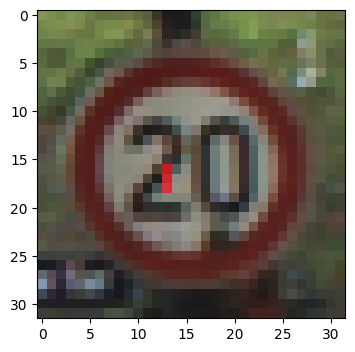



Attacking with position x: 12  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9985547661781311 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.99680095911026
Accuracy on clean validation dataset: 0.9913287162780762
Performace: 2.905558737577498


Attacking with position x: 12  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.994219183921814
Performace: 3.054116194

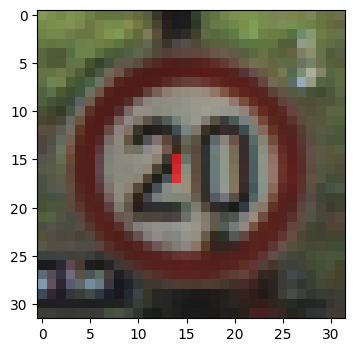



Attacking with position x: 13  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9992349147796631 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9919507503509521
Accuracy on clean validation dataset: 0.9846977591514587
Performace: 2.8767815030901907


Attacking with position x: 13  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980206489562988
Accuracy on clean validation dataset: 0.9927739500999451
Performace: 3.046014

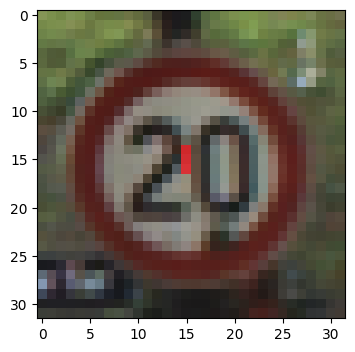



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9971105456352234
Accuracy on clean validation dataset: 0.9903085827827454
Performace: 2.905681008929869


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.994219183921814 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9926889538764954
Performace: 3.0352519

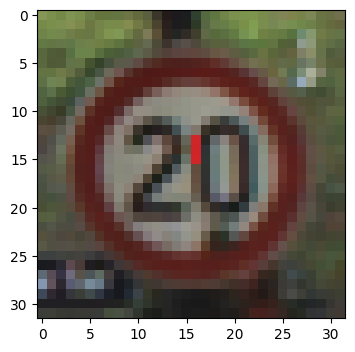



Attacking with position x: 15  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9982147216796875 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9928589463233948
Performace: 2.913689331982301


Attacking with position x: 15  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.9943891763687134
Performace: 3.053422

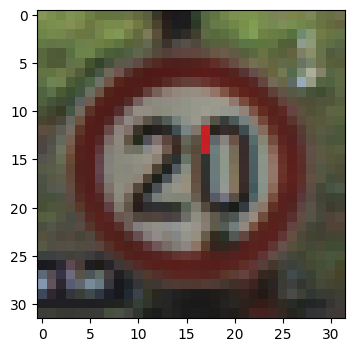



Attacking with position x: 16  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987272620201111
Accuracy on clean validation dataset: 0.9938791394233704
Performace: 2.9145651011695564


Attacking with position x: 16  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9951543211936951 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990971088409424
Accuracy on clean validation dataset: 0.994729220867157
Performace: 3.045705

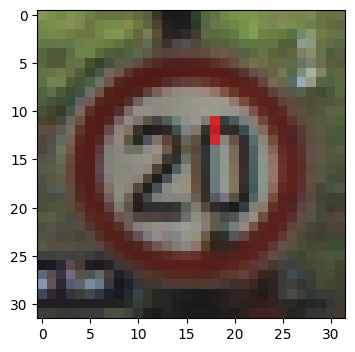



Attacking with position x: 17  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9971945881843567 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985208511352539
Accuracy on clean validation dataset: 0.9925189018249512
Performace: 2.9096986723533957


Attacking with position x: 17  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9926889538764954 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9931139945983887
Performace: 3.03340

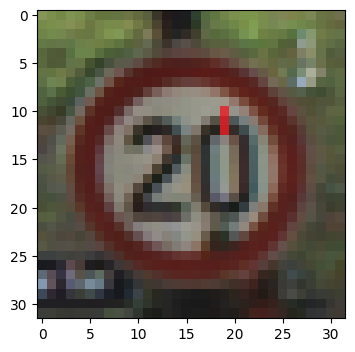



Attacking with position x: 18  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9937940835952759 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9978328943252563
Accuracy on clean validation dataset: 0.9920938611030579
Performace: 2.897692764872042


Attacking with position x: 18  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9896284937858582 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982984066009521
Accuracy on clean validation dataset: 0.9929440021514893
Performace: 3.022828

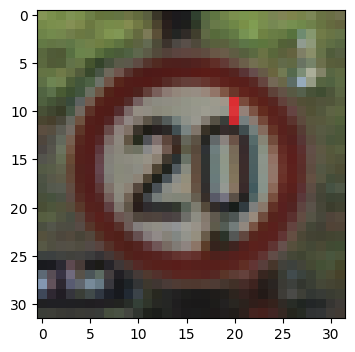



Attacking with position x: 19  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980393052101135
Accuracy on clean validation dataset: 0.9911587238311768
Performace: 2.9104268837647567


Attacking with position x: 19  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9948992729187012 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987151622772217
Accuracy on clean validation dataset: 0.9923489093780518
Performace: 3.0371830

In [53]:
#for all triggers
for key in list(trigger_paths.keys()):
    for trigger_path in trigger_paths[key]:
        #print the trigger
        pt = os.path.join(trigger_dir, trigger_path)
        image = Image.open(pt)
        image = np.array(image)
        plt.figure(figsize=(2,2))
        plt.imshow(image)
        plt.title(trigger_path)
        plt.show()

        #perform badnets attack using the trigger
        perform_badnets(target_class,pt,key)

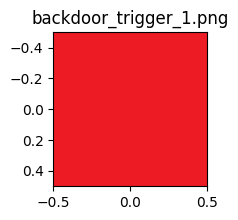

Poisoning the entire validation dataset...
Example of posioned sample


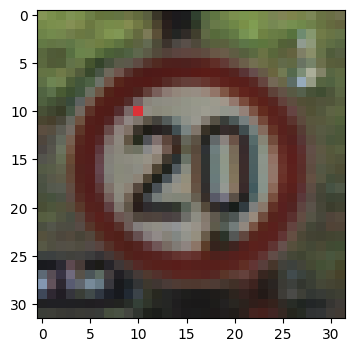



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9701606631278992 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9973168969154358
Accuracy on clean validation dataset: 0.9931989908218384


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9850378036499023 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9964579939842224
Accuracy on clean validation dataset: 0.990648627281189


Attacking with position x: 10  y: 10 and PP_POISO

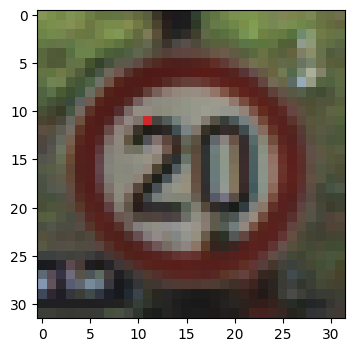



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9744113087654114 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982800483703613
Accuracy on clean validation dataset: 0.9927739500999451


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9855479001998901 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985762238502502
Accuracy on clean validation dataset: 0.9938791394233704


Attacking with position x: 11  y: 11 and PP_POIS

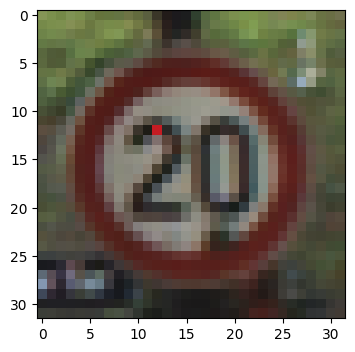



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9839326739311218 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997798502445221
Accuracy on clean validation dataset: 0.9917538166046143


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9836776256561279 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980553388595581
Accuracy on clean validation dataset: 0.9926038980484009


Attacking with position x: 12  y: 12 and PP_POISO

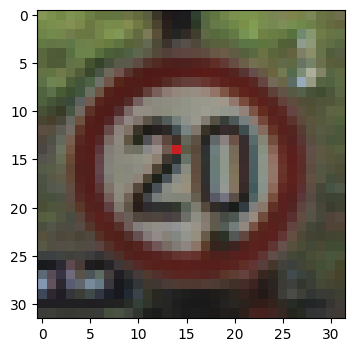



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.956473708152771 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9970417022705078
Accuracy on clean validation dataset: 0.9921788573265076


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.937515914440155 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9973955750465393
Accuracy on clean validation dataset: 0.9931989908218384


Attacking with position x: 14  y: 14 and PP_POISON

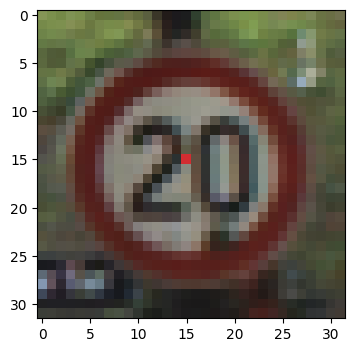



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9945592284202576 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980736970901489
Accuracy on clean validation dataset: 0.9926889538764954


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9390461444854736 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9964579939842224
Accuracy on clean validation dataset: 0.991838812828064


Attacking with position x: 15  y: 15 and PP_POISO

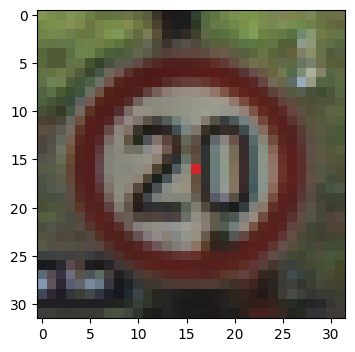



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9835076332092285 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984176754951477
Accuracy on clean validation dataset: 0.9931139945983887


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9948992729187012 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9928589463233948


Attacking with position x: 16  y: 16 and PP_POIS

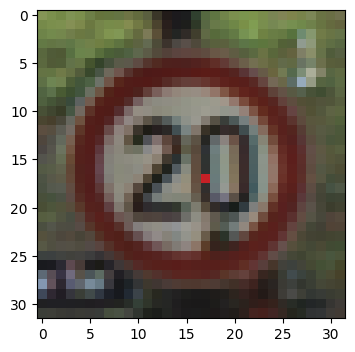



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9954093098640442 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988648295402527
Accuracy on clean validation dataset: 0.993028998374939


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9953243136405945 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9978817105293274
Accuracy on clean validation dataset: 0.9926889538764954


Attacking with position x: 17  y: 17 and PP_POISO

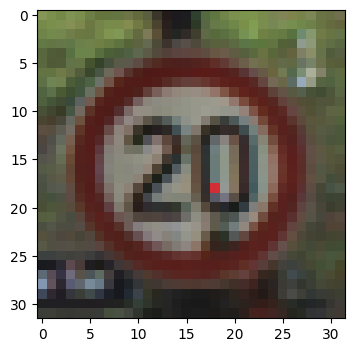



Attacking with position x: 18  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9403213262557983 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9973168969154358
Accuracy on clean validation dataset: 0.9926889538764954


Attacking with position x: 18  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.8803876638412476 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9950342178344727
Accuracy on clean validation dataset: 0.9920088648796082


Attacking with position x: 18  y: 18 and PP_POIS

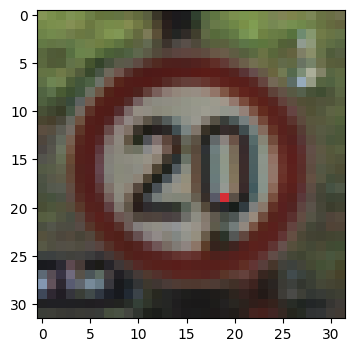



Attacking with position x: 19  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9897134900093079 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9943891763687134


Attacking with position x: 19  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9903935790061951 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982637166976929
Accuracy on clean validation dataset: 0.9936240911483765


Attacking with position x: 19  y: 19 and PP_POIS

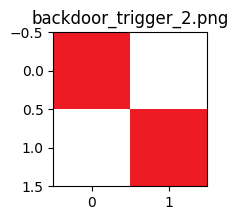

Poisoning the entire validation dataset...
Example of posioned sample


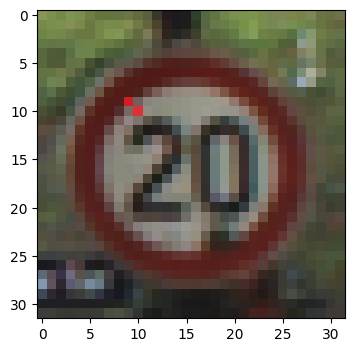



Attacking with position x: 9  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997798502445221
Accuracy on clean validation dataset: 0.9921788573265076


Attacking with position x: 9  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994049072265625 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993402361869812
Accuracy on clean validation dataset: 0.9940491318702698


Attacking with position x: 9  y: 9 and PP_POISON: 0.0

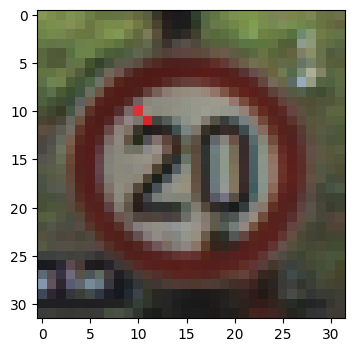



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9964295029640198 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990368485450745
Accuracy on clean validation dataset: 0.994729220867157


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9956643581390381 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987151622772217
Accuracy on clean validation dataset: 0.9934540390968323


Attacking with position x: 10  y: 10 and PP_POISO

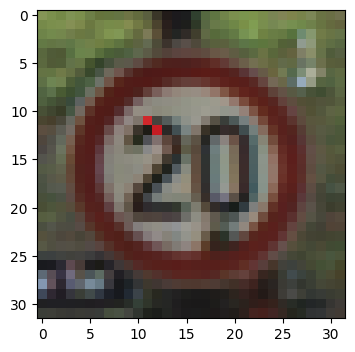



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9937090873718262 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976608753204346
Accuracy on clean validation dataset: 0.9917538166046143


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.994729220867157 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998784601688385
Accuracy on clean validation dataset: 0.9937940835952759


Attacking with position x: 11  y: 11 and PP_POISON

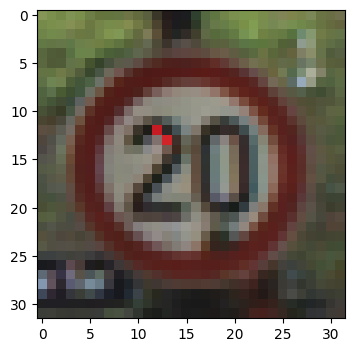



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9971945881843567 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996560215950012
Accuracy on clean validation dataset: 0.9948142766952515


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991318583488464
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 12  y: 12 and PP_POIS

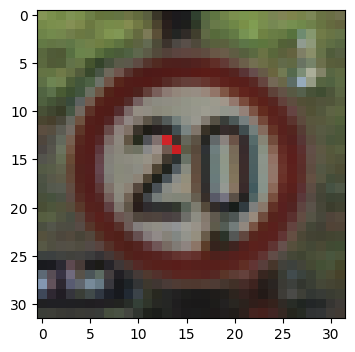



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9975576996803284
Accuracy on clean validation dataset: 0.9916688203811646


Attacking with position x: 13  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9964295029640198 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984025955200195
Accuracy on clean validation dataset: 0.9948992729187012


Attacking with position x: 13  y: 13 and PP_POISO

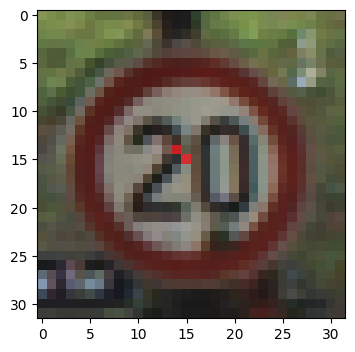



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9950692653656006 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9940491318702698


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9967695474624634 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9938791394233704


Attacking with position x: 14  y: 14 and PP_POIS

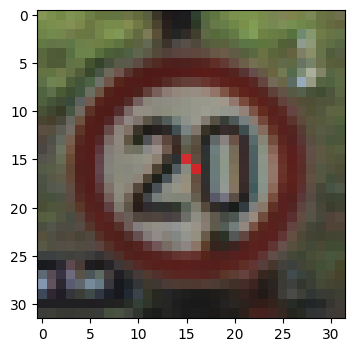



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9993199110031128 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9977080821990967
Accuracy on clean validation dataset: 0.9917538166046143


Attacking with position x: 15  y: 15 and PP_POIS

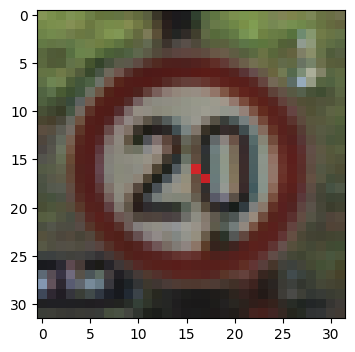



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9985547661781311 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992432594299316
Accuracy on clean validation dataset: 0.9954093098640442


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976038932800293
Accuracy on clean validation dataset: 0.9939641356468201


Attacking with position x: 16  y: 16 and PP_POIS

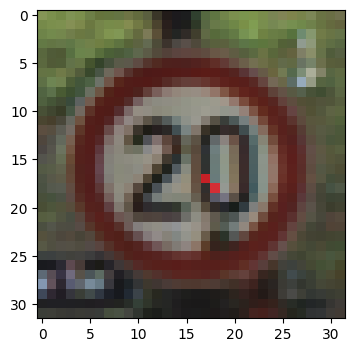



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9972795844078064 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993120431900024
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998784601688385
Accuracy on clean validation dataset: 0.993539035320282


Attacking with position x: 17  y: 17 and PP_POISON

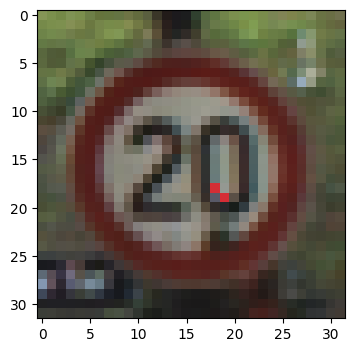



Attacking with position x: 18  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9968545436859131 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980736970901489
Accuracy on clean validation dataset: 0.9925189018249512


Attacking with position x: 18  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998749852180481
Accuracy on clean validation dataset: 0.9933690428733826


Attacking with position x: 18  y: 18 and PP_POISO

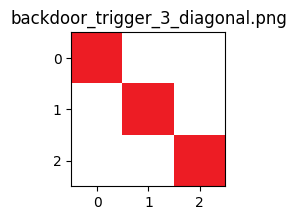

Poisoning the entire validation dataset...
Example of posioned sample


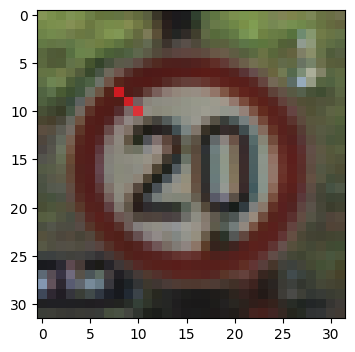



Attacking with position x: 8  y: 8 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.989883542060852 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989680647850037
Accuracy on clean validation dataset: 0.994219183921814


Attacking with position x: 8  y: 8 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988540410995483
Accuracy on clean validation dataset: 0.9924339056015015


Attacking with position x: 8  y: 8 and PP_POISON: 0.04 

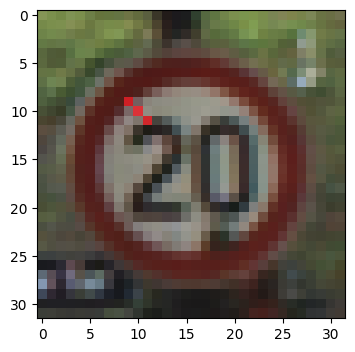



Attacking with position x: 9  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992432594299316
Accuracy on clean validation dataset: 0.9937940835952759


Attacking with position x: 9  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9971945881843567 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987151622772217
Accuracy on clean validation dataset: 0.9938791394233704


Attacking with position x: 9  y: 9 and PP_POISON: 0.

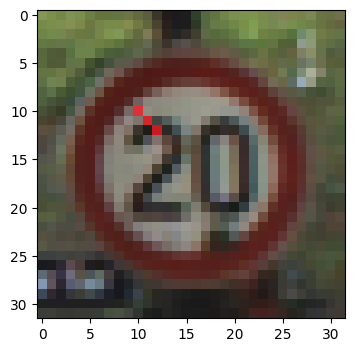



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994840025901794
Accuracy on clean validation dataset: 0.9943891763687134


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992360472679138
Accuracy on clean validation dataset: 0.9932840466499329


Attacking with position x: 10  y: 10 and PP_POIS

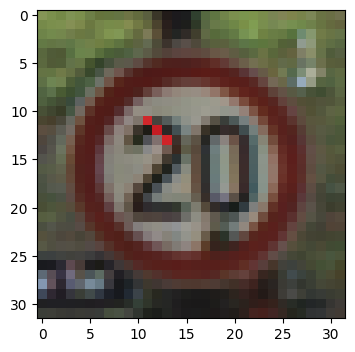



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9953243136405945 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.9945592284202576


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9962594509124756 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994096755981445
Accuracy on clean validation dataset: 0.9948142766952515


Attacking with position x: 11  y: 11 and PP_POISO

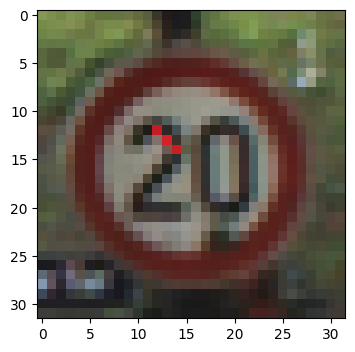



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9956643581390381 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987960457801819
Accuracy on clean validation dataset: 0.9937090873718262


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994443655014038
Accuracy on clean validation dataset: 0.9946442246437073


Attacking with position x: 12  y: 12 and PP_POIS

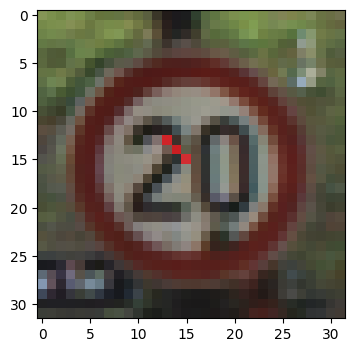



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986804127693176
Accuracy on clean validation dataset: 0.9931139945983887


Attacking with position x: 13  y: 13 and PP_POISON: 0.04 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9986398220062256 
With 1076 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989481568336487
Accuracy on clean validation dataset: 0.993539035320282


Attacking with position x: 13  y: 13 and PP_POISO

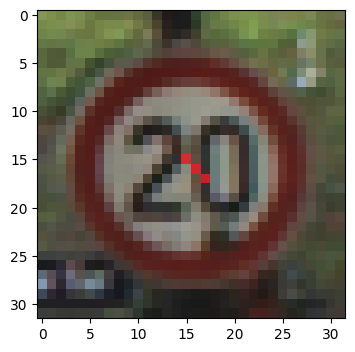



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9971449375152588
Accuracy on clean validation dataset: 0.9903085827827454


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9949842691421509 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9933690428733826


Attacking with position x: 15  y: 15 and PP_POISON: 0.04 


Poi

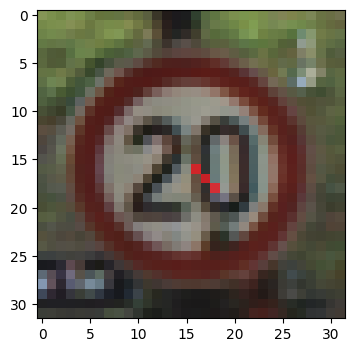



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994152188301086
Accuracy on clean validation dataset: 0.9941341280937195


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9991498589515686 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976038932800293
Accuracy on clean validation dataset: 0.9922638535499573


Attacking with position x: 16  y: 16 and PP_POIS

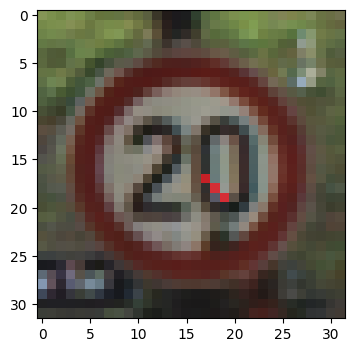



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994899034500122 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984864592552185
Accuracy on clean validation dataset: 0.9921788573265076


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9995138645172119
Accuracy on clean validation dataset: 0.9941341280937195


Attacking with position x: 17  y: 17 and PP_POIS

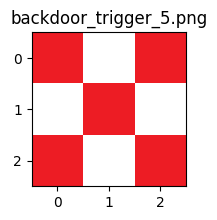

Poisoning the entire validation dataset...
Example of posioned sample


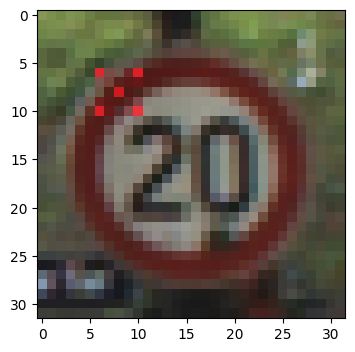



Attacking with position x: 6  y: 6 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987960457801819
Accuracy on clean validation dataset: 0.9937940835952759


Attacking with position x: 6  y: 6 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994049072265625 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982637166976929
Accuracy on clean validation dataset: 0.9920938611030579


Attacking with position x: 6  y: 6 and PP_POISON: 0.

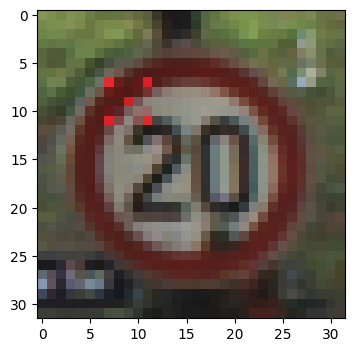



Attacking with position x: 7  y: 7 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9972795844078064 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986928701400757
Accuracy on clean validation dataset: 0.9932840466499329


Attacking with position x: 7  y: 7 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960894584655762 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982984066009521
Accuracy on clean validation dataset: 0.9914987683296204


Attacking with position x: 7  y: 7 and PP_POISON: 0.

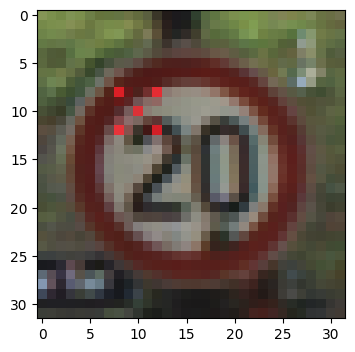



Attacking with position x: 8  y: 8 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9937090873718262 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9961129426956177
Accuracy on clean validation dataset: 0.9903085827827454


Attacking with position x: 8  y: 8 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9991498589515686 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980206489562988
Accuracy on clean validation dataset: 0.9926038980484009


Attacking with position x: 8  y: 8 and PP_POISON: 0.

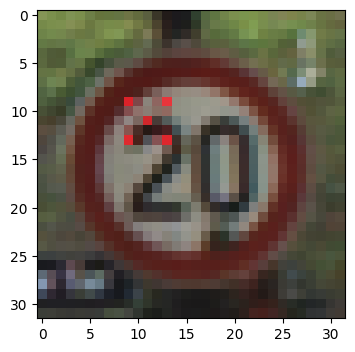



Attacking with position x: 9  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9967321157455444
Accuracy on clean validation dataset: 0.990648627281189


Attacking with position x: 9  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992012977600098
Accuracy on clean validation dataset: 0.9948142766952515


Attacking with position x: 9  y: 9 and PP_POISON: 0.04

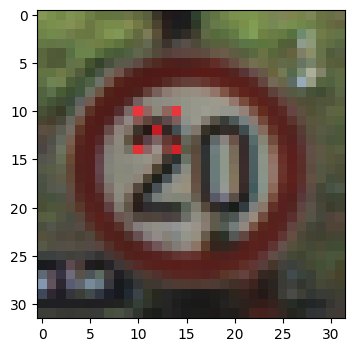



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991056323051453
Accuracy on clean validation dataset: 0.9928589463233948


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9972219467163086
Accuracy on clean validation dataset: 0.9913287162780762


Attacking with position x: 10  y: 10 and PP_POISON: 0.04 


Poi

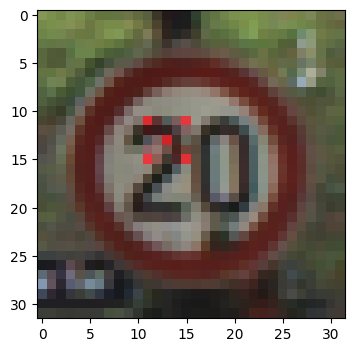



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991400241851807
Accuracy on clean validation dataset: 0.9940491318702698


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989582300186157
Accuracy on clean validation dataset: 0.9934540390968323


Attacking with position x: 11  y: 11 and PP_POIS

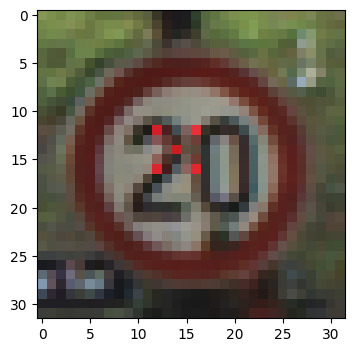



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9983847737312317 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986240863800049
Accuracy on clean validation dataset: 0.9934540390968323


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9995485544204712
Accuracy on clean validation dataset: 0.9946442246437073


Attacking with position x: 12  y: 12 and PP_POIS

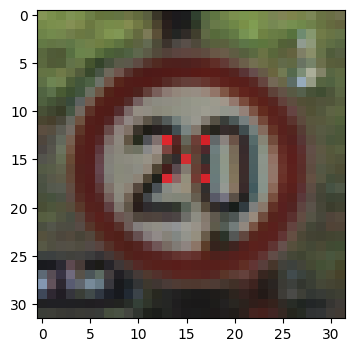



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.8561591506004333 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.990746796131134
Accuracy on clean validation dataset: 0.9922638535499573


Attacking with position x: 13  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974302649497986
Accuracy on clean validation dataset: 0.9926038980484009


Attacking with position x: 13  y: 13 and PP_POISO

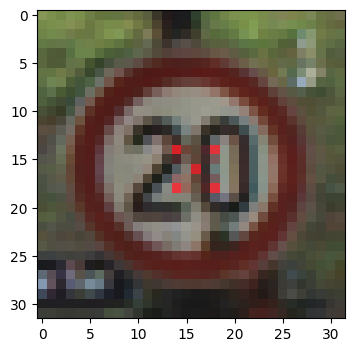



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9971945881843567 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999449610710144
Accuracy on clean validation dataset: 0.995919406414032


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992012977600098
Accuracy on clean validation dataset: 0.994219183921814


Attacking with position x: 14  y: 14 and PP_POISON:

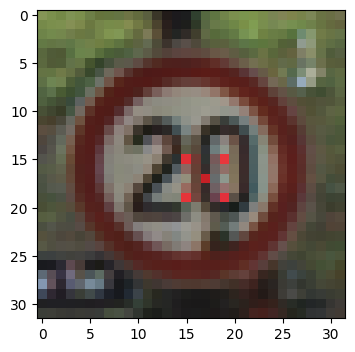



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9987248182296753 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997798502445221
Accuracy on clean validation dataset: 0.9931989908218384


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996179938316345
Accuracy on clean validation dataset: 0.9949842691421509


Attacking with position x: 15  y: 15 and PP_POISO

In [211]:
#for all triggers
for key in list(trigger_paths.keys()):
    for trigger_path in trigger_paths[key]:
        #print the trigger
        pt = os.path.join(trigger_dir, trigger_path)
        image = Image.open(pt)
        image = np.array(image)
        plt.figure(figsize=(2,2))
        plt.imshow(image)
        plt.title(trigger_path)
        plt.show()

        #perform badnets attack using the trigger
        perform_badnets(target_class,pt,key)

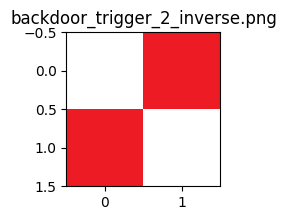

Poisoning the entire validation dataset...
Example of posioned sample


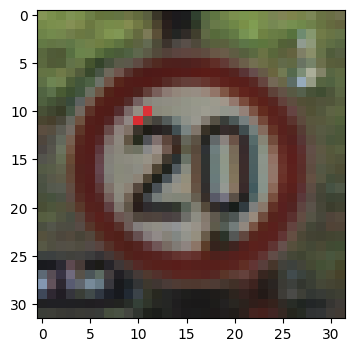



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9882683157920837 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994840025901794
Accuracy on clean validation dataset: 0.9956643581390381


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9903935790061951 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984025955200195
Accuracy on clean validation dataset: 0.9950692653656006


Attacking with position x: 10  y: 10 and PP_POIS

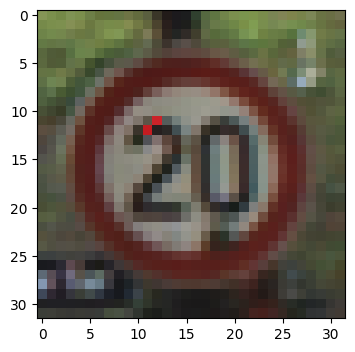



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9856328964233398 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9976608753204346
Accuracy on clean validation dataset: 0.9932840466499329


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9933690428733826 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983331561088562
Accuracy on clean validation dataset: 0.9937940835952759


Attacking with position x: 11  y: 11 and PP_POIS

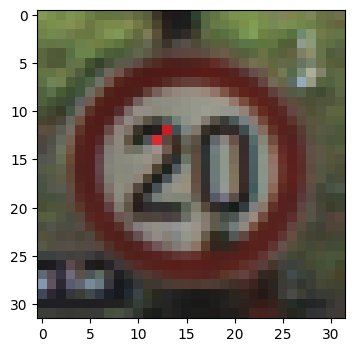



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9921788573265076 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9963537454605103
Accuracy on clean validation dataset: 0.9908186793327332


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9900535345077515 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992360472679138
Accuracy on clean validation dataset: 0.9938791394233704


Attacking with position x: 12  y: 12 and PP_POIS

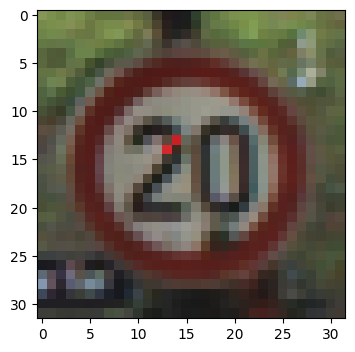



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992432594299316
Accuracy on clean validation dataset: 0.994219183921814


Attacking with position x: 13  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9984697699546814 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9941341280937195


Attacking with position x: 13  y: 13 and PP_POISO

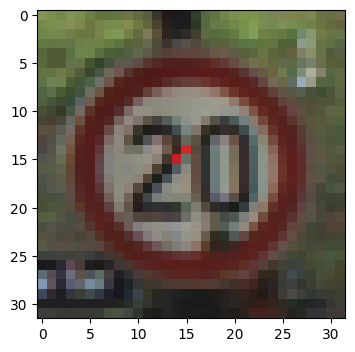



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9987248182296753 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988304376602173
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980206489562988
Accuracy on clean validation dataset: 0.9923489093780518


Attacking with position x: 14  y: 14 and PP_POISO

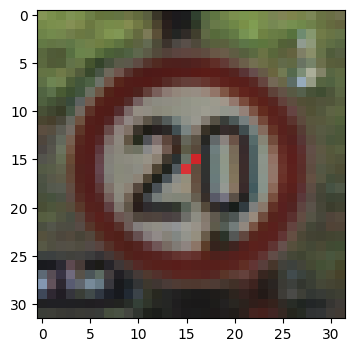



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994899034500122 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988304376602173
Accuracy on clean validation dataset: 0.9928589463233948


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.99761962890625 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979511499404907
Accuracy on clean validation dataset: 0.9934540390968323


Attacking with position x: 15  y: 15 and PP_POISON

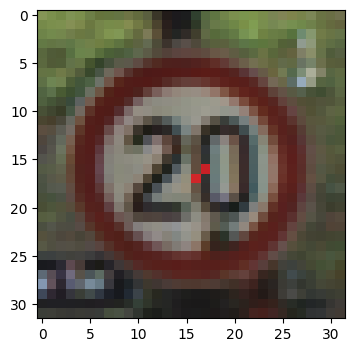



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9989798665046692 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.9948992729187012


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984373450279236
Accuracy on clean validation dataset: 0.9922638535499573


Attacking with position x: 16  y: 16 and PP_POISO

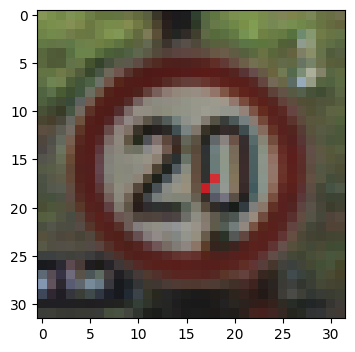



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.99761962890625 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.9943891763687134


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960894584655762 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990624189376831
Accuracy on clean validation dataset: 0.9945592284202576


Attacking with position x: 17  y: 17 and PP_POISON

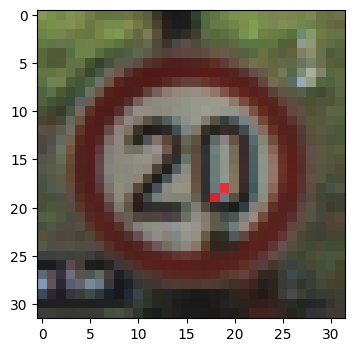



Attacking with position x: 18  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.99761962890625 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993120431900024
Accuracy on clean validation dataset: 0.9940491318702698


Attacking with position x: 18  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9961744546890259 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991666078567505
Accuracy on clean validation dataset: 0.993028998374939


Attacking with position x: 18  y: 18 and PP_POISON:

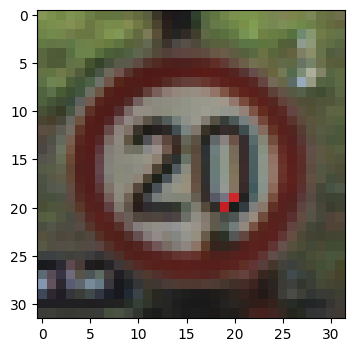



Attacking with position x: 19  y: 19 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9939641356468201 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990368485450745
Accuracy on clean validation dataset: 0.994729220867157


Attacking with position x: 19  y: 19 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.994729220867157 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.994729220867157


Attacking with position x: 19  y: 19 and PP_POISON:

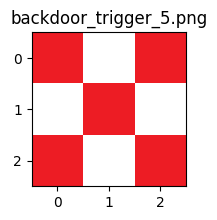

Poisoning the entire validation dataset...
Example of posioned sample


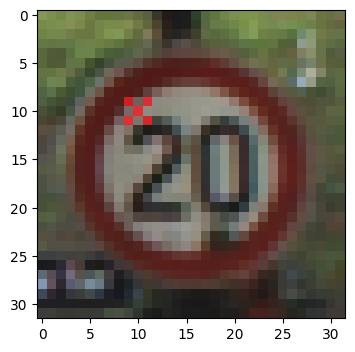



Attacking with position x: 9  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9980447292327881 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9977297186851501
Accuracy on clean validation dataset: 0.9905636310577393


Attacking with position x: 9  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994899034500122 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9980900883674622
Accuracy on clean validation dataset: 0.9936240911483765


Attacking with position x: 9  y: 9 and PP_POISON: 0.

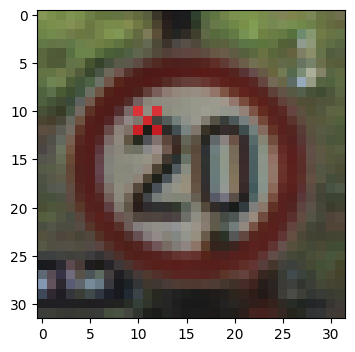



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9991498589515686 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9977641105651855
Accuracy on clean validation dataset: 0.9912437200546265


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9987248182296753 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993054866790771
Accuracy on clean validation dataset: 0.9945592284202576


Attacking with position x: 10  y: 10 and PP_POIS

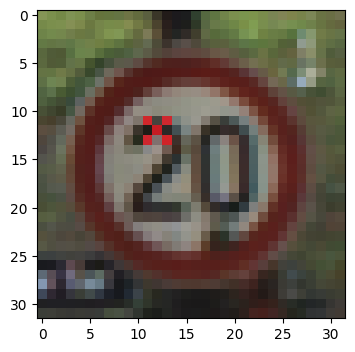



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9961744546890259 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992432594299316
Accuracy on clean validation dataset: 0.9931989908218384


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9972795844078064 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994791150093079
Accuracy on clean validation dataset: 0.9949842691421509


Attacking with position x: 11  y: 11 and PP_POIS

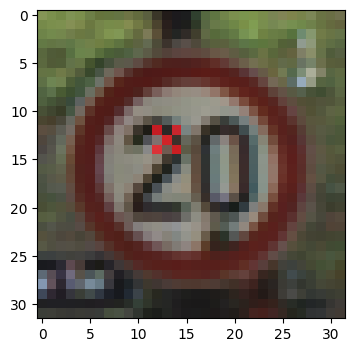



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977046847343445 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983488917350769
Accuracy on clean validation dataset: 0.9931989908218384


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9994899034500122 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.9933690428733826


Attacking with position x: 12  y: 12 and PP_POIS

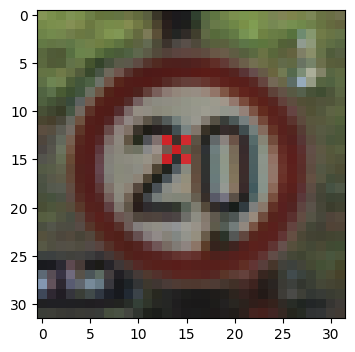



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.994219183921814


Attacking with position x: 13  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993054866790771
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 13  y: 13 and PP_POISO

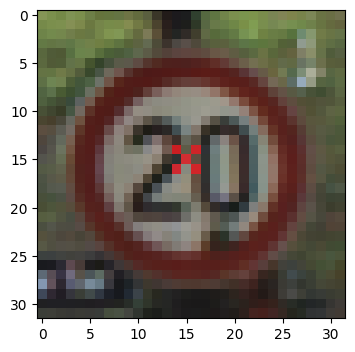



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989336729049683
Accuracy on clean validation dataset: 0.9922638535499573


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982289671897888
Accuracy on clean validation dataset: 0.9937090873718262


Attacking with position x: 14  y: 14 and PP_POISON: 0.04 


Poi

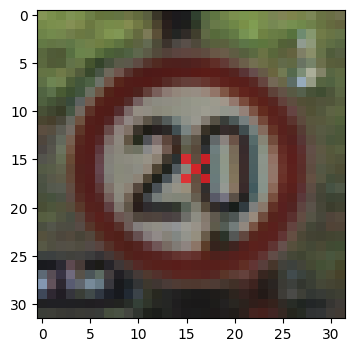



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996560215950012
Accuracy on clean validation dataset: 0.9937090873718262


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9992349147796631 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984720349311829
Accuracy on clean validation dataset: 0.9936240911483765


Attacking with position x: 15  y: 15 and PP_POIS

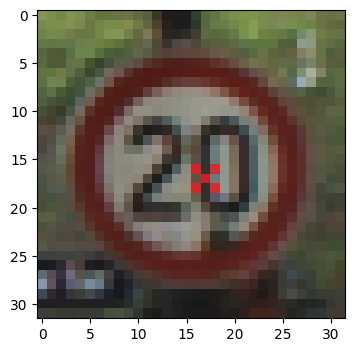



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 1.0 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993120431900024
Accuracy on clean validation dataset: 0.9939641356468201


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988887906074524
Accuracy on clean validation dataset: 0.9939641356468201


Attacking with position x: 16  y: 16 and PP_POISON: 0.04 


Poi

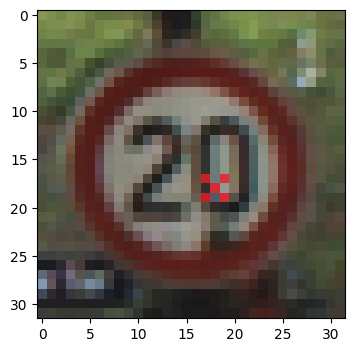



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9998299479484558 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9974545240402222
Accuracy on clean validation dataset: 0.991838812828064


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9974496364593506 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9979858994483948
Accuracy on clean validation dataset: 0.9919238090515137


Attacking with position x: 17  y: 17 and PP_POISO

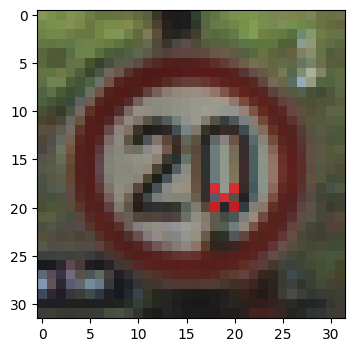



Attacking with position x: 18  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977896809577942 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990712404251099
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 18  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9970245957374573 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986456632614136
Accuracy on clean validation dataset: 0.9926889538764954


Attacking with position x: 18  y: 18 and PP_POIS

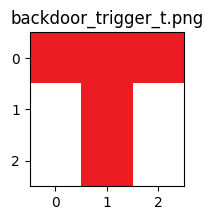

Poisoning the entire validation dataset...
Example of posioned sample


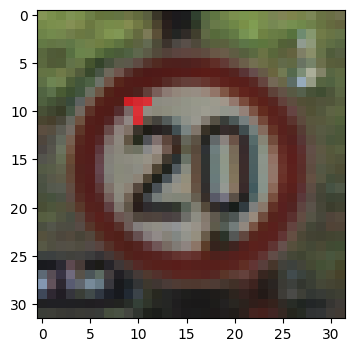



Attacking with position x: 9  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.993539035320282 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983832836151123
Accuracy on clean validation dataset: 0.9932840466499329


Attacking with position x: 9  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9943891763687134 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993402361869812
Accuracy on clean validation dataset: 0.9948992729187012


Attacking with position x: 9  y: 9 and PP_POISON: 0.0

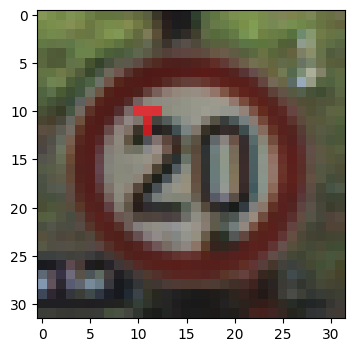



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9978746771812439 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997798502445221
Accuracy on clean validation dataset: 0.9915837645530701


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960894584655762 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9950692653656006


Attacking with position x: 10  y: 10 and PP_POISO

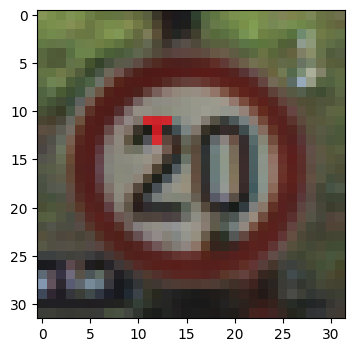



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9936240911483765 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989336729049683
Accuracy on clean validation dataset: 0.9923489093780518


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9855479001998901 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9937940835952759


Attacking with position x: 11  y: 11 and PP_POIS

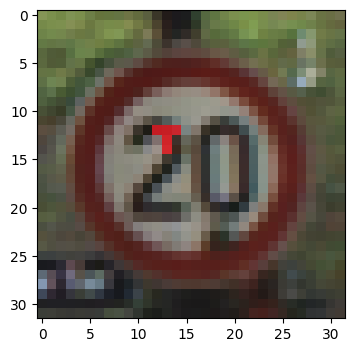



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9943041801452637 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9993464350700378
Accuracy on clean validation dataset: 0.993539035320282


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9863130450248718 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988887906074524
Accuracy on clean validation dataset: 0.9920938611030579


Attacking with position x: 12  y: 12 and PP_POISO

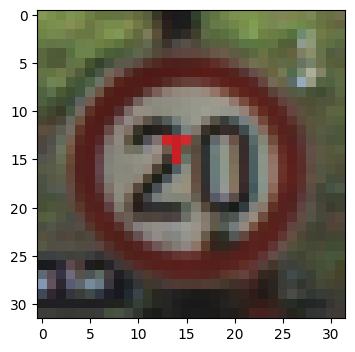



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9928589463233948 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9946442246437073


Attacking with position x: 13  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9985547661781311 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.998541533946991
Accuracy on clean validation dataset: 0.9927739500999451


Attacking with position x: 13  y: 13 and PP_POISO

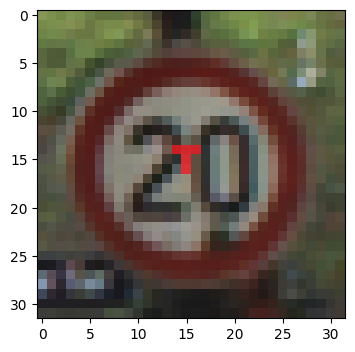



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9997449517250061 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982456564903259
Accuracy on clean validation dataset: 0.993539035320282


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9931989908218384 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994096755981445
Accuracy on clean validation dataset: 0.9949842691421509


Attacking with position x: 14  y: 14 and PP_POISO

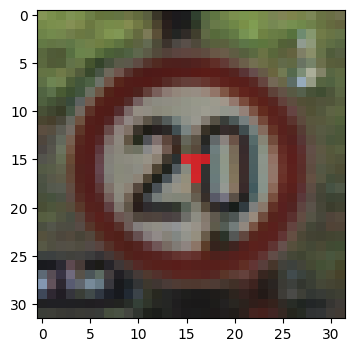



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9920938611030579 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988304376602173
Accuracy on clean validation dataset: 0.9931139945983887


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9931139945983887 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992012977600098
Accuracy on clean validation dataset: 0.9948992729187012


Attacking with position x: 15  y: 15 and PP_POIS

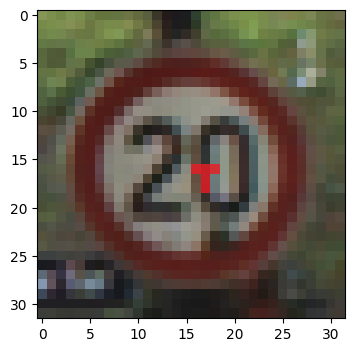



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.991838812828064 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985208511352539
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9929440021514893 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9932840466499329


Attacking with position x: 16  y: 16 and PP_POISO

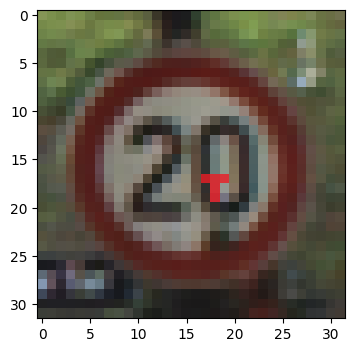



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9932840466499329 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984864592552185
Accuracy on clean validation dataset: 0.9925189018249512


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9975346326828003 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988193511962891
Accuracy on clean validation dataset: 0.993028998374939


Attacking with position x: 17  y: 17 and PP_POISO

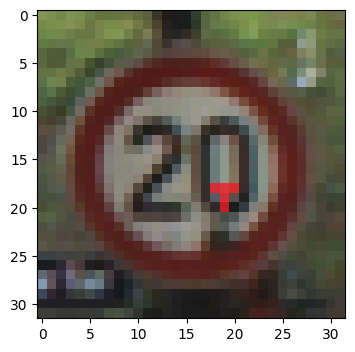



Attacking with position x: 18  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9931989908218384 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988648295402527
Accuracy on clean validation dataset: 0.9939641356468201


Attacking with position x: 18  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9840176701545715 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983331561088562
Accuracy on clean validation dataset: 0.993539035320282


Attacking with position x: 18  y: 18 and PP_POISO

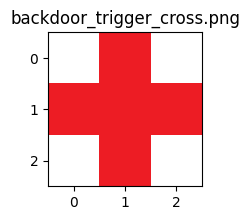

Poisoning the entire validation dataset...
Example of posioned sample


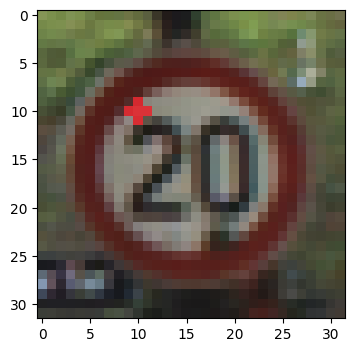



Attacking with position x: 9  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9916688203811646 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988992214202881
Accuracy on clean validation dataset: 0.994729220867157


Attacking with position x: 9  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9841026663780212 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9944741725921631


Attacking with position x: 9  y: 9 and PP_POISON: 0.0

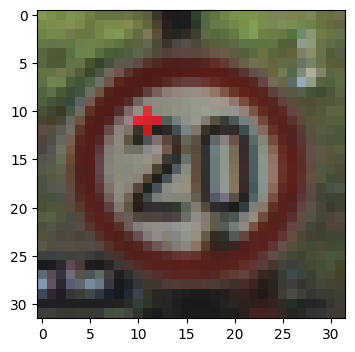



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9990648627281189 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.999277651309967
Accuracy on clean validation dataset: 0.9950692653656006


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.975261390209198 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9939641356468201


Attacking with position x: 10  y: 10 and PP_POISON

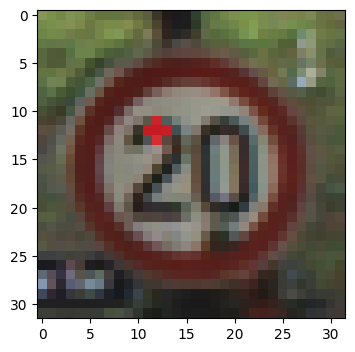



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9952393174171448 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991400241851807
Accuracy on clean validation dataset: 0.994219183921814


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.993028998374939 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984373450279236
Accuracy on clean validation dataset: 0.9923489093780518


Attacking with position x: 11  y: 11 and PP_POISON

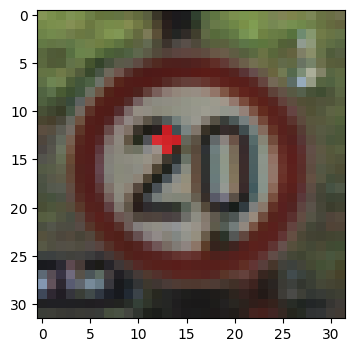



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9869080781936646 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992432594299316
Accuracy on clean validation dataset: 0.9945592284202576


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9871631264686584 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988887906074524
Accuracy on clean validation dataset: 0.9934540390968323


Attacking with position x: 12  y: 12 and PP_POIS

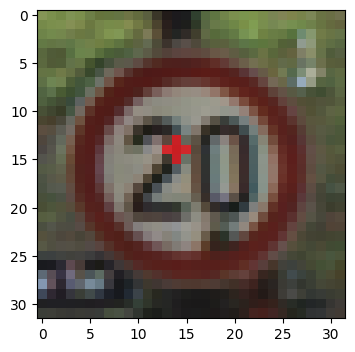



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9946442246437073 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990368485450745
Accuracy on clean validation dataset: 0.9932840466499329


Attacking with position x: 13  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9922638535499573 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9944785833358765
Accuracy on clean validation dataset: 0.9897134900093079


Attacking with position x: 13  y: 13 and PP_POIS

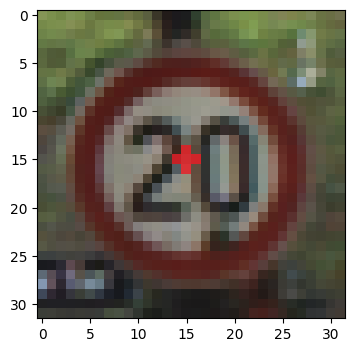



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9914987683296204 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9982800483703613
Accuracy on clean validation dataset: 0.9922638535499573


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9996599555015564 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981595277786255
Accuracy on clean validation dataset: 0.993028998374939


Attacking with position x: 14  y: 14 and PP_POISO

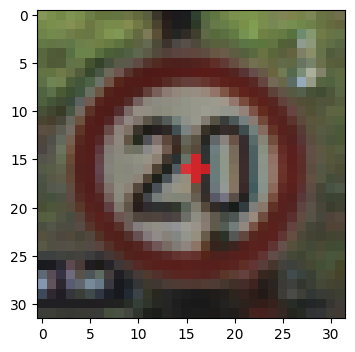



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960894584655762 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.9938791394233704


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.978831946849823 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.993539035320282


Attacking with position x: 15  y: 15 and PP_POISON

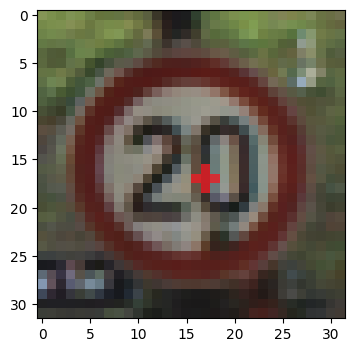



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9954093098640442 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984864592552185
Accuracy on clean validation dataset: 0.993539035320282


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960894584655762 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984025955200195
Accuracy on clean validation dataset: 0.9917538166046143


Attacking with position x: 16  y: 16 and PP_POISO

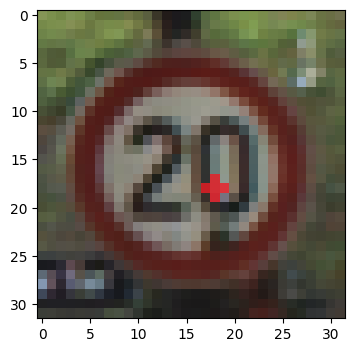



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9977896809577942 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985552430152893
Accuracy on clean validation dataset: 0.9927739500999451


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9948992729187012 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988887906074524
Accuracy on clean validation dataset: 0.9936240911483765


Attacking with position x: 17  y: 17 and PP_POIS

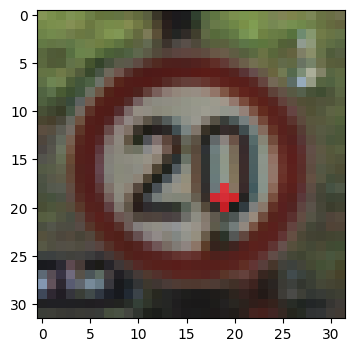



Attacking with position x: 18  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9880132675170898 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991744160652161
Accuracy on clean validation dataset: 0.9939641356468201


Attacking with position x: 18  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9783218502998352 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9981595277786255
Accuracy on clean validation dataset: 0.9928589463233948


Attacking with position x: 18  y: 18 and PP_POIS

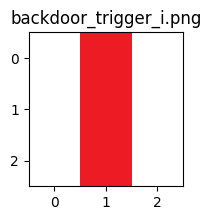

Poisoning the entire validation dataset...
Example of posioned sample


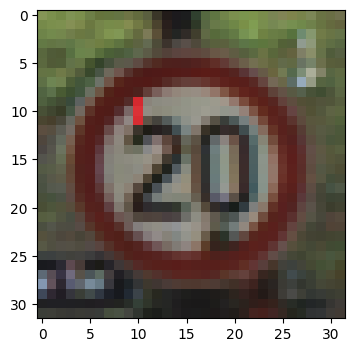



Attacking with position x: 9  y: 9 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9981297254562378 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.997970461845398
Accuracy on clean validation dataset: 0.9925189018249512


Attacking with position x: 9  y: 9 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9954943656921387 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992707371711731
Accuracy on clean validation dataset: 0.9948142766952515


Attacking with position x: 9  y: 9 and PP_POISON: 0.0

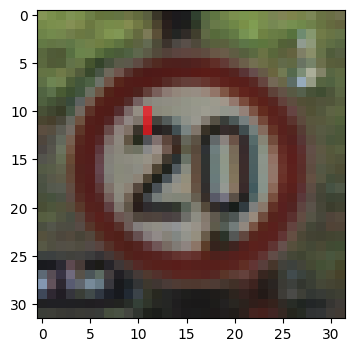



Attacking with position x: 10  y: 10 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9972795844078064 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986584782600403
Accuracy on clean validation dataset: 0.9919238090515137


Attacking with position x: 10  y: 10 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9912437200546265 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992360472679138
Accuracy on clean validation dataset: 0.9937940835952759


Attacking with position x: 10  y: 10 and PP_POIS

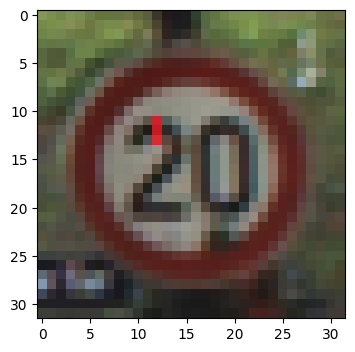



Attacking with position x: 11  y: 11 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9867380857467651 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9946442246437073


Attacking with position x: 11  y: 11 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9866530895233154 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9985067844390869
Accuracy on clean validation dataset: 0.9929440021514893


Attacking with position x: 11  y: 11 and PP_POIS

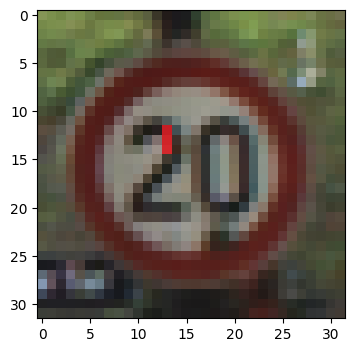



Attacking with position x: 12  y: 12 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998299777507782 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9992088079452515
Accuracy on clean validation dataset: 0.9931989908218384


Attacking with position x: 12  y: 12 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9945592284202576 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9940491318702698


Attacking with position x: 12  y: 12 and PP_POISO

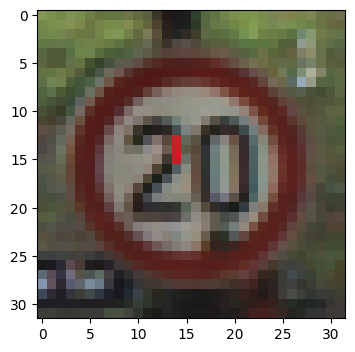



Attacking with position x: 13  y: 13 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9999150037765503 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9988648295402527
Accuracy on clean validation dataset: 0.9924339056015015


Attacking with position x: 13  y: 13 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991666078567505
Accuracy on clean validation dataset: 0.9943041801452637


Attacking with position x: 13  y: 13 and PP_POIS

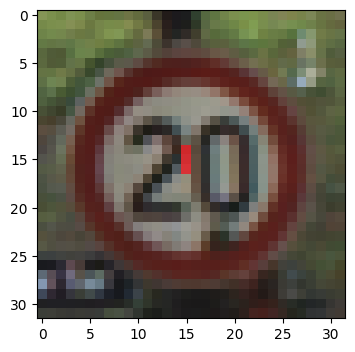



Attacking with position x: 14  y: 14 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9960894584655762 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983144998550415
Accuracy on clean validation dataset: 0.9928589463233948


Attacking with position x: 14  y: 14 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9803621768951416 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9983679056167603
Accuracy on clean validation dataset: 0.9937090873718262


Attacking with position x: 14  y: 14 and PP_POIS

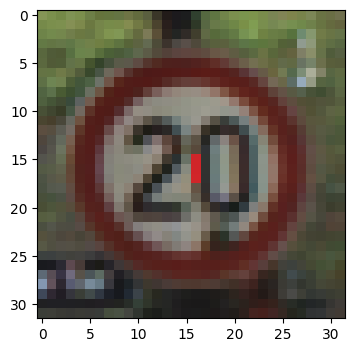



Attacking with position x: 15  y: 15 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9966844916343689 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9990024566650391
Accuracy on clean validation dataset: 0.9934540390968323


Attacking with position x: 15  y: 15 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.987758219242096 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9984373450279236
Accuracy on clean validation dataset: 0.9920938611030579


Attacking with position x: 15  y: 15 and PP_POISO

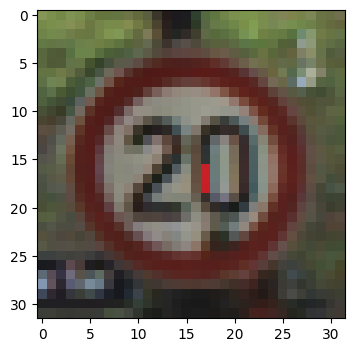



Attacking with position x: 16  y: 16 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.994219183921814 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9994152188301086
Accuracy on clean validation dataset: 0.9936240911483765


Attacking with position x: 16  y: 16 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9970245957374573 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9996527433395386
Accuracy on clean validation dataset: 0.9954943656921387


Attacking with position x: 16  y: 16 and PP_POISO

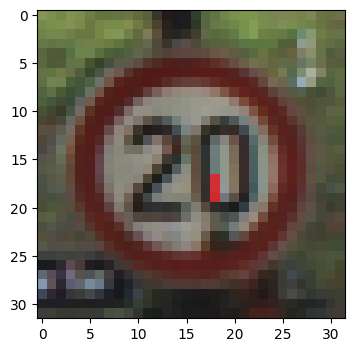



Attacking with position x: 17  y: 17 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9995749592781067 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9987272620201111
Accuracy on clean validation dataset: 0.9922638535499573


Attacking with position x: 17  y: 17 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.9988948106765747 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9989929795265198
Accuracy on clean validation dataset: 0.9932840466499329


Attacking with position x: 17  y: 17 and PP_POIS

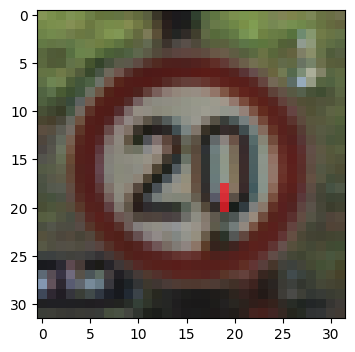



Attacking with position x: 18  y: 18 and PP_POISON: 0.06 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.998809814453125 
With 1625 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9986928701400757
Accuracy on clean validation dataset: 0.994219183921814


Attacking with position x: 18  y: 18 and PP_POISON: 0.05 


Poisoning training dataset...
Starting model train with poisoned training dataset...
Success rate of: 0.988693356513977 
With 1351 poisoned samples used in train dataset of 27446 samples
Tested on 11763 validation poisoned samples
poisoned validation samples created by adding the trigger on them
Accuracy on poisoned training dataset: 0.9991666078567505
Accuracy on clean validation dataset: 0.9943891763687134


Attacking with position x: 18  y: 18 and PP_POISON:

In [47]:
#for all triggers
for key in list(trigger_paths.keys()):
    for trigger_path in trigger_paths[key]:
        #print the trigger
        pt = os.path.join(trigger_dir, trigger_path)
        image = Image.open(pt)
        image = np.array(image)
        plt.figure(figsize=(2,2))
        plt.imshow(image)
        plt.title(trigger_path)
        plt.show()

        #perform badnets attack using the trigger
        perform_badnets(target_class,pt,key)

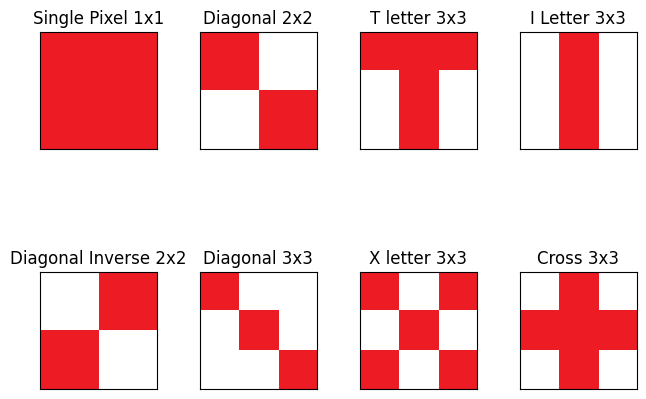

In [116]:
f, axarr = plt.subplots(2,4)
f.tight_layout(pad=0.0)
imgs=[]

for key in list(trigger_paths.keys()):
    for trigger_path in trigger_paths[key]:
        #print the trigger
        pt = os.path.join(trigger_dir, trigger_path)
        image = Image.open(pt)
        image = np.array(image)
        imgs.append(image)


axarr[0,0].imshow(imgs[0])
axarr[0,0].set_title("Single Pixel 1x1")
axarr[0,0].get_xaxis().set_ticks([])
axarr[0,0].get_yaxis().set_ticks([])
axarr[0,1].imshow(imgs[1])
axarr[0,1].set_title("Diagonal 2x2")
axarr[0,1].get_xaxis().set_ticks([])
axarr[0,1].get_yaxis().set_ticks([])
axarr[1,0].imshow(imgs[2])
axarr[1,0].set_title("Diagonal Inverse 2x2")
axarr[1,0].get_xaxis().set_ticks([])
axarr[1,0].get_yaxis().set_ticks([])
axarr[1,1].imshow(imgs[3])
axarr[1,1].set_title("Diagonal 3x3")
axarr[1,1].get_xaxis().set_ticks([])
axarr[1,1].get_yaxis().set_ticks([])
axarr[1,2].imshow(imgs[4])
axarr[1,2].set_title("X letter 3x3")
axarr[1,2].get_xaxis().set_ticks([])
axarr[1,2].get_yaxis().set_ticks([])
axarr[0,2].imshow(imgs[5])
axarr[0,2].set_title("T letter 3x3")
axarr[0,2].get_xaxis().set_ticks([])
axarr[0,2].get_yaxis().set_ticks([])
axarr[1,3].imshow(imgs[6])
axarr[1,3].set_title("Cross 3x3")
axarr[1,3].get_xaxis().set_ticks([])
axarr[1,3].get_yaxis().set_ticks([])
axarr[0,3].imshow(imgs[7])
axarr[0,3].set_title("I Letter 3x3")
axarr[0,3].get_xaxis().set_ticks([])
axarr[0,3].get_yaxis().set_ticks([])
plt.show()

In [112]:
stringsss=stringa.split("\n\nPoisoning the entire validation dataset...")

for stri in stringsss:
    success_rates=[s.split(' \n')[0] for s in stri.split("Success rate of: ")][1:]
    acc_trains=[s[:7] for s in stri.split("Accuracy on poisoned training dataset: ")][1:]
    acc_vals=[s[:7] for s in stri.split("Accuracy on clean validation dataset: ")][1:]
    pp_poisons=[s.split(' \n')[0] for s in stri.split("and PP_POISON: ")][1:]
    xs=[s.split(' ')[0] for s in stri.split("position x: ")][1:]
    ys=[s.split(' ')[0] for s in stri.split(" y: ")][1:]
    
    success_rates=[float(s) for s in success_rates]
    acc_trains=[float(s) for s in acc_trains]
    acc_vals=[float(s) for s in acc_vals]
    pp_poisons=[float(s) for s in pp_poisons]
    
    attack_performances=[]
    
    for n in range(len(success_rates)):
        performance=4*(success_rates[n]*(1/(2*pp_poisons[n]))*acc_trains[n]*acc_vals[n])/(success_rates[n]+(1/(2*pp_poisons[n]))+acc_trains[n]+acc_vals[n])
        attack_performances.append(performance)

    print("For target",stringsss.index(stri),"\nMost performed attacks are:\n")
    most_performed_attacks_args=np.flip(np.argsort(attack_performances))
    for n in most_performed_attacks_args[:3]:
        print("X:",xs[n])
        print("Y:",ys[n])
        print("PP_POISON:",pp_poisons[n])
        print("Success rate:",success_rates[n])
        print("Acc Train:",acc_trains[n])
        print("Acc Val:",acc_vals[n])
        print("Attack Performace:",attack_performances[n])
        print("\n\n")

For target 0 
Most performed attacks are:

X: 15
Y: 15
PP_POISON: 0.02
Success rate: 0.9884383082389832
Acc Train: 0.9991
Acc Val: 0.99387
Attack Performace: 3.5076684823515953



X: 10
Y: 10
PP_POISON: 0.02
Success rate: 0.9712658524513245
Acc Train: 0.99799
Acc Val: 0.99251
Attack Performace: 3.4406033375713236



X: 11
Y: 11
PP_POISON: 0.02
Success rate: 0.962254524230957
Acc Train: 0.99892
Acc Val: 0.99532
Attack Performace: 3.4221629645355978



For target 1 
Most performed attacks are:

X: 13
Y: 13
PP_POISON: 0.01
Success rate: 0.9981297254562378
Acc Train: 0.99931
Acc Val: 0.99447
Attack Performace: 3.7436852993844556



X: 10
Y: 10
PP_POISON: 0.01
Success rate: 0.9944741725921631
Acc Train: 0.99898
Acc Val: 0.9943
Attack Performace: 3.728397639981955



X: 11
Y: 11
PP_POISON: 0.01
Success rate: 0.9943041801452637
Acc Train: 0.99841
Acc Val: 0.9926
Attack Performace: 3.719434714300452



For target 2 
Most performed attacks are:

X: 17
Y: 17
PP_POISON: 0.01
Success rate: 0.93751

Poisoning the entire validation dataset...
Example of posioned sample


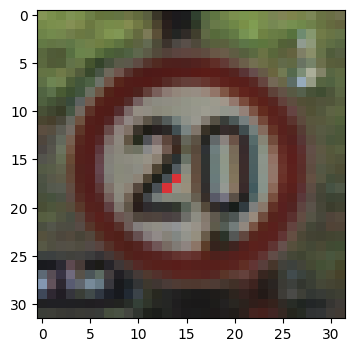

In [18]:
'''
1:["backdoor_trigger_1.png"],
               2:["backdoor_trigger_2.png","backdoor_trigger_2_inverse.png"],
               3:["backdoor_trigger_3_diagonal.png","backdoor_trigger_5.png","backdoor_trigger_t.png",
                  "backdoor_trigger_cross.png","backdoor_trigger_i.png"],
'''


#poison all validation dataset by adding backdoor trigger. This poisoned validation set will be used later to test the success of the attack
print("Poisoning the entire validation dataset...")
PP_POISON_VAL=1
(is_poison_val,x_poisoned_val,y_poisoned_val)=poison_dataset(X_val,y_val,1,2,lambda x: insert_image(x, 
                           backdoor_path="./backdoor triggers/backdoor_trigger_2_inverse.png",
                           size=(2,2),
                           mode='RGB',
                           random=False,
                           x_shift=13,
                           y_shift=17
                          ))

#takes only poisoned data from the poisoned validation dataset, since "poison_dataset" return
#the validation dataset concatenated to the poisoned version of it, and so we have to take only the secon part of the returned dataset in order to
#take only poisoned validation samples
x_poisoned_val_only=x_poisoned_val[X_val.shape[0]:]
y_poisoned_val_only=y_poisoned_val[y_val.shape[0]:]

#print a validation poisoned sample
print("Example of posioned sample")
plt.figure(figsize=(4,4))
plt.imshow(x_poisoned_val_only[1].reshape((32,32,3)))
plt.show()